## Latent Dirichlet Allocation on Fragmented firing

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import os
import cupy as cp
import numpy as np
import datajoint as dj
import spyglass as nd
import pandas as pd
import matplotlib.pyplot as plt
import json
import multiprocessing
import xarray as xr
import matplotlib as mpl

# ignore datajoint+jupyter async warnings
import warnings
warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)

from spyglass.common import (Session, IntervalList,LabMember, LabTeam, Raw, Session, Nwbfile,
                            Electrode,LFPBand,interval_list_intersect)
from spyglass.common import TaskEpoch
import spyglass.spikesorting as ss

from spyglass.spikesorting.v0 import (SortGroup, 
                                    SortInterval,
                                    SpikeSortingPreprocessingParameters,
                                    SpikeSortingRecording, 
                                    SpikeSorterParameters,
                                    SpikeSortingRecordingSelection,
                                    ArtifactDetectionParameters, ArtifactDetectionSelection,
                                    ArtifactRemovedIntervalList, ArtifactDetection,
                                      SpikeSortingSelection, SpikeSorting,
                                   CuratedSpikeSortingSelection,CuratedSpikeSorting,Curation)

from spyglass.spikesorting.v0.spikesorting_curation import MetricParameters,MetricSelection,QualityMetrics
from spyglass.spikesorting.v0.spikesorting_curation import WaveformParameters,WaveformSelection,Waveforms
from spyglass.common.common_position import IntervalPositionInfo, IntervalPositionInfoSelection,IntervalLinearizedPosition

from spyglass.utils.nwb_helper_fn import get_nwb_copy_filename
from pprint import pprint
from spyglass.shijiegu.helpers import interval_union
from spyglass.shijiegu.load import load_run_sessions, load_decode, load_position
from spyglass.shijiegu.Analysis_SGU import RippleTimesWithDecode, TrialChoice, EpochPos, MUA
from spyglass.shijiegu.fragmented import find_spike_count_ratio
from spyglass.shijiegu.ripple_add_replay import plot_decode_spiking

[2025-06-16 11:45:42,552][INFO]: DataJoint 0.14.4 connected to shijiegu-alt@lmf-db.cin.ucsf.edu:3306


In [3]:
from spyglass.shijiegu.singleUnit import session_unit, find_spikes, electrode_unit
from spyglass.shijiegu.placefield import place_field,placefield_to_peak1dloc
from spyglass.shijiegu.assembly import get_baseline, get_bins_ripple, get_binned_spikes, compute_assembly_vectors, order_by_weight

In [4]:
pair=[[0,1],[0,2],[0,3],[1,2],[1,3],[2,3]]  #tetrode channel pairs
color_palet = np.array([[1,0.6,0],[0.7,0.6,0.4],[0.6,0.8,0.3],
                          [0,0.6,.3],[0,0,1],[0,0.6,1],[0,0.7,0.7],
                          [0.7,0,0.7],[0.7,0.4,1]]);
color_palet = color_palet[np.concatenate((np.arange(0,9,2),np.arange(1,9,2)))] # scramble slightly

### Specify date, session, and electrode

In [5]:
#nwb_copy_file_name = "lewis20240107_.nwb"
#nwb_copy_file_name = "julio20230806_.nwb"
#nwb_copy_file_name = "klein20231107_.nwb"
nwb_copy_file_name = "eliot20221023_.nwb"

In [6]:
run_session_ids, run_session_names, pos_session_names = load_run_sessions(nwb_copy_file_name)

*nwb_file_name *epoch    epoch_name     position_inter
+------------+ +-------+ +------------+ +------------+
eliot20221023_ 1         01_Seq2Sleep1  pos 0 valid ti
eliot20221023_ 2         02_Seq2Session pos 1 valid ti
eliot20221023_ 3         03_Seq2Sleep2  pos 2 valid ti
eliot20221023_ 4         04_Seq2Session pos 3 valid ti
eliot20221023_ 5         05_Seq2Sleep3  pos 4 valid ti
eliot20221023_ 6         06_Seq2Session pos 5 valid ti
eliot20221023_ 7         07_Seq2Sleep4  pos 6 valid ti
eliot20221023_ 8         08_Seq2Session pos 7 valid ti
eliot20221023_ 9         09_Seq2Sleep5  pos 8 valid ti
 (Total: 9)



In [7]:
epoch_num = 0
session_name = run_session_names[epoch_num]
pos_name = pos_session_names[epoch_num]

### 1. get spikes by event

In [8]:
log_df = pd.DataFrame(
        (TrialChoice & {'nwb_file_name':nwb_copy_file_name,
                        'epoch_name':session_name}).fetch1('choice_reward')
    )

In [9]:
try:
    ripple_times = pd.DataFrame((RippleTimesWithDecode & 
                                     {'nwb_file_name': nwb_copy_file_name, 'interval_list_name': session_name}).fetch1('ripple_times'))
except:
    ripple_times = pd.read_pickle((RippleTimesWithDecode & 
                                       {'nwb_file_name': nwb_copy_file_name,
                                        'interval_list_name': session_name,
                                       	'decode_threshold_method': 'MUA_0SD'}).fetch1('ripple_times'))

In [10]:
list_of_bins_f, ripple_index_f = get_bins_ripple(
    nwb_copy_file_name, session_name, bin_width = 0.005, fragmented = True)

list_of_bins_c, ripple_index_c = get_bins_ripple(
    nwb_copy_file_name, session_name, bin_width = 0.005, fragmented = False)

In [11]:
(binned_spike_counts_zscore_f, nwb_units_all, cell_list) = get_binned_spikes(
    nwb_copy_file_name, session_name, list_of_bins_f, curation_id = 1, z_score = True)

binned_spike_counts_zscore_f = [np.mean(binned_spike_count, axis = 0).reshape((1,-1)) for binned_spike_count in binned_spike_counts_zscore_f]

[2025-06-16 11:50:31,878][WARNING]: Skipped checksum for file with hash: ed2092f0-0d5c-1dca-833b-ca7a747dddd2, and path: /stelmo/nwb/analysis/eliot20221023/eliot20221023_W1HDQAOQX8.nwb
[2025-06-16 11:50:31,894][WARNING]: Skipped checksum for file with hash: ed2092f0-0d5c-1dca-833b-ca7a747dddd2, and path: /stelmo/nwb/analysis/eliot20221023/eliot20221023_W1HDQAOQX8.nwb
[2025-06-16 11:50:31,903][WARNING]: Skipped checksum for file with hash: ed2092f0-0d5c-1dca-833b-ca7a747dddd2, and path: /stelmo/nwb/analysis/eliot20221023/eliot20221023_W1HDQAOQX8.nwb
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'ndx-franklab-novela' version 0.1.0 because version 0.2.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
[2025-06-16 11:50:37,250][WARNING]: Skipped checksum for file with hash: 44ef518e-4c7f-fedf-305c-59e26dd9ffb6, and path: /stelmo/nwb/analysis/el

In [12]:
(binned_spike_counts_zscore_c, nwb_units_all, cell_list) = get_binned_spikes(
    nwb_copy_file_name, session_name, list_of_bins_c, curation_id = 1, z_score = True)

binned_spike_counts_zscore_c = [np.mean(binned_spike_count, axis = 0).reshape((1,-1)) for binned_spike_count in binned_spike_counts_zscore_c]

[2025-06-16 11:52:01,494][WARNING]: Skipped checksum for file with hash: ed2092f0-0d5c-1dca-833b-ca7a747dddd2, and path: /stelmo/nwb/analysis/eliot20221023/eliot20221023_W1HDQAOQX8.nwb
[2025-06-16 11:52:01,502][WARNING]: Skipped checksum for file with hash: ed2092f0-0d5c-1dca-833b-ca7a747dddd2, and path: /stelmo/nwb/analysis/eliot20221023/eliot20221023_W1HDQAOQX8.nwb
[2025-06-16 11:52:01,505][WARNING]: Skipped checksum for file with hash: ed2092f0-0d5c-1dca-833b-ca7a747dddd2, and path: /stelmo/nwb/analysis/eliot20221023/eliot20221023_W1HDQAOQX8.nwb
[2025-06-16 11:52:01,518][WARNING]: Skipped checksum for file with hash: 44ef518e-4c7f-fedf-305c-59e26dd9ffb6, and path: /stelmo/nwb/analysis/eliot20221023/eliot20221023_8XZESX46Q6.nwb
[2025-06-16 11:52:01,526][WARNING]: Skipped checksum for file with hash: 44ef518e-4c7f-fedf-305c-59e26dd9ffb6, and path: /stelmo/nwb/analysis/eliot20221023/eliot20221023_8XZESX46Q6.nwb
[2025-06-16 11:52:01,530][WARNING]: Skipped checksum for file with hash: 44

In [13]:
list_of_bins = list_of_bins_c + list_of_bins_f
binned_t = [np.mean(t) for t in list_of_bins]

### visualize spike matrix

In [14]:
concatenated_ripple_ids = np.concatenate((ripple_index_c,ripple_index_f))

In [15]:
concatenated_spike_counts_c = np.concatenate(binned_spike_counts_zscore_c,axis = 0)
concatenated_spike_counts_f = np.concatenate(binned_spike_counts_zscore_f,axis = 0)
concatenated_spike_counts = np.hstack((concatenated_spike_counts_c.T, concatenated_spike_counts_f.T))
concatenated_spike_counts_label = np.concatenate((np.zeros(concatenated_spike_counts_c.shape[0]),np.ones(concatenated_spike_counts_f.shape[0])))

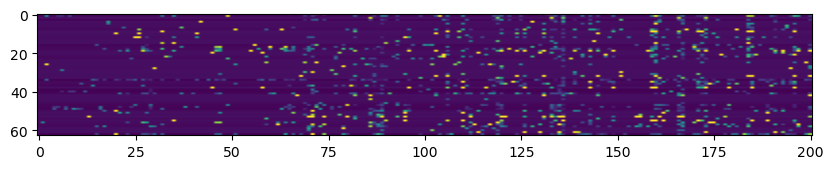

In [16]:
plt.subplots(ncols=1,nrows=1,figsize=(10,5))
plt.imshow(concatenated_spike_counts,aspect = 0.5,vmax = 3)

In [17]:
concatenated_spike_counts_nonan_ind = np.sum(np.isinf(concatenated_spike_counts),axis = 1) == 0
concatenated_spike_counts_nonan =concatenated_spike_counts[concatenated_spike_counts_nonan_ind,:]
cell_list_nonan = [cell_list[u] for u in np.argwhere(concatenated_spike_counts_nonan_ind).ravel()]

In [18]:
# for later plotting
neural_df = pd.DataFrame(data = concatenated_spike_counts_nonan.T, index=binned_t,columns=cell_list_nonan)
neural_df.index.name='time'
neural_df=xr.Dataset.from_dataframe(neural_df)

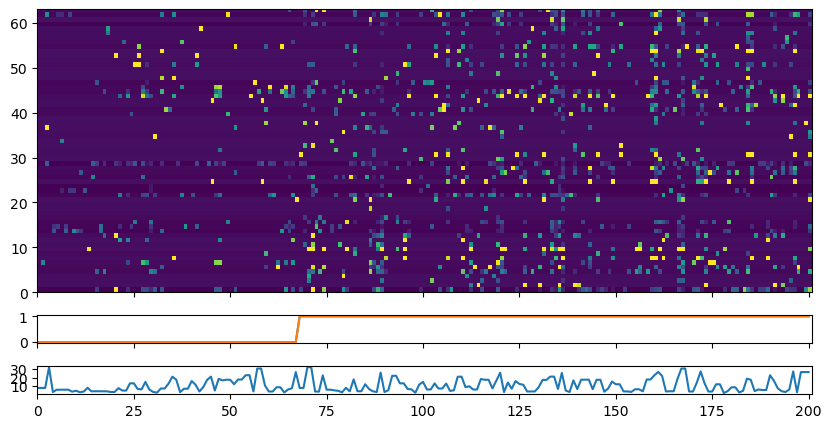

In [19]:
fig, axes = plt.subplots(ncols=1,nrows=3,figsize=(10,5),height_ratios=[10, 1,1],sharex = True)
axes[0].imshow(concatenated_spike_counts_nonan,extent=[0, concatenated_spike_counts_nonan.shape[1], 0, concatenated_spike_counts_nonan.shape[0]],
               aspect = 'auto',vmax = 3)
axes[1].plot(concatenated_spike_counts_label)
axes[1].plot(concatenated_spike_counts_label)
axes[2].plot(np.array(ripple_times.loc[concatenated_ripple_ids].max_zscore))

### Do LDA

In [20]:
from time import time

from sklearn.decomposition import NMF, LatentDirichletAllocation, MiniBatchNMF
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [21]:
# parameters
n_components = 10

In [22]:
# data engineering
# use only the positive numbers: I zero out negative entries

concatenated_spike_counts_pos = concatenated_spike_counts_nonan.copy()
concatenated_spike_counts_pos[concatenated_spike_counts_pos < 0] = 0

In [23]:
lda = LatentDirichletAllocation(
    n_components=n_components,
    max_iter=20,
    learning_method="online",
    learning_offset=50.0,
    random_state=0,
)
t0 = time()
lda.fit(concatenated_spike_counts_pos.T)
print("done in %0.3fs." % (time() - t0))

# get weight for each neuron in each component
lda_vectors = lda.components_ / lda.components_.sum(axis=1)[:, np.newaxis]

done in 0.602s.


In [24]:
# get assembly_activities and sort weight vectors by decreasing variance
lda_assembly_activities = np.square(lda_vectors @ concatenated_spike_counts_nonan)
row_variances = np.var(lda_assembly_activities, axis=1)
order_ind = np.argsort(row_variances)[::-1]
lda_vectors = lda_vectors[order_ind] # sort in descending order
lda_assembly_activities = lda_assembly_activities[order_ind,:]

In [25]:
print(lda_vectors.shape)
print(lda_assembly_activities.shape)

(10, 63)
(10, 201)


In [26]:
neurons_ind_lda, neurons_labels_lda = order_by_weight(lda_vectors)
replay_ind_lda, replay_labels_lda = order_by_weight(lda_assembly_activities)

In [27]:
norm = mpl.colors.Normalize(vmin=np.min(binned_t), vmax=np.max(binned_t), clip=False)
color_ind = norm(np.array(binned_t)[replay_ind_lda])  # [-0.5, 0., 0.5, 1., 1.5]
cmap = plt.cm.jet

### Plot by rearranging both rows and columns

Text(0.5, 1.0, 'LDA\neliot20221023_.nwb 02_Seq2Session1')

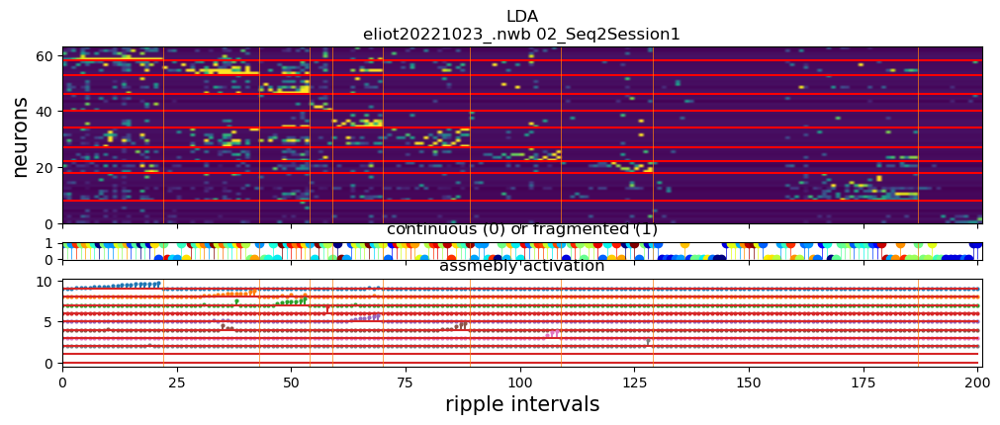

In [28]:
neurons_ind = neurons_ind_lda
replay_ind = replay_ind_lda
neurons_labels = neurons_labels_lda
replay_labels = replay_labels_lda
assembly_activities = lda_assembly_activities


num_components = assembly_activities.shape[0]
num_neuron = concatenated_spike_counts_nonan.shape[0]

fig, axes = plt.subplots(ncols=1,nrows=3,figsize=(12,len(neurons_labels_lda)/15),height_ratios=[10, 1,5],sharex = True)
spike_counts_reordered = concatenated_spike_counts_nonan[neurons_ind,:][:,replay_ind]

# we will plot neurons in the order of ICA and color code LDA groups
"""
labels = np.unique(neurons_labels)
for l in labels:
    neurons_in_l = (neurons_ind[neurons_labels == l])
    for row_ind in np.argwhere(np.isin(neurons_ind,neurons_in_l)).ravel():
        axes[0].axhline(num_neuron - row_ind - 1,color = 'C'+str(int(l)),linewidth = 1)
"""
        
axes[0].imshow(spike_counts_reordered,
               extent=[0, concatenated_spike_counts_nonan.shape[1], 0, len(neurons_ind)],
               vmax = 3,
               aspect = 'auto')

# mark assembly horizonal lines
for row_ind in np.argwhere(np.diff(neurons_labels[::-1])).ravel():
    axes[0].axhline(row_ind + 1,color = 'r')
axes[0].set_ylabel('neurons',fontsize = 15) 

for replay_ind_ind in range(len(replay_ind)):
    markerline, stemlines, baseline = axes[1].stem(replay_ind_ind,
             concatenated_spike_counts_label[replay_ind[replay_ind_ind]],
                 cmap(color_ind[replay_ind_ind]))
    plt.setp(stemlines, 'linewidth', 0.5)
    
    #axes[1].stem(np.arange(concatenated_spike_counts_nonan.shape[1]),
    #         concatenated_spike_counts_label[replay_ind], color_ind, markerfmt = 'k')
axes[1].set_title("continuous (0) or fragmented (1)")


ind = num_components - 1
for vector_ind in range(num_components):
    ic_assembly_activity = np.log(assembly_activities[vector_ind][replay_ind])
    ic_assembly_activity[ic_assembly_activity < 0] = 0
    offset = ind*2
    markers, stemlines, baseline = axes[2].stem(
        np.arange(concatenated_spike_counts_nonan.shape[1]),
        (ic_assembly_activity/np.nanmax(ic_assembly_activity)) * 0.8 + ind,  linefmt = "C"+str(vector_ind),
                 bottom=ind,label = "assembly "+str(ind))
    plt.setp(markers, markersize=2)

    axes[2].set_title("assmebly activation")
    axes[2].set_ylabel('')
    ind -= 1
axes[2].set_xlabel('ripple intervals')


# mark assembly vertical lines
for row_ind in np.argwhere(np.diff(replay_labels)).ravel():
    axes[0].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
    axes[1].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
    axes[2].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)


    
#plt.legend()

plt.xlabel('ripple intervals',fontsize = 15)
axes[0].set_title("LDA\n" + nwb_copy_file_name + ' ' +session_name)

### Plot by rearranging only rows, columns ordered in time

Text(0.5, 1.0, 'LDA\neliot20221023_.nwb 02_Seq2Session1')

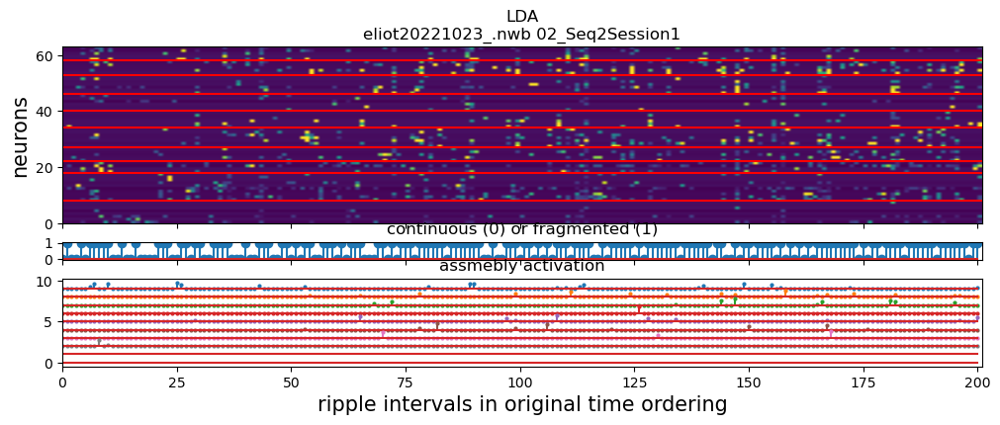

In [29]:
neurons_ind = neurons_ind_lda
replay_ind = np.argsort(binned_t)
neurons_labels = neurons_labels_lda
replay_labels = replay_labels_lda
assembly_activities = lda_assembly_activities


num_components = assembly_activities.shape[0]
num_neuron = concatenated_spike_counts_nonan.shape[0]

fig, axes = plt.subplots(ncols=1,nrows=3,figsize=(12,len(neurons_labels_lda)/15),height_ratios=[10, 1,5],sharex = True)
spike_counts_reordered = concatenated_spike_counts_nonan[neurons_ind,:][:,replay_ind]

# we will plot neurons in the order of ICA and color code LDA groups
"""
labels = np.unique(neurons_labels)
for l in labels:
    neurons_in_l = (neurons_ind[neurons_labels == l])
    for row_ind in np.argwhere(np.isin(neurons_ind,neurons_in_l)).ravel():
        axes[0].axhline(num_neuron - row_ind - 1,color = 'C'+str(int(l)),linewidth = 1)
"""
        
axes[0].imshow(spike_counts_reordered,
               extent=[0, concatenated_spike_counts_nonan.shape[1], 0, len(neurons_ind)],
               vmax = 3,
               aspect = 'auto')

# mark assembly horizonal lines
for row_ind in np.argwhere(np.diff(neurons_labels[::-1])).ravel():
    axes[0].axhline(row_ind + 1,color = 'r')
axes[0].set_ylabel('neurons',fontsize = 15) 


    
axes[1].stem(np.arange(concatenated_spike_counts_nonan.shape[1]),
             concatenated_spike_counts_label[replay_ind])
axes[1].set_title("continuous (0) or fragmented (1)")


ind = num_components - 1
for vector_ind in range(num_components):
    ic_assembly_activity = np.log(assembly_activities[vector_ind][replay_ind])
    ic_assembly_activity[ic_assembly_activity < 0] = 0
    offset = ind*2
    markers, stemlines, baseline = axes[2].stem(
        np.arange(concatenated_spike_counts_nonan.shape[1]),
        (ic_assembly_activity/np.nanmax(ic_assembly_activity)) * 0.8 + ind,  linefmt = "C"+str(vector_ind),
                 bottom=ind,label = "assembly "+str(ind))
    plt.setp(markers, markersize=2)

    axes[2].set_title("assmebly activation")
    axes[2].set_ylabel('')
    ind -= 1
axes[2].set_xlabel('ripple intervals')


#plt.legend()

plt.xlabel('ripple intervals in original time ordering',fontsize = 15)
axes[0].set_title("LDA\n" + nwb_copy_file_name + ' ' +session_name)

### Do ICA

In [30]:
ic_vectors, pc_vectors, eigenvalues, lambda_min, lambda_max, ic_assembly_activities = compute_assembly_vectors(
    concatenated_spike_counts_nonan)

print(ic_vectors.shape)
print(ic_assembly_activities.shape)

(4, 63)
(4, 201)


In [31]:
neurons_ind_ic, neurons_labels_ic = order_by_weight(ic_vectors)
replay_ind_ic, replay_labels_ic = order_by_weight(ic_assembly_activities)

Text(0.5, 1.0, 'ICA\neliot20221023_.nwb 02_Seq2Session1')

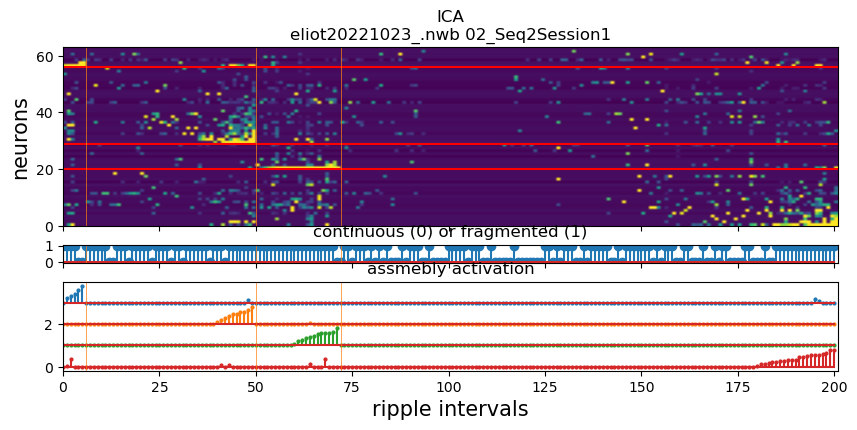

In [32]:
neurons_ind = neurons_ind_ic
neurons_ind2 = neurons_ind_ic
replay_ind = replay_ind_ic
neurons_labels = neurons_labels_ic
replay_labels = replay_labels_ic
assembly_activities = ic_assembly_activities


num_components = assembly_activities.shape[0]
num_neuron = concatenated_spike_counts_nonan.shape[0]

fig, axes = plt.subplots(ncols=1,nrows=3,figsize=(10,len(neurons_labels_lda)/15),height_ratios=[10, 1,5],sharex = True)
spike_counts_reordered = concatenated_spike_counts_nonan[neurons_ind2,:][:,replay_ind]

# we will plot neurons in the order of ICA and color code LDA groups
"""
labels = np.unique(neurons_labels_lda)
for l in labels:
    neurons_in_l = (neurons_ind_lda[neurons_labels_lda == l])
    for row_ind in np.argwhere(np.isin(neurons_ind,neurons_in_l)).ravel():
        axes[0].axhline(num_neuron - row_ind - 1,color = 'C'+str(int(l)),linewidth = 1)
"""
        
axes[0].imshow(spike_counts_reordered,
               extent=[0, concatenated_spike_counts_nonan.shape[1], 0, len(neurons_ind)],
               vmax = 3,
               aspect = 'auto')

# mark assembly horizonal lines
for row_ind in np.argwhere(np.diff(neurons_labels[::-1])).ravel():
    axes[0].axhline(row_ind + 1,color = 'r')
axes[0].set_ylabel('neurons',fontsize = 15) 

axes[1].stem(np.arange(concatenated_spike_counts_nonan.shape[1]),
             concatenated_spike_counts_label[replay_ind])
axes[1].set_title("continuous (0) or fragmented (1)")


ind = num_components - 1
for vector_ind in range(num_components):
    ic_assembly_activity = np.log(assembly_activities[vector_ind][replay_ind])
    ic_assembly_activity[ic_assembly_activity < 0] = 0
    offset = ind*2
    markers, stemlines, baseline = axes[2].stem(
        np.arange(concatenated_spike_counts_nonan.shape[1]),
        (ic_assembly_activity/np.nanmax(ic_assembly_activity)) * 0.8 + ind,  linefmt = "C"+str(vector_ind),
                 bottom=ind,label = "assembly "+str(ind))
    plt.setp(markers, markersize=2)

    axes[2].set_title("assmebly activation")
    axes[2].set_ylabel('')
    ind -= 1
axes[2].set_xlabel('ripple intervals')


# mark assembly vertical lines

for row_ind in np.argwhere(np.diff(replay_labels)).ravel():
    axes[0].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
    axes[1].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
    axes[2].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)


    
#plt.legend()

plt.xlabel('ripple intervals',fontsize = 15)
axes[0].set_title("ICA\n" + nwb_copy_file_name + ' ' +session_name)

### Compare LDA ICA with MDS

Text(0.5, 1.0, 'ICA row ordered by LDA\neliot20221023_.nwb 02_Seq2Session1')

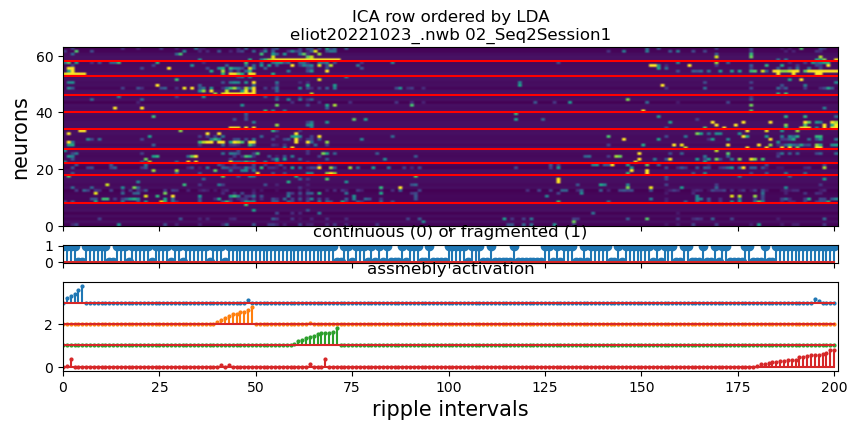

In [35]:
neurons_ind = neurons_ind_ic
neurons_ind2 = neurons_ind_lda
replay_ind = replay_ind_ic
neurons_labels = neurons_labels_lda
replay_labels = replay_labels_ic
assembly_activities = ic_assembly_activities


num_components = assembly_activities.shape[0]
num_neuron = concatenated_spike_counts_nonan.shape[0]

fig, axes = plt.subplots(ncols=1,nrows=3,figsize=(10,len(neurons_labels)/15),height_ratios=[10, 1,5],sharex = True)
spike_counts_reordered = concatenated_spike_counts_nonan[neurons_ind2,:][:,replay_ind]

# we will plot neurons in the order of ICA and color code LDA groups
"""
labels = np.unique(neurons_labels_lda)
for l in labels:
    neurons_in_l = (neurons_ind_lda[neurons_labels_lda == l])
    for row_ind in np.argwhere(np.isin(neurons_ind,neurons_in_l)).ravel():
        axes[0].axhline(num_neuron - row_ind - 1,color = 'C'+str(int(l)),linewidth = 1)
"""
        
axes[0].imshow(spike_counts_reordered,
               extent=[0, concatenated_spike_counts_nonan.shape[1], 0, len(neurons_ind)],
               vmax = 3,
               aspect = 'auto')

# mark assembly horizonal lines

for row_ind in np.argwhere(np.diff(neurons_labels[::-1])).ravel():
    axes[0].axhline(row_ind + 1,color = 'r')

axes[0].set_ylabel('neurons',fontsize = 15) 

axes[1].stem(np.arange(concatenated_spike_counts_nonan.shape[1]),
             concatenated_spike_counts_label[replay_ind])
axes[1].set_title("continuous (0) or fragmented (1)")


ind = num_components - 1
for vector_ind in range(num_components):
    ic_assembly_activity = np.log(assembly_activities[vector_ind][replay_ind])
    ic_assembly_activity[ic_assembly_activity < 0] = 0
    offset = ind*2
    markers, stemlines, baseline = axes[2].stem(
        np.arange(concatenated_spike_counts_nonan.shape[1]),
        (ic_assembly_activity/np.nanmax(ic_assembly_activity)) * 0.8 + ind,  linefmt = "C"+str(vector_ind),
                 bottom=ind,label = "assembly "+str(ind))
    plt.setp(markers, markersize=2)

    axes[2].set_title("assmebly activation")
    axes[2].set_ylabel('')
    ind -= 1
axes[2].set_xlabel('ripple intervals')


# mark assembly vertical lines
"""
for row_ind in np.argwhere(np.diff(replay_labels)).ravel():
    axes[0].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
    axes[1].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
    axes[2].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
"""

    
#plt.legend()

plt.xlabel('ripple intervals',fontsize = 15)
axes[0].set_title("ICA row ordered by LDA\n" + nwb_copy_file_name + ' ' +session_name)

Text(0.5, 1.0, 'ICA\neliot20221023_.nwb 02_Seq2Session1')

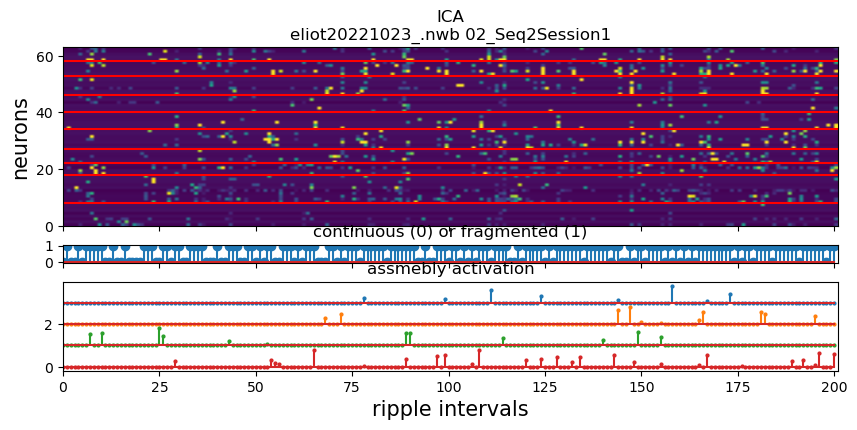

In [34]:
# order columns by time

neurons_ind = neurons_ind_ic
neurons_ind2 = neurons_ind_lda
replay_ind = np.argsort(binned_t)
neurons_labels = neurons_labels_lda
replay_labels = replay_labels_ic
assembly_activities = ic_assembly_activities


num_components = assembly_activities.shape[0]
num_neuron = concatenated_spike_counts_nonan.shape[0]

fig, axes = plt.subplots(ncols=1,nrows=3,figsize=(10,len(neurons_labels)/15),height_ratios=[10, 1,5],sharex = True)
spike_counts_reordered = concatenated_spike_counts_nonan[neurons_ind2,:][:,replay_ind]

# we will plot neurons in the order of ICA and color code LDA groups
"""
labels = np.unique(neurons_labels_lda)
for l in labels:
    neurons_in_l = (neurons_ind_lda[neurons_labels_lda == l])
    for row_ind in np.argwhere(np.isin(neurons_ind,neurons_in_l)).ravel():
        axes[0].axhline(num_neuron - row_ind - 1,color = 'C'+str(int(l)),linewidth = 1)
"""
        
axes[0].imshow(spike_counts_reordered,
               extent=[0, concatenated_spike_counts_nonan.shape[1], 0, len(neurons_ind)],
               vmax = 3,
               aspect = 'auto')

# mark assembly horizonal lines

for row_ind in np.argwhere(np.diff(neurons_labels[::-1])).ravel():
    axes[0].axhline(row_ind + 1,color = 'r')

axes[0].set_ylabel('neurons',fontsize = 15) 

axes[1].stem(np.arange(concatenated_spike_counts_nonan.shape[1]),
             concatenated_spike_counts_label[replay_ind])
axes[1].set_title("continuous (0) or fragmented (1)")


ind = num_components - 1
for vector_ind in range(num_components):
    ic_assembly_activity = np.log(assembly_activities[vector_ind][replay_ind])
    ic_assembly_activity[ic_assembly_activity < 0] = 0
    offset = ind*2
    markers, stemlines, baseline = axes[2].stem(
        np.arange(concatenated_spike_counts_nonan.shape[1]),
        (ic_assembly_activity/np.nanmax(ic_assembly_activity)) * 0.8 + ind,  linefmt = "C"+str(vector_ind),
                 bottom=ind,label = "assembly "+str(ind))
    plt.setp(markers, markersize=2)

    axes[2].set_title("assmebly activation")
    axes[2].set_ylabel('')
    ind -= 1
axes[2].set_xlabel('ripple intervals')


# mark assembly vertical lines
"""
for row_ind in np.argwhere(np.diff(replay_labels)).ravel():
    axes[0].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
    axes[1].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
    axes[2].axvline(row_ind + 1,color = 'C1',linewidth = 0.5)
"""

    
#plt.legend()

plt.xlabel('ripple intervals',fontsize = 15)
axes[0].set_title("ICA\n" + nwb_copy_file_name + ' ' +session_name)

In [252]:
print(lda_vectors.shape)

(10, 251)


In [253]:
from sklearn.manifold import MDS
embedding_lda = MDS(n_components=3, n_init=1)
lda_transformed = embedding_lda.fit_transform(lda.components_.T)
#lda_transformed = embedding_lda.fit_transform(lda_vectors.T) # the input is of num_samples x num_features
lda_transformed.shape

(251, 3)

In [254]:
embedding_ic = MDS(n_components=3, n_init=1)
ic_transformed = embedding_ic.fit_transform(ic_vectors.T) # the input is of num_samples x num_features
ic_transformed.shape

(251, 3)

In [255]:
from mpl_toolkits.mplot3d import Axes3D

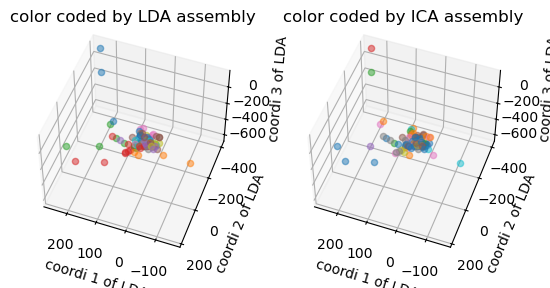

In [48]:
#%matplotlib widget
elev, azim = (50, 110)

# Create a figure and a 3D subplot
fig = plt.figure()

ax = fig.add_subplot(1,2,1,projection='3d')
neurons_labels = neurons_labels_lda
neurons_inds = neurons_ind_lda

# Create the scatter plot
for neuron_ind in range(lda_transformed.shape[0]):
    ax.scatter(lda_transformed[neuron_ind,0],
        lda_transformed[neuron_ind,1],
        lda_transformed[neuron_ind,2],
              color = 'C'+str(int( neurons_labels[neurons_inds == neuron_ind])),
              alpha = 0.5)

# Set labels
ax.set_xlabel('coordi 1 of LDA')
ax.set_ylabel('coordi 2 of LDA')
ax.set_zlabel('coordi 3 of LDA')
ax.view_init(elev = elev, azim = azim)
ax.set_title("color coded by LDA assembly")


ax = fig.add_subplot(1,2,2,projection='3d')
neurons_labels = neurons_labels_ic
neurons_inds = neurons_ind_ic

# Create the scatter plot
for neuron_ind in range(lda_transformed.shape[0]):
    ax.scatter(lda_transformed[neuron_ind,0],
        lda_transformed[neuron_ind,1],
        lda_transformed[neuron_ind,2],
              color = 'C'+str(int( neurons_labels[neurons_inds == neuron_ind])),
              alpha = 0.5)

# Set labels
ax.set_xlabel('coordi 1 of LDA')
ax.set_ylabel('coordi 2 of LDA')
ax.set_zlabel('coordi 3 of LDA')
ax.set_title("color coded by ICA assembly")

ax.view_init(elev = elev, azim = azim)

# Show the plot
plt.show()

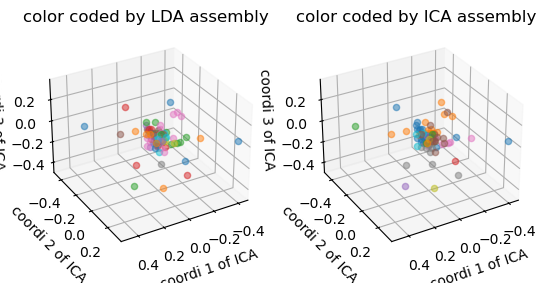

In [44]:
#%matplotlib widget
elev, azim = (30, 60)

# Create a figure and a 3D subplot
fig = plt.figure()

ax = fig.add_subplot(1,2,1,projection='3d')
neurons_labels = neurons_labels_lda
neurons_inds = neurons_ind_lda

# Create the scatter plot
for neuron_ind in range(lda_transformed.shape[0]):
    ax.scatter(ic_transformed[neuron_ind,0],
        ic_transformed[neuron_ind,1],
        ic_transformed[neuron_ind,2],
              color = 'C'+str(int( neurons_labels[neurons_inds == neuron_ind])),
              alpha = 0.5)

# Set labels
ax.set_xlabel('coordi 1 of ICA')
ax.set_ylabel('coordi 2 of ICA')
ax.set_zlabel('coordi 3 of ICA')
ax.view_init(elev = elev, azim = azim)
ax.set_title("color coded by LDA assembly")


ax = fig.add_subplot(1,2,2,projection='3d')
neurons_labels = neurons_labels_ic
neurons_inds = neurons_ind_ic

# Create the scatter plot
for neuron_ind in range(lda_transformed.shape[0]):
    ax.scatter(ic_transformed[neuron_ind,0],
        ic_transformed[neuron_ind,1],
        ic_transformed[neuron_ind,2],
              color = 'C'+str(int( neurons_labels[neurons_inds == neuron_ind])),
              alpha = 0.5)

# Set labels
ax.set_xlabel('coordi 1 of ICA')
ax.set_ylabel('coordi 2 of ICA')
ax.set_zlabel('coordi 3 of ICA')
ax.set_title("color coded by ICA assembly")

ax.view_init(elev = elev, azim = azim)

# Show the plot
plt.show()

### Include some behavior information

In [89]:
neurons_ind = neurons_ind_ic
replay_ind = replay_ind_ic
neurons_labels = neurons_labels_ic
replay_labels = replay_labels_ic
assembly_activities = ic_assembly_activities

In [97]:
neurons_ind = neurons_ind_lda
replay_ind = replay_ind_lda
neurons_labels = neurons_labels_lda
replay_labels = replay_labels_lda
assembly_activities = lda_assembly_activities

In [98]:
trial_number = np.array(ripple_times.loc[concatenated_ripple_ids[replay_ind]].trial_number)
animal_location = np.array(ripple_times.loc[concatenated_ripple_ids[replay_ind]].animal_location)

In [99]:
loc2num = {"home":0,'center1':5,'center2':5,'center3':5,'center4':5,
           'well1':1,'well2':2,
          'well3':3,'well4':4,'arm0':0,'well0':0,
           'arm1':1,'arm2':2,
          'arm3':3,'arm4':4}

In [100]:
animal_location_num = [loc2num[l] for l in animal_location]

In [101]:
#log_df

In [141]:
OuterWellIndex = log_df.loc[trial_number].OuterWellIndex
current = log_df.loc[trial_number].current
future_H = log_df.loc[trial_number].future_H
future_O = log_df.loc[trial_number].future_O
past_reward = log_df.loc[trial_number].past_reward
past = log_df.loc[trial_number].past
rewardNum = log_df.loc[trial_number].rewardNum

In [149]:
neurons_ind = neurons_ind_lda
replay_ind = replay_ind_lda #np.argsort(binned_t)
neurons_labels = neurons_labels_lda
replay_labels = replay_labels_lda
assembly_activities = lda_assembly_activities

Text(0.5, 0, 'ripple intervals')

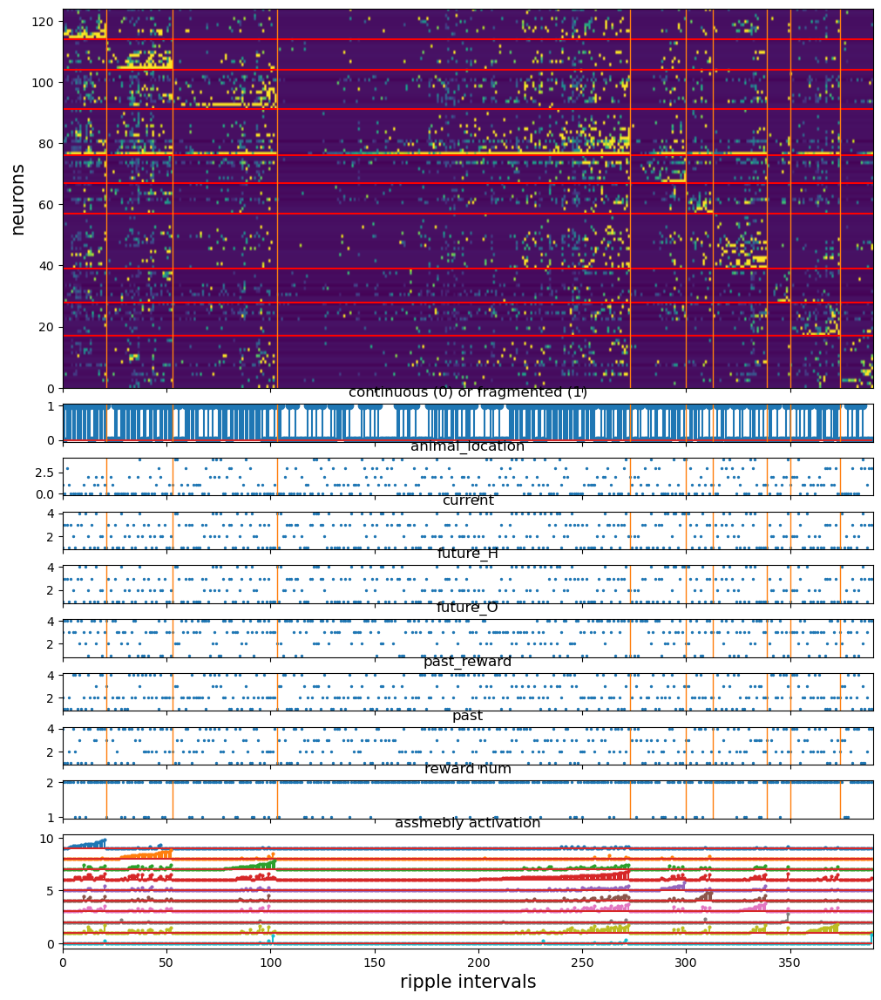

In [150]:
fig, axes = plt.subplots(ncols=1,nrows=10,figsize=(12,14),height_ratios=[10,1,1,1,1,1,1,1,1,3],sharex = True)
spike_counts_reordered = concatenated_spike_counts_nonan[neurons_ind,:][:,replay_ind]

axes[0].imshow(spike_counts_reordered,
               extent=[0, concatenated_spike_counts_nonan.shape[1], 0, len(neurons_ind)],
               vmax = 3,
               aspect = 'auto')

# mark assembly horizonal lines
for row_ind in np.argwhere(np.diff(neurons_labels[::-1])).ravel():
    axes[0].axhline(row_ind + 1,color = 'r')
axes[0].set_ylabel('neurons',fontsize = 15) 

axes[1].stem(np.arange(concatenated_spike_counts_nonan.shape[1]),
             concatenated_spike_counts_label[replay_ind])
axes[1].set_title("continuous (0) or fragmented (1)")

axes[2].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),animal_location_num,s = 2)
axes[2].set_title("animal_location")
axes[3].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),current,s = 2)
axes[3].set_title("current")
axes[4].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),future_H,s = 2)
axes[4].set_title("future_H")
axes[5].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),future_O,s = 2)
axes[5].set_title("future_O")
axes[6].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),past_reward,s = 2)
axes[6].set_title("past_reward")
axes[7].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),past,s = 2)
axes[7].set_title("past")
axes[8].scatter(np.arange(concatenated_spike_counts_nonan.shape[1]),rewardNum,s = 2)
axes[8].set_title("reward num")

ind = num_components - 1
for vector_ind in range(num_components):
    ic_assembly_activity = np.log(assembly_activities[vector_ind][replay_ind])
    ic_assembly_activity[ic_assembly_activity < 0] = 0
    offset = ind*2
    markers, stemlines, baseline = axes[9].stem(
        np.arange(concatenated_spike_counts_nonan.shape[1]),
        (ic_assembly_activity/np.nanmax(ic_assembly_activity)) * 0.8 + ind,  linefmt = "C"+str(vector_ind),
                 bottom=ind,label = "assembly "+str(ind))
    plt.setp(markers, markersize=2)

    axes[9].set_title("assmebly activation")
    axes[9].set_ylabel('')
    ind -= 1

# mark assembly vertical lines
for row_ind in np.argwhere(np.diff(replay_labels)).ravel():
    for axes_ind in range(9):
        axes[axes_ind].axvline(row_ind + 1,color = 'C1',linewidth = 1)
    
#plt.legend()
plt.xlabel('ripple intervals',fontsize = 15)

### Inspect decodes

In [96]:
# 2. load decode
encoding_set = "2Dheadspeed_above_4"
decoder_lk = "default_decoding_gpu_4armMaze_W20msO10ms"
decoder_ss = "default_decoding_gpu_4armMaze"

key_lk = {'nwb_file_name': nwb_copy_file_name,
          "encoding_set":encoding_set,"interval_list_name": session_name,
          "classifier_param_name": decoder_lk}

key_ss = {'nwb_file_name': nwb_copy_file_name,
          "encoding_set":encoding_set,"interval_list_name": session_name,
          "classifier_param_name": decoder_ss}


# load statescript decoder
decode_ss = load_decode(nwb_copy_file_name, session_name, key_ss["classifier_param_name"], encoding_set)
# load lk decoder
decode_lk = load_decode(nwb_copy_file_name, session_name, key_lk["classifier_param_name"], encoding_set)

DataJointError: fetch1 should only return one tuple. 0 tuples found

In [144]:
# Load state script
key={'nwb_file_name':nwb_copy_file_name,'epoch':int(session_name[:2])}
log=(TrialChoice & key).fetch1('choice_reward')
epoch_name=(TrialChoice & key).fetch1('epoch_name')
epoch_pos_name = (EpochPos() & key).fetch1('position_interval')
print('epoch name',epoch_name)
print('epoch_pos_name',epoch_pos_name)
log_df=pd.DataFrame(log)

# load position
position_info=load_position(nwb_copy_file_name,epoch_pos_name)

head_speed=xr.Dataset.from_dataframe(pd.DataFrame(position_info['head_speed']))
head_orientation=xr.Dataset.from_dataframe(pd.DataFrame(position_info['head_orientation']))

# load linear position
linear_position_df = xr.Dataset.from_dataframe((IntervalLinearizedPosition() &
                          {'nwb_file_name': nwb_copy_file_name,
                           'interval_list_name': epoch_pos_name,
                           'position_info_param_name': 'default_decoding'}
                         ).fetch1_dataframe())

[2025-06-13 14:13:07,648][WARNING]: Skipped checksum for file with hash: 6cfcf895-2e2b-bb17-c3d1-9422e1618213, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_R4LWKFUE59.nwb
[2025-06-13 14:13:07,659][WARNING]: Skipped checksum for file with hash: 6cfcf895-2e2b-bb17-c3d1-9422e1618213, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_R4LWKFUE59.nwb
[2025-06-13 14:13:07,664][WARNING]: Skipped checksum for file with hash: 6cfcf895-2e2b-bb17-c3d1-9422e1618213, and path: /stelmo/nwb/analysis/lewis20240109/lewis20240109_R4LWKFUE59.nwb
[14:13:07][WARNING] Spyglass: Deprecation: this class has been moved out of spyglass.common.common_position
	IntervalLinearizedPosition -> spyglass.linearization.v0.main.IntervalLinearizedPosition
Please use the new location.
	IntervalLinearizedPosition -> spyglass.linearization.v0.main.IntervalLinearizedPosition
Please use the new location.
[2025-06-13 14:13:07,695][WARNING]: Skipped checksum for file with hash: a0b23751-0c50-c10d-db95-1693

epoch name 02_Rev2Session1
epoch_pos_name pos 1 valid times


In [145]:
# MUA
mua_path=(MUA & {'nwb_file_name': nwb_copy_file_name,
                 'interval_list_name':session_name}).fetch1('mua_trace')
mua_xr = xr.open_dataset(mua_path)
mua_threshold=(MUA & {'nwb_file_name': nwb_copy_file_name,
                      'interval_list_name':session_name}).fetch1('mean')

In [55]:
ic_vector_ind = 5
ic_assembly_activity = ic_assembly_activities[ic_vector_ind]
ic_ripples = np.argwhere(ic_assembly_activity > np.quantile(ic_assembly_activity,0.95)).ravel()
print(ic_ripples)

[ 73  90 113 119 127 135 162 166 178 208 216 217 259 266 269]


In [353]:
concatenated_ripple_ids[ic_ripples]

array([153,  10,  15,  27,  31,  39,  41,  94,  95,  97, 119, 119, 132,
       148, 178])

In [384]:
i = 14
ripple_loc = concatenated_ripple_ids[ic_ripples[i]]
plottimes = [ripple_times.loc[ripple_loc].start_time,ripple_times.loc[ripple_loc].end_time]
print("ripple_loc = ", ripple_loc)
t0t1 = [list_of_bins[ic_ripples[i]][0],list_of_bins[ic_ripples[i]][1]]
print("t0t1 = [" + str(list_of_bins[ic_ripples[i]][0]) + "," + str(list_of_bins[ic_ripples[i]][-1]) + "]") #looking i th ripples's 5ms bins

ripple_loc =  178
t0t1 = [1704829907.340213,1704829907.3952143]


In [399]:
%debug

> /home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/pandas/core/indexes/base.py(570)__new__()
    568                 raise cls._raise_scalar_data_error(data) from err
    569             if "Data must be 1-dimensional" in str(err):
--> 570                 raise ValueError("Index data must be 1-dimensional") from err
    571             raise
    572         arr = ensure_wrapped_if_datetimelike(arr)



ipdb>  u


> /home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/xarray/core/indexes.py(469)safe_cast_to_index()
    467                 kwargs["dtype"] = "float64"
    468 
--> 469         index = pd.Index(np.asarray(array), **kwargs)
    470 
    471     return _maybe_cast_to_cftimeindex(index)



ipdb>  u


> /home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/xarray/core/indexes.py(582)__init__()
    580         # here or in other constructors (cannot use pd.Index.rename as this
    581         # constructor is also called from PandasMultiIndex)
--> 582         index = safe_cast_to_index(array).copy()
    583 
    584         if index.name is None:



ipdb>  u


> /home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/xarray/core/dataset.py(7096)to_dataarray()
   7094         coords = {k: v.variable for k, v in self.coords.items()}
   7095         indexes = filter_indexes_from_coords(self._indexes, set(coords))
-> 7096         new_dim_index = PandasIndex(list(self.data_vars), dim)
   7097         indexes[dim] = new_dim_index
   7098         coords.update(new_dim_index.create_variables())



ipdb>  u


> /home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/xarray/core/dataset.py(7106)to_array()
   7104     ) -> DataArray:
   7105         """Deprecated version of to_dataarray"""
-> 7106         return self.to_dataarray(dim=dim, name=name)
   7107 
   7108     def _normalize_dim_order(



ipdb>  u


> /home/shijiegu/Documents/spyglass/src/spyglass/shijiegu/ripple_add_replay.py(619)plot_decode_spiking()
    617                 axes[3].set_title('spiking, each row is a tetrode channel',size=10)
    618     elif plot_spiking == 2:
--> 619         spike_d=np.array(neural_subset.to_array()).astype('int32').T
    620         spike_t=np.array(neural_subset.time)
    621         axes[3].imshow(spike_d,extent=[0, spike_d.shape[1], 0, spike_d.shape[0]],



ipdb>  type(neural_subset)


<class 'xarray.core.dataset.Dataset'>


ipdb>  neural_subset


<xarray.Dataset> Size: 15kB
Dimensions:   (time: 7)
Coordinates:
  * time      (time) float64 56B 1.705e+09 1.705e+09 ... 1.705e+09 1.705e+09
Data variables: (12/264)
    (0, 3)    (time) float64 56B -0.1445 -0.1445 -0.1445 ... -0.1445 -0.1445
    (0, 4)    (time) float64 56B -0.1027 1.846 -0.1027 ... -0.1027 -0.1027
    (0, 5)    (time) float64 56B 1.494 -0.05697 -0.05697 ... -0.05697 -0.05697
    (0, 6)    (time) float64 56B -0.115 -0.115 -0.115 ... -0.115 -0.115 -0.115
    (0, 7)    (time) float64 56B -0.02091 -0.02091 ... -0.02091 -0.02091
    (0, 11)   (time) float64 56B -0.06554 -0.06554 ... -0.06554 -0.06554
    ...        ...
    (63, 3)   (time) float64 56B -0.05707 -0.05707 2.971 ... 1.503 -0.05707
    (63, 4)   (time) float64 56B -0.02777 -0.02777 ... -0.02777 -0.02777
    (63, 6)   (time) float64 56B -0.08669 -0.08669 ... -0.08669 -0.08669
    (63, 7)   (time) float64 56B -0.1172 -0.1172 -0.1172 ... -0.1172 -0.1172
    (63, 8)   (time) float64 56B -0.09236 -0.09236 1.152 ..

ipdb>  exit


no ripples during this time. None


ValueError: Index data must be 1-dimensional

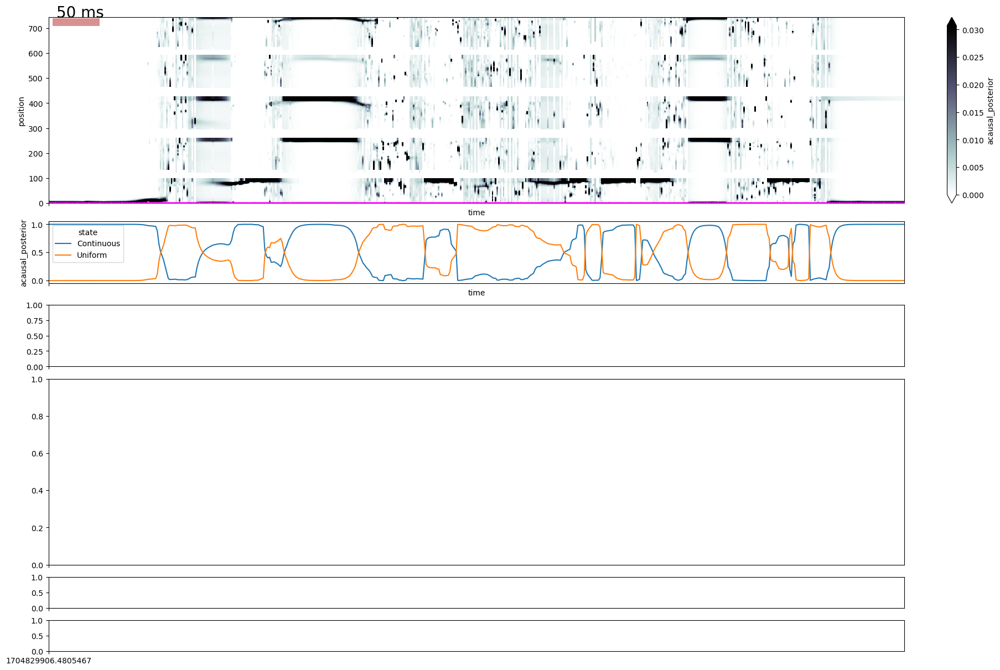

In [398]:
axes = plot_decode_spiking(plottimes,np.array(t0t1).reshape((1,-1)),linear_position_df,decode_ss,None,None,
                    neural_df,mua_xr,head_speed,head_orientation,
                    ripple_consensus_trace=None,plot_spiking=2,
                    title=None,savefolder=[],savename=None,
                    simple=True,tetrode2ind = None,mua_thresh = mua_threshold,
                    causal = False,likelihood = False)

In [309]:
ripple_times.loc[22:40]

,event_number,start_time,animal_location,trial_number,cont_intvl,frag_intvl,cont_intvl_replay,end_time,duration,mean_zscore,median_zscore,max_zscore,min_zscore,max_speed,min_speed,median_speed,mean_speed
22,23,1.704828e+09,home,10,"[[1704827805.9446096, 1704827806.0606096], [17...","[[1704827806.0626097, 1704827806.0846095], [17...","[[0], []]",1.704828e+09,0.320000,0.576956,-0.264985,5.487296,-1.118266,0.251573,0.251570,0.251571,0.251571
23,24,1.704828e+09,home,11,"[[1704827853.2546008, 1704827853.3906007], [17...","[[1704827853.4846003, 1704827853.568601]]","[[0], [], [0]]",1.704828e+09,0.392001,1.348274,0.335541,6.461219,-0.912350,2.914536,0.665200,2.093517,1.960921
24,25,1.704828e+09,home,11,"[[1704827854.5006003, 1704827854.8166003]]",[],[[2]],1.704828e+09,0.319000,0.235743,-0.047974,3.431542,-1.041691,0.032240,0.017477,0.032160,0.030509
25,26,1.704828e+09,home,11,"[[1704827855.8366, 1704827855.9826002], [17048...","[[1704827855.9846, 1704827856.1206002], [17048...","[[0, 2], [], [0], [1]]",1.704828e+09,0.687001,2.621669,1.468435,14.456226,-1.130427,0.032241,0.032240,0.032240,0.032240
26,27,1.704828e+09,well3,11,"[[1704827881.3105953, 1704827881.398595], [170...",[],"[[2], [1], [], [], []]",1.704828e+09,0.427001,2.705503,0.572529,18.491252,-1.021986,0.753646,0.441636,0.640561,0.592799
27,28,1.704828e+09,home,13,"[[1704827891.0265934, 1704827891.1605935], [17...","[[1704827891.1625936, 1704827891.2205937], [17...","[[], [], [], []]",1.704828e+09,0.447001,3.128186,0.988452,16.321646,-1.373073,0.853805,0.087524,0.477750,0.468394
28,29,1.704828e+09,home,13,"[[1704827893.282593, 1704827893.344593], [1704...","[[1704827893.424593, 1704827893.5045931], [170...","[[], [], [], []]",1.704828e+09,0.415000,NaN,NaN,NaN,NaN,0.866301,0.866292,0.866297,0.866297
29,30,1.704828e+09,home,14,"[[1704827925.072587, 1704827925.322587]]",[],[[0]],1.704828e+09,0.294000,NaN,NaN,NaN,NaN,6.639295,0.111995,1.024621,1.720802
30,31,1.704828e+09,home,14,"[[1704827926.5205867, 1704827926.6205869], [17...","[[1704827926.7065868, 1704827926.7545867], [17...","[[], [], [], [0]]",1.704828e+09,0.524001,1.943351,0.997000,8.924377,-0.769625,2.831223,0.396822,1.755325,1.708924
31,32,1.704828e+09,home,14,"[[1704827929.0725863, 1704827929.1805863], [17...","[[1704827929.1825864, 1704827929.2245862], [17...","[[0], [], [], [1]]",1.704828e+09,0.567001,3.783115,1.644853,17.295145,-0.771618,1.299201,1.299185,1.299192,1.299192


In [306]:
ripple_times.loc[concatenated_ripple_ids[ic_ripples]]

,event_number,start_time,animal_location,trial_number,cont_intvl,frag_intvl,cont_intvl_replay,end_time,duration,mean_zscore,median_zscore,max_zscore,min_zscore,max_speed,min_speed,median_speed,mean_speed
153,154,1.704829e+09,home,65,"[[1704829442.2223008, 1704829442.3263009], [17...",[],"[[0], [1], [1, 3]]",1.704829e+09,0.554001,1.165650,0.079092,10.652806,-1.249951,0.844217,0.844194,0.844211,0.844208
10,11,1.704828e+09,home,4,"[[1704827647.6866395, 1704827647.8066394], [17...","[[1704827647.8086395, 1704827647.8306394], [17...","[[], [], [], [], []]",1.704828e+09,0.626001,1.494009,0.935385,7.477777,-1.447481,0.765465,0.188312,0.438069,0.417336
15,16,1.704828e+09,home,6,"[[1704827694.3326306, 1704827694.4386306], [17...","[[1704827694.440631, 1704827694.4746306], [170...","[[0], []]",1.704828e+09,0.376000,1.294564,0.010583,12.630473,-1.062843,1.477374,1.477358,1.477364,1.477365
27,28,1.704828e+09,home,13,"[[1704827891.0265934, 1704827891.1605935], [17...","[[1704827891.1625936, 1704827891.2205937], [17...","[[], [], [], []]",1.704828e+09,0.447001,3.128186,0.988452,16.321646,-1.373073,0.853805,0.087524,0.477750,0.468394
31,32,1.704828e+09,home,14,"[[1704827929.0725863, 1704827929.1805863], [17...","[[1704827929.1825864, 1704827929.2245862], [17...","[[0], [], [], [1]]",1.704828e+09,0.567001,3.783115,1.644853,17.295145,-0.771618,1.299201,1.299185,1.299192,1.299192
39,40,1.704828e+09,home,17,"[[1704828012.0005708, 1704828012.0845706], [17...","[[1704828012.0865707, 1704828012.1945708], [17...","[[], [4], []]",1.704828e+09,0.721001,2.392725,0.426594,17.153100,-1.274336,0.868100,0.868091,0.868095,0.868095
41,42,1.704828e+09,home,18,"[[1704828034.0505664, 1704828034.1525664], [17...","[[1704828034.2205665, 1704828034.2605665], [17...","[[0], [], [], [], []]",1.704828e+09,0.539001,NaN,NaN,NaN,NaN,0.983419,0.983408,0.983412,0.983413
94,95,1.704829e+09,home,37,"[[1704828639.1264524, 1704828639.2384524], [17...","[[1704828639.2904522, 1704828639.3444524], [17...","[[0], [], [], []]",1.704829e+09,0.373000,2.212257,0.488558,12.170592,-0.770157,1.030343,1.030333,1.030339,1.030339
95,96,1.704829e+09,home,38,"[[1704828666.954447, 1704828667.078447], [1704...","[[1704828667.080447, 1704828667.3084471], [170...","[[], [], []]",1.704829e+09,0.566001,2.681025,1.938954,13.253388,-0.810432,0.967507,0.967497,0.967502,0.967502
97,98,1.704829e+09,home,39,"[[1704828692.3864422, 1704828692.4984422], [17...","[[1704828692.5004425, 1704828692.5904422], [17...","[[], []]",1.704829e+09,0.458001,NaN,NaN,NaN,NaN,0.814673,0.814665,0.814670,0.814669


In [274]:
log_df.loc[61:]

,timestamp_H,Home,timestamp_O,OuterWellIndex,rewardNum,current,future_H,future_O,past,past_reward


In [275]:
log_df.loc[np.array(
    ripple_times.loc[concatenated_ripple_ids[ic_ripples]].trial_number
)]

,timestamp_H,Home,timestamp_O,OuterWellIndex,rewardNum,current,future_H,future_O,past,past_reward
30,1.704925e+09,1.0,1.704925e+09,4.0,1.0,4.0,4.0,2.0,1.0,1.0
23,1.704925e+09,1.0,1.704925e+09,4.0,2.0,4.0,4.0,3.0,2.0,2.0
29,1.704925e+09,1.0,1.704925e+09,1.0,2.0,1.0,1.0,4.0,3.0,3.0


### Place field Sum by Assembly

In [316]:
cell_list_ = []  
placefields = {}
placefields_im = {}
mobility_spike_counts = {}
all_spike_counts = {}
peak_frs = {}
#count_ratios = {}

for row_ind in range(len(cell_list)):
    print(row_ind)
    e = cell_list[row_ind][0]
    u = cell_list[row_ind][1]
    
    
    nwb_units = electrode_unit(nwb_copy_file_name,session_name,e,curation_id=1)
    print(e,u)
    
    placefield_im, _, _1, _2, _3, _4 = place_field(
        nwb_copy_file_name, session_name, pos_name, e, u,
        curation_id = 1, nwb_units = nwb_units,
        immobility = True,
        normalize = False)
    
    placefield, peak_fr, xbins, ybins, mobility_spike_count, all_spike_count = place_field(
        nwb_copy_file_name, session_name, pos_name, e, u,
        curation_id = 1, nwb_units = nwb_units,
        immobility = False,
        normalize = True)
    if mobility_spike_count < 5:
        continue
    if all_spike_count > 20000:
        continue
        
    cell_list_.append((e,u))
    #count_ratios[(e,u)] = count_ratio[row_ind]
    
    placefields[(e,u)] = placefield
    placefields_im[(e,u)] = placefield_im
    peak_frs[(e,u)] = peak_fr
    mobility_spike_counts[(e,u)] = mobility_spike_count
    all_spike_counts[(e,u)] = all_spike_count

#cell_list = cell_list_

[2025-06-15 19:26:19,094][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:19,117][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:19,127][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:19,168][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:19,192][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:19,214][WARNING]: Skipped checksum for file with hash: 1c

0
0 2
spike num: 3745


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'core' version 2.6.0-alpha because version 2.7.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.10/site-packages/hdmf/spec/namespace.py:535: UserWarning: Ignoring cached namespace 'ndx-franklab-novela' version 0.1.0 because version 0.2.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
[2025-06-15 19:26:33,791][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:33,811][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:33,816][WARNING]: S

spike num: 3745
1


[2025-06-15 19:26:46,144][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:46,151][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:46,177][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:46,196][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:46,202][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:46,228][WARNING]: Skipped checksum for file with hash: 36

0 4
spike num: 670
spike num: 670


[2025-06-15 19:26:46,360][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:46,387][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:46,405][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:46,411][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:46,501][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:46,520][WARNING]: Skipped checksum for file with hash: 92

2
0 5
spike num: 3500


[2025-06-15 19:26:46,718][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:46,736][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:46,741][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:46,766][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:46,787][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:46,792][WARNING]: Skipped checksum for file with hash: 36

spike num: 3500
3


[2025-06-15 19:26:46,904][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:46,910][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:46,935][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:46,953][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:46,959][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:46,985][WARNING]: Skipped checksum for file with hash: 36

0 6
spike num: 643
spike num: 643


[2025-06-15 19:26:47,140][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:47,157][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:47,162][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:47,261][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:47,281][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:47,288][WARNING]: Skipped checksum for file with hash: 92

4
0 7
spike num: 2157


[2025-06-15 19:26:47,484][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:47,504][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:47,510][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:47,537][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:47,559][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:47,565][WARNING]: Skipped checksum for file with hash: 36

spike num: 2157
5


[2025-06-15 19:26:47,674][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:47,681][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:47,708][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:47,728][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:47,734][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:47,763][WARNING]: Skipped checksum for file with hash: 36

0 8
spike num: 2180
spike num: 2180


[2025-06-15 19:26:47,903][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:47,909][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:47,936][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:47,950][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:47,956][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:48,048][WARNING]: Skipped checksum for file with hash: 92

6
0 9
spike num: 82


[2025-06-15 19:26:48,252][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:48,266][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:48,271][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:48,290][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:48,305][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:48,310][WARNING]: Skipped checksum for file with hash: 36

spike num: 82
7
0 12
spike num: 1127


[2025-06-15 19:26:48,447][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:48,467][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:48,474][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:48,501][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:48,521][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:48,526][WARNING]: Skipped checksum for file with hash: 36

spike num: 1127
8


[2025-06-15 19:26:48,800][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:48,807][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:26:48,833][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:48,854][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:48,861][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:48,887][WARNING]: Skipped checksum for file with hash: 36

0 14
spike num: 402
spike num: 402


[2025-06-15 19:26:49,014][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:49,043][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:49,062][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:49,068][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:49,156][WARNING]: Skipped checksum for file with hash: c594b15b-7964-a9e1-4b47-c5cf74e97556, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_O8Y9JSX6ZI.nwb
[2025-06-15 19:26:49,176][WARNING]: Skipped checksum for file with hash: c5

9
1 4
spike num: 202


[2025-06-15 19:26:49,365][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:49,384][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:49,390][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:49,414][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:49,433][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:49,438][WARNING]: Skipped checksum for file with hash: 36

spike num: 202
10
1 7
spike num: 193


[2025-06-15 19:26:49,565][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:49,583][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:49,589][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:49,614][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:49,632][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:49,637][WARNING]: Skipped checksum for file with hash: 36

spike num: 193
11


[2025-06-15 19:26:49,899][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:49,905][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:49,932][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:49,950][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:49,956][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:49,981][WARNING]: Skipped checksum for file with hash: 36

7 4
spike num: 1256
spike num: 1256


[2025-06-15 19:26:50,134][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:50,153][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:50,159][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:50,238][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:50,258][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:50,264][WARNING]: Skipped checksum for file with hash: 1e

12
7 5
spike num: 341


[2025-06-15 19:26:50,445][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:50,465][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:50,471][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:50,498][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:50,518][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:50,524][WARNING]: Skipped checksum for file with hash: 36

spike num: 341
13


[2025-06-15 19:26:50,630][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:50,637][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:50,668][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:50,691][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:50,699][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:50,729][WARNING]: Skipped checksum for file with hash: 36

7 8
spike num: 1430


[2025-06-15 19:26:50,887][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:50,911][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:50,918][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:50,948][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:50,972][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:50,979][WARNING]: Skipped checksum for file with hash: 36

spike num: 1430
14


[2025-06-15 19:26:51,068][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:51,091][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:51,098][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:51,128][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:51,151][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:51,159][WARNING]: Skipped checksum for file with hash: 1c

7 9
spike num: 298
spike num: 298


[2025-06-15 19:26:51,326][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:51,349][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:51,357][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:51,387][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:51,410][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:51,417][WARNING]: Skipped checksum for file with hash: 36

15
7 12
spike num: 2071


[2025-06-15 19:26:51,826][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:51,849][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:51,857][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:51,888][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:51,910][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:51,917][WARNING]: Skipped checksum for file with hash: 36

spike num: 2071


[2025-06-15 19:26:52,046][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:52,071][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:52,079][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:52,110][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:52,130][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:52,136][WARNING]: Skipped checksum for file with hash: 1c

16
7 13
spike num: 1234


[2025-06-15 19:26:52,278][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:52,298][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:52,304][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:52,331][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:52,350][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:52,355][WARNING]: Skipped checksum for file with hash: 36

spike num: 1234


[2025-06-15 19:26:52,516][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:52,536][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:52,542][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:52,573][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:52,592][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:52,597][WARNING]: Skipped checksum for file with hash: 1c

17
7 15
spike num: 91


[2025-06-15 19:26:52,758][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:52,778][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:52,784][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:52,812][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:52,833][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:52,839][WARNING]: Skipped checksum for file with hash: 36

spike num: 91
18


[2025-06-15 19:26:52,941][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:52,948][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:52,974][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:52,994][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:53,000][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:53,026][WARNING]: Skipped checksum for file with hash: 36

7 16
spike num: 1196
spike num: 1196


[2025-06-15 19:26:53,155][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:53,161][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:53,187][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:53,207][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:53,213][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:53,301][WARNING]: Skipped checksum for file with hash: 1e

19
7 19
spike num: 449


[2025-06-15 19:26:53,507][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:53,526][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:53,532][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:53,559][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:53,578][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:53,584][WARNING]: Skipped checksum for file with hash: 36

spike num: 449
20


[2025-06-15 19:26:53,686][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:53,693][WARNING]: Skipped checksum for file with hash: 1ec80953-4939-b4fe-330f-d14e98badf57, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9XQTVUWI6L.nwb
[2025-06-15 19:26:53,718][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:53,737][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:53,742][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:53,768][WARNING]: Skipped checksum for file with hash: 36

7 20
spike num: 1813
spike num: 1813


[2025-06-15 19:26:53,900][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:53,906][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:53,932][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:53,950][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:53,956][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:54,039][WARNING]: Skipped checksum for file with hash: eb

21
8 3
spike num: 3107


[2025-06-15 19:26:54,256][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:54,274][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:54,281][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:54,308][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:54,327][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:54,333][WARNING]: Skipped checksum for file with hash: 36

spike num: 3107
22


[2025-06-15 19:26:54,441][WARNING]: Skipped checksum for file with hash: ebd2f8c9-7c65-070f-0a58-5d6311580bbb, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_QOEN2GNRYB.nwb
[2025-06-15 19:26:54,448][WARNING]: Skipped checksum for file with hash: ebd2f8c9-7c65-070f-0a58-5d6311580bbb, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_QOEN2GNRYB.nwb
[2025-06-15 19:26:54,474][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:54,494][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:54,500][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:54,527][WARNING]: Skipped checksum for file with hash: 36

8 4
spike num: 6900
spike num: 6900


[2025-06-15 19:26:54,667][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:54,673][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:54,702][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:54,724][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:54,731][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:54,844][WARNING]: Skipped checksum for file with hash: eb

23
8 5
spike num: 850


[2025-06-15 19:26:55,095][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:55,114][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:55,120][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:55,147][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:55,166][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:55,173][WARNING]: Skipped checksum for file with hash: 36

spike num: 850
24


[2025-06-15 19:26:55,277][WARNING]: Skipped checksum for file with hash: ebd2f8c9-7c65-070f-0a58-5d6311580bbb, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_QOEN2GNRYB.nwb
[2025-06-15 19:26:55,284][WARNING]: Skipped checksum for file with hash: ebd2f8c9-7c65-070f-0a58-5d6311580bbb, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_QOEN2GNRYB.nwb
[2025-06-15 19:26:55,313][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:55,332][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:55,339][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:55,368][WARNING]: Skipped checksum for file with hash: 36

8 6
spike num: 2022
spike num: 2022


[2025-06-15 19:26:55,507][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:55,515][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:55,546][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:55,565][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:55,571][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:55,670][WARNING]: Skipped checksum for file with hash: eb

25
8 7
spike num: 394


[2025-06-15 19:26:55,888][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:55,908][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:55,914][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:55,941][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:55,959][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:55,966][WARNING]: Skipped checksum for file with hash: 36

spike num: 394
26


[2025-06-15 19:26:56,078][WARNING]: Skipped checksum for file with hash: ebd2f8c9-7c65-070f-0a58-5d6311580bbb, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_QOEN2GNRYB.nwb
[2025-06-15 19:26:56,089][WARNING]: Skipped checksum for file with hash: ebd2f8c9-7c65-070f-0a58-5d6311580bbb, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_QOEN2GNRYB.nwb
[2025-06-15 19:26:56,119][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:56,138][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:56,146][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:56,175][WARNING]: Skipped checksum for file with hash: 36

8 10
spike num: 1441
spike num: 1441


[2025-06-15 19:26:56,312][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:56,318][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:56,346][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:56,365][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:56,371][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:56,465][WARNING]: Skipped checksum for file with hash: eb

27
8 11
spike num: 279
spike num: 279


[2025-06-15 19:26:56,662][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:56,680][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:56,685][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:56,709][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:56,727][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:56,732][WARNING]: Skipped checksum for file with hash: 36

28
9 2
spike num: 706


[2025-06-15 19:26:57,025][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:57,044][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:57,050][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:57,076][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:57,095][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:57,101][WARNING]: Skipped checksum for file with hash: 36

spike num: 706
29


[2025-06-15 19:26:57,213][WARNING]: Skipped checksum for file with hash: 8638581c-8ee4-9b34-172c-d5a307aae198, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_E6DACLVUZC.nwb
[2025-06-15 19:26:57,220][WARNING]: Skipped checksum for file with hash: 8638581c-8ee4-9b34-172c-d5a307aae198, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_E6DACLVUZC.nwb
[2025-06-15 19:26:57,248][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:57,267][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:57,274][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:57,300][WARNING]: Skipped checksum for file with hash: 36

9 3
spike num: 1187
spike num: 1187


[2025-06-15 19:26:57,435][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:57,441][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:57,467][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:57,486][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:57,492][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:57,579][WARNING]: Skipped checksum for file with hash: 86

30
9 4
spike num: 2135


[2025-06-15 19:26:57,794][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:57,813][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:57,818][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:57,845][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:57,865][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:57,870][WARNING]: Skipped checksum for file with hash: 36

spike num: 2135
31


[2025-06-15 19:26:57,982][WARNING]: Skipped checksum for file with hash: 8638581c-8ee4-9b34-172c-d5a307aae198, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_E6DACLVUZC.nwb
[2025-06-15 19:26:57,988][WARNING]: Skipped checksum for file with hash: 8638581c-8ee4-9b34-172c-d5a307aae198, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_E6DACLVUZC.nwb
[2025-06-15 19:26:58,015][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:58,033][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:58,039][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:58,066][WARNING]: Skipped checksum for file with hash: 36

9 5
spike num: 1836
spike num: 1836


[2025-06-15 19:26:58,211][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:58,217][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:58,245][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:58,263][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:58,270][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:58,364][WARNING]: Skipped checksum for file with hash: 86

32
9 6
spike num: 629


[2025-06-15 19:26:58,581][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:58,600][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:58,606][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:58,634][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:58,653][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:58,659][WARNING]: Skipped checksum for file with hash: 36

spike num: 629
33


[2025-06-15 19:26:58,771][WARNING]: Skipped checksum for file with hash: 8638581c-8ee4-9b34-172c-d5a307aae198, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_E6DACLVUZC.nwb
[2025-06-15 19:26:58,777][WARNING]: Skipped checksum for file with hash: 8638581c-8ee4-9b34-172c-d5a307aae198, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_E6DACLVUZC.nwb
[2025-06-15 19:26:58,805][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:58,825][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:58,831][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:58,859][WARNING]: Skipped checksum for file with hash: 36

9 7
spike num: 1080
spike num: 1080


[2025-06-15 19:26:58,996][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:59,002][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:59,030][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:59,050][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:59,056][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:59,148][WARNING]: Skipped checksum for file with hash: 86

34
9 8
spike num: 722


[2025-06-15 19:26:59,374][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:59,394][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:59,401][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:59,429][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:59,448][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:59,454][WARNING]: Skipped checksum for file with hash: 36

spike num: 722
35


[2025-06-15 19:26:59,568][WARNING]: Skipped checksum for file with hash: 8638581c-8ee4-9b34-172c-d5a307aae198, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_E6DACLVUZC.nwb
[2025-06-15 19:26:59,576][WARNING]: Skipped checksum for file with hash: 8638581c-8ee4-9b34-172c-d5a307aae198, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_E6DACLVUZC.nwb
[2025-06-15 19:26:59,605][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:59,626][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:59,633][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:59,663][WARNING]: Skipped checksum for file with hash: 36

9 9
spike num: 1085
spike num: 1085


[2025-06-15 19:26:59,792][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:59,811][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:59,818][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:26:59,846][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:59,866][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:26:59,872][WARNING]: Skipped checksum for file with hash: 36

36
9 10
spike num: 246


[2025-06-15 19:27:00,202][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:00,220][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:00,226][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:00,250][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:00,268][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:00,273][WARNING]: Skipped checksum for file with hash: 36

spike num: 246
37


[2025-06-15 19:27:00,405][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:00,422][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:00,428][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:00,453][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:00,470][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:00,476][WARNING]: Skipped checksum for file with hash: 36

9 13
spike num: 1710
spike num: 1710


[2025-06-15 19:27:00,610][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:00,628][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:00,633][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:00,719][WARNING]: Skipped checksum for file with hash: 8638581c-8ee4-9b34-172c-d5a307aae198, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_E6DACLVUZC.nwb
[2025-06-15 19:27:00,737][WARNING]: Skipped checksum for file with hash: 8638581c-8ee4-9b34-172c-d5a307aae198, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_E6DACLVUZC.nwb
[2025-06-15 19:27:00,743][WARNING]: Skipped checksum for file with hash: 86

38
9 14
spike num: 104


[2025-06-15 19:27:00,938][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:00,957][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:00,962][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:00,988][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:01,007][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:01,013][WARNING]: Skipped checksum for file with hash: 36

spike num: 104
39


[2025-06-15 19:27:01,124][WARNING]: Skipped checksum for file with hash: 61d7ab30-b1cf-3262-ad02-6e84b9d48757, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F4JTZWOPY5.nwb
[2025-06-15 19:27:01,148][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:01,166][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:01,172][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:01,200][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:01,219][WARNING]: Skipped checksum for file with hash: 36

10 9
spike num: 1435
spike num: 1435


[2025-06-15 19:27:01,330][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:01,336][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:01,359][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:01,377][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:01,382][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:01,460][WARNING]: Skipped checksum for file with hash: 61

40
10 10
spike num: 522
spike num: 522


[2025-06-15 19:27:01,656][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:01,674][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:01,679][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:01,704][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:01,722][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:01,728][WARNING]: Skipped checksum for file with hash: 36

41
10 12
spike num: 530


[2025-06-15 19:27:02,022][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:02,041][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:02,047][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:02,072][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:02,090][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:02,095][WARNING]: Skipped checksum for file with hash: 36

spike num: 530
42


[2025-06-15 19:27:02,207][WARNING]: Skipped checksum for file with hash: 61d7ab30-b1cf-3262-ad02-6e84b9d48757, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F4JTZWOPY5.nwb
[2025-06-15 19:27:02,213][WARNING]: Skipped checksum for file with hash: 61d7ab30-b1cf-3262-ad02-6e84b9d48757, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F4JTZWOPY5.nwb
[2025-06-15 19:27:02,238][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:02,257][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:02,263][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:02,289][WARNING]: Skipped checksum for file with hash: 36

10 13
spike num: 519
spike num: 519


[2025-06-15 19:27:02,426][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:02,432][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:02,457][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:02,475][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:02,480][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:02,563][WARNING]: Skipped checksum for file with hash: e5

43
12 2
spike num: 7539


[2025-06-15 19:27:02,782][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:02,800][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:02,805][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:02,830][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:02,847][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:02,852][WARNING]: Skipped checksum for file with hash: 36

spike num: 7539
44


[2025-06-15 19:27:02,967][WARNING]: Skipped checksum for file with hash: e57f1719-3c9a-f047-1713-e2ee60da92d9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_G3LDO8ZVR5.nwb
[2025-06-15 19:27:02,991][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:03,009][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:03,014][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:03,039][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:03,056][WARNING]: Skipped checksum for file with hash: 36

12 3
spike num: 541
spike num: 541


[2025-06-15 19:27:03,186][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:03,203][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:03,208][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:03,287][WARNING]: Skipped checksum for file with hash: e57f1719-3c9a-f047-1713-e2ee60da92d9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_G3LDO8ZVR5.nwb
[2025-06-15 19:27:03,305][WARNING]: Skipped checksum for file with hash: e57f1719-3c9a-f047-1713-e2ee60da92d9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_G3LDO8ZVR5.nwb
[2025-06-15 19:27:03,311][WARNING]: Skipped checksum for file with hash: e5

45
12 4
spike num: 240
spike num: 240


[2025-06-15 19:27:03,482][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:03,500][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:03,505][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:03,521][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:03,532][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:03,537][WARNING]: Skipped checksum for file with hash: 36

46
12 5
spike num: 965
spike num: 965


[2025-06-15 19:27:03,813][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:03,830][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:03,836][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:03,916][WARNING]: Skipped checksum for file with hash: e57f1719-3c9a-f047-1713-e2ee60da92d9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_G3LDO8ZVR5.nwb
[2025-06-15 19:27:03,934][WARNING]: Skipped checksum for file with hash: e57f1719-3c9a-f047-1713-e2ee60da92d9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_G3LDO8ZVR5.nwb
[2025-06-15 19:27:03,940][WARNING]: Skipped checksum for file with hash: e5

47
12 6
spike num: 3051
spike num: 3051


[2025-06-15 19:27:04,111][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:04,129][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:04,135][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:04,160][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:04,177][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:04,182][WARNING]: Skipped checksum for file with hash: 36

48
12 8
spike num: 574
spike num: 574


[2025-06-15 19:27:04,469][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:04,486][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:04,492][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:04,518][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:04,536][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:04,541][WARNING]: Skipped checksum for file with hash: 36

49
12 9
spike num: 429


[2025-06-15 19:27:04,871][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:04,892][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:04,900][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:04,926][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:04,944][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:04,950][WARNING]: Skipped checksum for file with hash: 36

spike num: 429


[2025-06-15 19:27:05,075][WARNING]: Skipped checksum for file with hash: e57f1719-3c9a-f047-1713-e2ee60da92d9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_G3LDO8ZVR5.nwb
[2025-06-15 19:27:05,094][WARNING]: Skipped checksum for file with hash: e57f1719-3c9a-f047-1713-e2ee60da92d9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_G3LDO8ZVR5.nwb
[2025-06-15 19:27:05,100][WARNING]: Skipped checksum for file with hash: e57f1719-3c9a-f047-1713-e2ee60da92d9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_G3LDO8ZVR5.nwb
[2025-06-15 19:27:05,125][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:05,144][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:05,150][WARNING]: Skipped checksum for file with hash: 1c

50
12 11
spike num: 1151


[2025-06-15 19:27:05,292][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:05,309][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:05,315][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:05,340][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:05,358][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:05,363][WARNING]: Skipped checksum for file with hash: 36

spike num: 1151
51
12 12
spike num: 953


[2025-06-15 19:27:05,493][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:05,511][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:05,517][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:05,543][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:05,564][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:05,571][WARNING]: Skipped checksum for file with hash: 36

spike num: 953
52


[2025-06-15 19:27:05,849][WARNING]: Skipped checksum for file with hash: f8336097-f1e3-adc9-3473-3880db13a73a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_M8O4TP11Q4.nwb
[2025-06-15 19:27:05,857][WARNING]: Skipped checksum for file with hash: f8336097-f1e3-adc9-3473-3880db13a73a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_M8O4TP11Q4.nwb
[2025-06-15 19:27:05,886][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:05,906][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:05,914][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:05,942][WARNING]: Skipped checksum for file with hash: 36

13 3
spike num: 420
spike num: 420


[2025-06-15 19:27:06,080][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:06,087][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:06,112][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:06,131][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:06,138][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:06,218][WARNING]: Skipped checksum for file with hash: f8

53
13 4
spike num: 829


[2025-06-15 19:27:06,473][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:06,497][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:06,505][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:06,532][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:06,550][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:06,556][WARNING]: Skipped checksum for file with hash: 36

spike num: 829
54


[2025-06-15 19:27:06,662][WARNING]: Skipped checksum for file with hash: f8336097-f1e3-adc9-3473-3880db13a73a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_M8O4TP11Q4.nwb
[2025-06-15 19:27:06,668][WARNING]: Skipped checksum for file with hash: f8336097-f1e3-adc9-3473-3880db13a73a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_M8O4TP11Q4.nwb
[2025-06-15 19:27:06,694][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:06,713][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:06,719][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:06,746][WARNING]: Skipped checksum for file with hash: 36

13 5
spike num: 1795
spike num: 1795


[2025-06-15 19:27:06,878][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:06,902][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:06,920][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:06,926][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:07,006][WARNING]: Skipped checksum for file with hash: f8336097-f1e3-adc9-3473-3880db13a73a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_M8O4TP11Q4.nwb
[2025-06-15 19:27:07,024][WARNING]: Skipped checksum for file with hash: f8

55
13 6
spike num: 1203


[2025-06-15 19:27:07,212][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:07,233][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:07,240][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:07,265][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:07,284][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:07,290][WARNING]: Skipped checksum for file with hash: 36

spike num: 1203
56


[2025-06-15 19:27:07,410][WARNING]: Skipped checksum for file with hash: f8336097-f1e3-adc9-3473-3880db13a73a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_M8O4TP11Q4.nwb
[2025-06-15 19:27:07,428][WARNING]: Skipped checksum for file with hash: f8336097-f1e3-adc9-3473-3880db13a73a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_M8O4TP11Q4.nwb
[2025-06-15 19:27:07,434][WARNING]: Skipped checksum for file with hash: f8336097-f1e3-adc9-3473-3880db13a73a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_M8O4TP11Q4.nwb
[2025-06-15 19:27:07,459][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:07,478][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:07,484][WARNING]: Skipped checksum for file with hash: 1c

13 8
spike num: 315
spike num: 315


[2025-06-15 19:27:07,649][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:07,654][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:07,683][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:07,702][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:07,708][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:07,824][WARNING]: Skipped checksum for file with hash: f8

57
13 10
spike num: 955


[2025-06-15 19:27:08,043][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:08,064][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:08,073][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:08,101][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:08,122][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:08,129][WARNING]: Skipped checksum for file with hash: 36

spike num: 955
58


[2025-06-15 19:27:08,237][WARNING]: Skipped checksum for file with hash: f8336097-f1e3-adc9-3473-3880db13a73a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_M8O4TP11Q4.nwb
[2025-06-15 19:27:08,244][WARNING]: Skipped checksum for file with hash: f8336097-f1e3-adc9-3473-3880db13a73a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_M8O4TP11Q4.nwb
[2025-06-15 19:27:08,268][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:08,288][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:08,297][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:08,324][WARNING]: Skipped checksum for file with hash: 36

13 11
spike num: 1315
spike num: 1315


[2025-06-15 19:27:08,469][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:08,479][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:08,506][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:08,526][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:08,533][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:08,613][WARNING]: Skipped checksum for file with hash: f8

59
13 16
spike num: 572
spike num: 572


[2025-06-15 19:27:08,810][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:08,819][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:08,845][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:08,863][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:08,868][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:08,950][WARNING]: Skipped checksum for file with hash: af

60
15 2
spike num: 236


[2025-06-15 19:27:09,162][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:09,182][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:09,187][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:09,215][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:09,234][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:09,240][WARNING]: Skipped checksum for file with hash: 36

spike num: 236
61


[2025-06-15 19:27:09,356][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:09,376][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:09,383][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:09,413][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:09,433][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:09,439][WARNING]: Skipped checksum for file with hash: 1c

15 3
spike num: 813


[2025-06-15 19:27:09,631][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:09,652][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:09,659][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:09,687][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:09,708][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:09,715][WARNING]: Skipped checksum for file with hash: 36

spike num: 813


[2025-06-15 19:27:09,849][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:09,872][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:09,880][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:09,907][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:09,925][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:09,931][WARNING]: Skipped checksum for file with hash: 1c

62
15 4
spike num: 524


[2025-06-15 19:27:10,107][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:10,130][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:10,138][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:10,166][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:10,192][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:10,200][WARNING]: Skipped checksum for file with hash: 36

spike num: 524
63


[2025-06-15 19:27:10,289][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:10,316][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:10,329][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:10,358][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:10,379][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:10,386][WARNING]: Skipped checksum for file with hash: 1c

15 6
spike num: 2245


[2025-06-15 19:27:10,605][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:10,627][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:10,634][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:10,662][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:10,682][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:10,688][WARNING]: Skipped checksum for file with hash: 36

spike num: 2245
64


[2025-06-15 19:27:10,798][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:10,819][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:10,826][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:10,852][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:10,872][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:10,878][WARNING]: Skipped checksum for file with hash: 1c

15 8
spike num: 464


[2025-06-15 19:27:11,062][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:11,083][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:11,089][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:11,117][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:11,136][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:11,143][WARNING]: Skipped checksum for file with hash: 36

spike num: 464


[2025-06-15 19:27:11,276][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:11,300][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:11,311][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:11,340][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:11,361][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:11,375][WARNING]: Skipped checksum for file with hash: 1c

65
15 9
spike num: 266


[2025-06-15 19:27:11,582][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:11,614][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:11,623][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:11,654][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:11,674][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:11,680][WARNING]: Skipped checksum for file with hash: 36

spike num: 266


[2025-06-15 19:27:11,815][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:11,840][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:11,848][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:11,876][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:11,898][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:11,907][WARNING]: Skipped checksum for file with hash: 1c

66
15 12
spike num: 768


[2025-06-15 19:27:12,096][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:12,116][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:12,122][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:12,149][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:12,170][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:12,176][WARNING]: Skipped checksum for file with hash: 36

spike num: 768


[2025-06-15 19:27:12,322][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:12,341][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:12,347][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:12,372][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:12,392][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:12,397][WARNING]: Skipped checksum for file with hash: 1c

67
15 13
spike num: 2281


[2025-06-15 19:27:12,572][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:12,598][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:12,610][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:12,642][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:12,661][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:12,672][WARNING]: Skipped checksum for file with hash: 36

spike num: 2281


[2025-06-15 19:27:12,780][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:12,800][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:12,810][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:12,842][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:12,861][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:12,868][WARNING]: Skipped checksum for file with hash: 1c

68
15 15
spike num: 1432


[2025-06-15 19:27:13,031][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:13,052][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:13,058][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:13,089][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:13,108][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:13,114][WARNING]: Skipped checksum for file with hash: 36

spike num: 1432


[2025-06-15 19:27:13,281][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:13,323][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:13,341][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:13,383][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:13,404][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:13,410][WARNING]: Skipped checksum for file with hash: 1c

69
15 19
spike num: 755


[2025-06-15 19:27:13,456][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:13,462][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:13,550][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:13,574][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:13,581][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:13,608][WARNING]: Skipped checksum for file with hash: 36

spike num: 755


[2025-06-15 19:27:13,767][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:13,781][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:13,787][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:13,807][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:13,822][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:13,827][WARNING]: Skipped checksum for file with hash: 1c

70
15 20
spike num: 343


[2025-06-15 19:27:13,990][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:14,013][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:14,023][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:14,051][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:14,075][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:14,081][WARNING]: Skipped checksum for file with hash: 36

spike num: 343


[2025-06-15 19:27:14,200][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:14,222][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:14,229][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:14,258][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:14,281][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:14,287][WARNING]: Skipped checksum for file with hash: 1c

71
15 21
spike num: 1988


[2025-06-15 19:27:14,479][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:14,499][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:14,505][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:14,532][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:14,551][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:14,557][WARNING]: Skipped checksum for file with hash: 36

spike num: 1988
72


[2025-06-15 19:27:14,675][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:14,698][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:14,706][WARNING]: Skipped checksum for file with hash: af0521d3-4919-c765-1e2c-d073ab28ec2b, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_13XDBN1YIS.nwb
[2025-06-15 19:27:14,734][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:14,760][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:14,774][WARNING]: Skipped checksum for file with hash: 1c

15 23
spike num: 984


[2025-06-15 19:27:14,958][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:14,976][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:14,982][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:15,013][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:15,032][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:15,037][WARNING]: Skipped checksum for file with hash: 36

spike num: 984
73


[2025-06-15 19:27:15,155][WARNING]: Skipped checksum for file with hash: c4e52b88-047e-b624-9846-ce77e946333f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IMKZWK8G4C.nwb
[2025-06-15 19:27:15,176][WARNING]: Skipped checksum for file with hash: c4e52b88-047e-b624-9846-ce77e946333f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IMKZWK8G4C.nwb
[2025-06-15 19:27:15,184][WARNING]: Skipped checksum for file with hash: c4e52b88-047e-b624-9846-ce77e946333f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IMKZWK8G4C.nwb
[2025-06-15 19:27:15,212][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:15,232][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:15,240][WARNING]: Skipped checksum for file with hash: 1c

17 2
spike num: 885
spike num: 885


[2025-06-15 19:27:15,402][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:15,410][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:15,436][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:15,456][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:15,462][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:15,551][WARNING]: Skipped checksum for file with hash: c4

74
17 7
spike num: 697


[2025-06-15 19:27:15,774][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:15,795][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:15,803][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:15,831][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:15,852][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:15,860][WARNING]: Skipped checksum for file with hash: 36

spike num: 697


[2025-06-15 19:27:15,993][WARNING]: Skipped checksum for file with hash: c4e52b88-047e-b624-9846-ce77e946333f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IMKZWK8G4C.nwb
[2025-06-15 19:27:16,014][WARNING]: Skipped checksum for file with hash: c4e52b88-047e-b624-9846-ce77e946333f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IMKZWK8G4C.nwb
[2025-06-15 19:27:16,021][WARNING]: Skipped checksum for file with hash: c4e52b88-047e-b624-9846-ce77e946333f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IMKZWK8G4C.nwb
[2025-06-15 19:27:16,046][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:16,064][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:16,071][WARNING]: Skipped checksum for file with hash: 1c

75
17 18
spike num: 2030


[2025-06-15 19:27:16,281][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:16,300][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:16,307][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:16,332][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:16,351][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:16,357][WARNING]: Skipped checksum for file with hash: 36

spike num: 2030


[2025-06-15 19:27:16,496][WARNING]: Skipped checksum for file with hash: c4e52b88-047e-b624-9846-ce77e946333f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IMKZWK8G4C.nwb
[2025-06-15 19:27:16,521][WARNING]: Skipped checksum for file with hash: c4e52b88-047e-b624-9846-ce77e946333f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IMKZWK8G4C.nwb
[2025-06-15 19:27:16,528][WARNING]: Skipped checksum for file with hash: c4e52b88-047e-b624-9846-ce77e946333f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IMKZWK8G4C.nwb
[2025-06-15 19:27:16,554][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:16,573][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:16,580][WARNING]: Skipped checksum for file with hash: 1c

76
17 23
spike num: 669


[2025-06-15 19:27:16,775][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:16,801][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:16,813][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:16,860][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:16,880][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:16,886][WARNING]: Skipped checksum for file with hash: 36

spike num: 669


[2025-06-15 19:27:17,051][WARNING]: Skipped checksum for file with hash: c4e52b88-047e-b624-9846-ce77e946333f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IMKZWK8G4C.nwb
[2025-06-15 19:27:17,071][WARNING]: Skipped checksum for file with hash: c4e52b88-047e-b624-9846-ce77e946333f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IMKZWK8G4C.nwb
[2025-06-15 19:27:17,078][WARNING]: Skipped checksum for file with hash: c4e52b88-047e-b624-9846-ce77e946333f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IMKZWK8G4C.nwb
[2025-06-15 19:27:17,103][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:17,192][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:17,198][WARNING]: Skipped checksum for file with hash: 1c

77
17 24
spike num: 594


[2025-06-15 19:27:17,225][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:17,244][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:17,250][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:17,394][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:17,414][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:17,420][WARNING]: Skipped checksum for file with hash: 1c

spike num: 594


[2025-06-15 19:27:17,610][WARNING]: Skipped checksum for file with hash: 5a0b3e1e-c47c-d329-754f-16f47de92822, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_T5DM9WVQ0R.nwb
[2025-06-15 19:27:17,630][WARNING]: Skipped checksum for file with hash: 5a0b3e1e-c47c-d329-754f-16f47de92822, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_T5DM9WVQ0R.nwb
[2025-06-15 19:27:17,637][WARNING]: Skipped checksum for file with hash: 5a0b3e1e-c47c-d329-754f-16f47de92822, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_T5DM9WVQ0R.nwb
[2025-06-15 19:27:17,662][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:17,681][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:17,688][WARNING]: Skipped checksum for file with hash: 1c

78
18 4
spike num: 784


[2025-06-15 19:27:17,891][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:17,909][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:17,916][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:17,942][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:17,962][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:17,968][WARNING]: Skipped checksum for file with hash: 36

spike num: 784
79


[2025-06-15 19:27:18,085][WARNING]: Skipped checksum for file with hash: 5a0b3e1e-c47c-d329-754f-16f47de92822, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_T5DM9WVQ0R.nwb
[2025-06-15 19:27:18,092][WARNING]: Skipped checksum for file with hash: 5a0b3e1e-c47c-d329-754f-16f47de92822, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_T5DM9WVQ0R.nwb
[2025-06-15 19:27:18,121][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:18,143][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:18,151][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:18,187][WARNING]: Skipped checksum for file with hash: 36

18 7
spike num: 1135
spike num: 1135


[2025-06-15 19:27:18,311][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:18,330][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:18,336][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:18,363][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:18,381][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:18,386][WARNING]: Skipped checksum for file with hash: 36

80
19 3
spike num: 287


[2025-06-15 19:27:18,733][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:18,752][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:18,758][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:18,783][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:18,806][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:18,812][WARNING]: Skipped checksum for file with hash: 36

spike num: 287


[2025-06-15 19:27:18,952][WARNING]: Skipped checksum for file with hash: f3f14195-40f5-bfc4-41f2-f52a3ff5b157, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BRNBGH8O3Y.nwb
[2025-06-15 19:27:18,967][WARNING]: Skipped checksum for file with hash: f3f14195-40f5-bfc4-41f2-f52a3ff5b157, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BRNBGH8O3Y.nwb
[2025-06-15 19:27:18,975][WARNING]: Skipped checksum for file with hash: f3f14195-40f5-bfc4-41f2-f52a3ff5b157, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BRNBGH8O3Y.nwb
[2025-06-15 19:27:18,997][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:19,013][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:19,020][WARNING]: Skipped checksum for file with hash: 1c

81
19 4
spike num: 715
spike num: 715


[2025-06-15 19:27:19,143][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:19,162][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:19,173][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:19,217][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:19,249][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:19,269][WARNING]: Skipped checksum for file with hash: 36

82
19 8
spike num: 201


[2025-06-15 19:27:19,583][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:19,604][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:19,611][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:19,641][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:19,658][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:19,664][WARNING]: Skipped checksum for file with hash: 36

spike num: 201


[2025-06-15 19:27:19,838][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:19,858][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:19,865][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:19,891][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:19,910][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:19,916][WARNING]: Skipped checksum for file with hash: 1c

83
20 2
spike num: 384


[2025-06-15 19:27:20,125][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:20,150][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:20,161][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:20,193][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:20,214][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:20,225][WARNING]: Skipped checksum for file with hash: 36

spike num: 384


[2025-06-15 19:27:20,342][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:20,361][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:20,367][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:20,392][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:20,410][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:20,416][WARNING]: Skipped checksum for file with hash: 1c

84
20 6
spike num: 3067


[2025-06-15 19:27:20,556][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:20,577][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:20,585][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:20,612][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:20,631][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:20,639][WARNING]: Skipped checksum for file with hash: 36

spike num: 3067
85


[2025-06-15 19:27:20,759][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:20,768][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:20,797][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:20,816][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:20,822][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:20,848][WARNING]: Skipped checksum for file with hash: 36

20 7
spike num: 1673


[2025-06-15 19:27:21,011][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,052][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,060][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,088][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:21,106][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:21,112][WARNING]: Skipped checksum for file with hash: 36

spike num: 1673
86


[2025-06-15 19:27:21,212][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:21,232][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:21,241][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:21,270][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,291][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,298][WARNING]: Skipped checksum for file with hash: 1c

20 8
spike num: 807


[2025-06-15 19:27:21,486][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,506][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,512][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,540][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:21,559][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:21,565][WARNING]: Skipped checksum for file with hash: 36

spike num: 807


[2025-06-15 19:27:21,697][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:21,715][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:21,722][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:21,748][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,766][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,772][WARNING]: Skipped checksum for file with hash: 1c

87
20 10
spike num: 7972


[2025-06-15 19:27:21,926][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,945][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,951][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:21,976][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:21,995][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:22,000][WARNING]: Skipped checksum for file with hash: 36

spike num: 7972


[2025-06-15 19:27:22,141][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:22,160][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:22,166][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:22,191][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:22,209][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:22,215][WARNING]: Skipped checksum for file with hash: 1c

88
20 11
spike num: 2260


[2025-06-15 19:27:22,426][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:22,446][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:22,455][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:22,485][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:22,504][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:22,512][WARNING]: Skipped checksum for file with hash: 36

spike num: 2260


[2025-06-15 19:27:22,658][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:22,679][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:22,686][WARNING]: Skipped checksum for file with hash: 567371ff-dc7b-cb93-9901-dd4f6791bbb9, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_9W4K9ASP8Y.nwb
[2025-06-15 19:27:22,710][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:22,728][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:22,734][WARNING]: Skipped checksum for file with hash: 1c

89
20 12
spike num: 1415


[2025-06-15 19:27:22,865][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:22,883][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:22,889][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:22,913][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:22,930][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:22,935][WARNING]: Skipped checksum for file with hash: 36

spike num: 1415
90
20 14
spike num: 1104


[2025-06-15 19:27:23,066][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:23,085][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:23,091][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:23,116][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:23,136][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:23,141][WARNING]: Skipped checksum for file with hash: 36

spike num: 1104
91


[2025-06-15 19:27:23,399][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:23,425][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:23,443][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:23,449][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:23,474][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:23,492][WARNING]: Skipped checksum for file with hash: 36

21 3
spike num: 622
spike num: 622


[2025-06-15 19:27:23,621][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:23,639][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:23,645][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:23,729][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:23,748][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:23,754][WARNING]: Skipped checksum for file with hash: 4c

92
21 4
spike num: 790


[2025-06-15 19:27:23,942][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:23,961][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:23,967][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:23,991][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:24,007][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:24,012][WARNING]: Skipped checksum for file with hash: 36

spike num: 790
93


[2025-06-15 19:27:24,122][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:24,146][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:24,164][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:24,169][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:24,195][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:24,213][WARNING]: Skipped checksum for file with hash: 36

21 5
spike num: 182
spike num: 182


[2025-06-15 19:27:24,337][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:24,343][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:24,370][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:24,390][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:24,396][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:24,471][WARNING]: Skipped checksum for file with hash: 4c

94
21 8
spike num: 2847


[2025-06-15 19:27:24,732][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:24,756][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:24,763][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:24,792][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:24,812][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:24,818][WARNING]: Skipped checksum for file with hash: 36

spike num: 2847
95


[2025-06-15 19:27:24,911][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:24,931][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:24,938][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:24,967][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:24,987][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:24,993][WARNING]: Skipped checksum for file with hash: 1c

21 9
spike num: 623
spike num: 623


[2025-06-15 19:27:25,146][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:25,175][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:25,195][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:25,201][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:25,300][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:25,321][WARNING]: Skipped checksum for file with hash: 4c

96
21 10
spike num: 938


[2025-06-15 19:27:25,521][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:25,542][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:25,548][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:25,575][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:25,594][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:25,600][WARNING]: Skipped checksum for file with hash: 36

spike num: 938


[2025-06-15 19:27:25,751][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:25,771][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:25,777][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:25,805][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:25,823][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:25,829][WARNING]: Skipped checksum for file with hash: 1c

97
21 12
spike num: 2065


[2025-06-15 19:27:26,001][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:26,020][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:26,026][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:26,052][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:26,072][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:26,078][WARNING]: Skipped checksum for file with hash: 36

spike num: 2065


[2025-06-15 19:27:26,211][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:26,233][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:26,240][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:26,268][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:26,288][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:26,295][WARNING]: Skipped checksum for file with hash: 1c

98
21 13
spike num: 1814


[2025-06-15 19:27:26,481][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:26,502][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:26,508][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:26,536][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:26,555][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:26,562][WARNING]: Skipped checksum for file with hash: 36

spike num: 1814
99


[2025-06-15 19:27:26,680][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:26,702][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:26,708][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:26,735][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:26,755][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:26,761][WARNING]: Skipped checksum for file with hash: 1c

21 14
spike num: 72
spike num: 72


[2025-06-15 19:27:26,925][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:26,931][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:26,959][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:26,979][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:26,985][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:27,075][WARNING]: Skipped checksum for file with hash: 4c

100
21 15
spike num: 3616


[2025-06-15 19:27:27,305][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:27,325][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:27,331][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:27,359][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:27,379][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:27,385][WARNING]: Skipped checksum for file with hash: 36

spike num: 3616


[2025-06-15 19:27:27,521][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:27,543][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:27,549][WARNING]: Skipped checksum for file with hash: 4c0b7d59-a6a6-466f-886b-7ab216553b91, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_07EWQWR3GF.nwb
[2025-06-15 19:27:27,576][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:27,596][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:27,602][WARNING]: Skipped checksum for file with hash: 1c

101
21 16
spike num: 2388


[2025-06-15 19:27:27,809][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:27,829][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:27,836][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:27,863][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:27,883][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:27,889][WARNING]: Skipped checksum for file with hash: 36

spike num: 2388


[2025-06-15 19:27:28,033][WARNING]: Skipped checksum for file with hash: 054ae616-fb03-2854-dc99-9453c3ebec6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4FPAOCJGBD.nwb
[2025-06-15 19:27:28,054][WARNING]: Skipped checksum for file with hash: 054ae616-fb03-2854-dc99-9453c3ebec6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4FPAOCJGBD.nwb
[2025-06-15 19:27:28,061][WARNING]: Skipped checksum for file with hash: 054ae616-fb03-2854-dc99-9453c3ebec6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4FPAOCJGBD.nwb
[2025-06-15 19:27:28,087][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:28,105][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:28,111][WARNING]: Skipped checksum for file with hash: 1c

102
22 12
spike num: 761


[2025-06-15 19:27:28,337][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:28,358][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:28,364][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:28,391][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:28,410][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:28,416][WARNING]: Skipped checksum for file with hash: 36

spike num: 761
103


[2025-06-15 19:27:28,523][WARNING]: Skipped checksum for file with hash: 46202362-28e1-4fe3-218b-175295bb88e8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_Q3EVVXI9IZ.nwb
[2025-06-15 19:27:28,530][WARNING]: Skipped checksum for file with hash: 46202362-28e1-4fe3-218b-175295bb88e8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_Q3EVVXI9IZ.nwb
[2025-06-15 19:27:28,557][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:28,575][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:28,582][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:28,609][WARNING]: Skipped checksum for file with hash: 36

23 3
spike num: 1318
spike num: 1318


[2025-06-15 19:27:28,737][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:28,743][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:28,772][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:28,793][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:28,798][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:28,887][WARNING]: Skipped checksum for file with hash: 46

104
23 9
spike num: 63


[2025-06-15 19:27:29,097][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:29,113][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:29,119][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:29,150][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:29,170][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:29,177][WARNING]: Skipped checksum for file with hash: 36

spike num: 63
105


[2025-06-15 19:27:29,277][WARNING]: Skipped checksum for file with hash: 3ef04162-f47e-4ccc-d110-e4a8085c767e, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IZG71U0JV4.nwb
[2025-06-15 19:27:29,283][WARNING]: Skipped checksum for file with hash: 3ef04162-f47e-4ccc-d110-e4a8085c767e, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IZG71U0JV4.nwb
[2025-06-15 19:27:29,307][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:29,328][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:29,336][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:29,364][WARNING]: Skipped checksum for file with hash: 36

25 3
spike num: 1821
spike num: 1821


[2025-06-15 19:27:29,495][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:29,524][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:29,543][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:29,549][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:29,642][WARNING]: Skipped checksum for file with hash: 3ef04162-f47e-4ccc-d110-e4a8085c767e, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IZG71U0JV4.nwb
[2025-06-15 19:27:29,666][WARNING]: Skipped checksum for file with hash: 3e

106
25 4
spike num: 999


[2025-06-15 19:27:29,855][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:29,875][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:29,881][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:29,909][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:29,929][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:29,936][WARNING]: Skipped checksum for file with hash: 36

spike num: 999
107


[2025-06-15 19:27:30,051][WARNING]: Skipped checksum for file with hash: 3ef04162-f47e-4ccc-d110-e4a8085c767e, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IZG71U0JV4.nwb
[2025-06-15 19:27:30,057][WARNING]: Skipped checksum for file with hash: 3ef04162-f47e-4ccc-d110-e4a8085c767e, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IZG71U0JV4.nwb
[2025-06-15 19:27:30,084][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:30,103][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:30,111][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:30,140][WARNING]: Skipped checksum for file with hash: 36

25 5
spike num: 1346
spike num: 1346


[2025-06-15 19:27:30,270][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:30,276][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:30,304][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:30,323][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:30,330][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:30,441][WARNING]: Skipped checksum for file with hash: 3e

108
25 6
spike num: 2958


[2025-06-15 19:27:30,659][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:30,677][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:30,682][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:30,707][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:30,725][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:30,730][WARNING]: Skipped checksum for file with hash: 36

spike num: 2958
109


[2025-06-15 19:27:30,842][WARNING]: Skipped checksum for file with hash: 3ef04162-f47e-4ccc-d110-e4a8085c767e, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IZG71U0JV4.nwb
[2025-06-15 19:27:30,865][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:30,882][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:30,887][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:30,912][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:30,929][WARNING]: Skipped checksum for file with hash: 36

25 14
spike num: 65
spike num: 65


[2025-06-15 19:27:31,064][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:31,082][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:31,088][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:31,170][WARNING]: Skipped checksum for file with hash: 3ef04162-f47e-4ccc-d110-e4a8085c767e, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IZG71U0JV4.nwb
[2025-06-15 19:27:31,188][WARNING]: Skipped checksum for file with hash: 3ef04162-f47e-4ccc-d110-e4a8085c767e, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_IZG71U0JV4.nwb
[2025-06-15 19:27:31,194][WARNING]: Skipped checksum for file with hash: 3e

110
25 17
spike num: 1136
spike num: 1136


[2025-06-15 19:27:31,369][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:31,387][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:31,392][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:31,416][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:31,434][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:31,441][WARNING]: Skipped checksum for file with hash: 36

111
25 18
spike num: 328


[2025-06-15 19:27:31,733][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:31,751][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:31,757][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:31,782][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:31,799][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:31,803][WARNING]: Skipped checksum for file with hash: 36

spike num: 328
112
25 21
spike num: 667


[2025-06-15 19:27:31,934][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:31,954][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:31,960][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:31,990][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:32,009][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:32,016][WARNING]: Skipped checksum for file with hash: 36

spike num: 667
113


[2025-06-15 19:27:32,299][WARNING]: Skipped checksum for file with hash: 252d3df6-7c7d-4286-9974-489a021e7d08, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_MDI414UGWR.nwb
[2025-06-15 19:27:32,322][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:32,339][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:32,344][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:32,369][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:32,387][WARNING]: Skipped checksum for file with hash: 36

26 5
spike num: 769
spike num: 769


[2025-06-15 19:27:32,507][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:32,528][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:32,536][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:32,562][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:32,579][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:32,584][WARNING]: Skipped checksum for file with hash: 36

114
26 10
spike num: 705


[2025-06-15 19:27:32,879][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:32,897][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:32,903][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:32,929][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:32,946][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:32,952][WARNING]: Skipped checksum for file with hash: 36

spike num: 705
115


[2025-06-15 19:27:33,065][WARNING]: Skipped checksum for file with hash: 252d3df6-7c7d-4286-9974-489a021e7d08, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_MDI414UGWR.nwb
[2025-06-15 19:27:33,090][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:33,108][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:33,114][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:33,139][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:33,156][WARNING]: Skipped checksum for file with hash: 36

26 11
spike num: 679
spike num: 679


[2025-06-15 19:27:33,270][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:33,276][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:33,301][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:33,318][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:33,323][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:33,402][WARNING]: Skipped checksum for file with hash: 25

116
26 12
spike num: 1275
spike num: 1275


[2025-06-15 19:27:33,587][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:33,607][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:33,614][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:33,640][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:33,659][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:33,665][WARNING]: Skipped checksum for file with hash: 36

117
27 3
spike num: 1465


[2025-06-15 19:27:34,004][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,025][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,032][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,059][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:34,078][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:34,084][WARNING]: Skipped checksum for file with hash: 36

spike num: 1465
118


[2025-06-15 19:27:34,196][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:34,203][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:34,225][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,235][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,240][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,259][WARNING]: Skipped checksum for file with hash: 36

27 4
spike num: 5694
spike num: 5694


[2025-06-15 19:27:34,484][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:34,502][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:34,508][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:34,533][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,552][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,558][WARNING]: Skipped checksum for file with hash: 1c

119
27 5
spike num: 648


[2025-06-15 19:27:34,691][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,710][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,716][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,744][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:34,763][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:34,769][WARNING]: Skipped checksum for file with hash: 36

spike num: 648
120


[2025-06-15 19:27:34,877][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:34,884][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:34,910][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,928][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,934][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:34,960][WARNING]: Skipped checksum for file with hash: 36

27 6
spike num: 716
spike num: 716


[2025-06-15 19:27:35,095][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:35,122][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:35,141][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:35,146][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:35,233][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:35,255][WARNING]: Skipped checksum for file with hash: c7

121
27 7
spike num: 306


[2025-06-15 19:27:35,456][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:35,475][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:35,481][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:35,507][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:35,526][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:35,532][WARNING]: Skipped checksum for file with hash: 36

spike num: 306
122


[2025-06-15 19:27:35,642][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:35,666][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:35,685][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:35,690][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:35,716][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:35,734][WARNING]: Skipped checksum for file with hash: 36

27 8
spike num: 2270
spike num: 2270


[2025-06-15 19:27:35,850][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:35,876][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:35,894][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:35,900][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:35,989][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:36,008][WARNING]: Skipped checksum for file with hash: c7

123
27 10
spike num: 113


[2025-06-15 19:27:36,204][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:36,224][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:36,231][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:36,258][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:36,277][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:36,283][WARNING]: Skipped checksum for file with hash: 36

spike num: 113
124


[2025-06-15 19:27:36,391][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:36,397][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:36,422][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:36,442][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:36,449][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:36,476][WARNING]: Skipped checksum for file with hash: 36

27 11
spike num: 45
spike num: 45


[2025-06-15 19:27:36,605][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:36,632][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:36,650][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:36,656][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:36,741][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:36,762][WARNING]: Skipped checksum for file with hash: c7

125
27 12
spike num: 611


[2025-06-15 19:27:36,982][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,003][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,009][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,036][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:37,057][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:37,063][WARNING]: Skipped checksum for file with hash: 36

spike num: 611
126


[2025-06-15 19:27:37,168][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:37,175][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:37,202][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,223][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,229][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,257][WARNING]: Skipped checksum for file with hash: 36

27 14
spike num: 90
spike num: 90


[2025-06-15 19:27:37,386][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,392][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,420][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:37,439][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:37,445][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:37,530][WARNING]: Skipped checksum for file with hash: c7

127
27 15
spike num: 692


[2025-06-15 19:27:37,734][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,755][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,761][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,788][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:37,808][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:37,814][WARNING]: Skipped checksum for file with hash: 36

spike num: 692
128


[2025-06-15 19:27:37,919][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:37,926][WARNING]: Skipped checksum for file with hash: c7e95584-8362-3edf-0f7f-dd95300eff6d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_U22QBXQCJV.nwb
[2025-06-15 19:27:37,954][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,974][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:37,980][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:38,008][WARNING]: Skipped checksum for file with hash: 36

27 18
spike num: 769
spike num: 769


[2025-06-15 19:27:38,141][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:38,146][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:38,172][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:38,191][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:38,196][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:38,277][WARNING]: Skipped checksum for file with hash: b5

129
29 3
spike num: 260


[2025-06-15 19:27:38,487][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:38,507][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:38,514][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:38,543][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:38,563][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:38,569][WARNING]: Skipped checksum for file with hash: 36

spike num: 260
130


[2025-06-15 19:27:38,667][WARNING]: Skipped checksum for file with hash: b5878684-93b7-f937-6f46-1336e8473c69, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_P7LEAG12JK.nwb
[2025-06-15 19:27:38,686][WARNING]: Skipped checksum for file with hash: b5878684-93b7-f937-6f46-1336e8473c69, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_P7LEAG12JK.nwb
[2025-06-15 19:27:38,693][WARNING]: Skipped checksum for file with hash: b5878684-93b7-f937-6f46-1336e8473c69, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_P7LEAG12JK.nwb
[2025-06-15 19:27:38,718][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:38,737][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:38,743][WARNING]: Skipped checksum for file with hash: 1c

29 4
spike num: 225
spike num: 225


[2025-06-15 19:27:38,901][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:38,926][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:38,945][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:38,951][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:39,039][WARNING]: Skipped checksum for file with hash: b5878684-93b7-f937-6f46-1336e8473c69, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_P7LEAG12JK.nwb
[2025-06-15 19:27:39,059][WARNING]: Skipped checksum for file with hash: b5

131
29 5
spike num: 32


[2025-06-15 19:27:39,256][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:39,275][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:39,281][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:39,308][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:39,328][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:39,333][WARNING]: Skipped checksum for file with hash: 36

spike num: 32
132
29 6
spike num: 61


[2025-06-15 19:27:39,443][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:39,455][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:39,460][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:39,478][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:39,490][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:39,495][WARNING]: Skipped checksum for file with hash: 36

spike num: 61
133
29 7
spike num: 1952


[2025-06-15 19:27:39,770][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:39,775][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:39,800][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:39,817][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:39,822][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:39,904][WARNING]: Skipped checksum for file with hash: 1c

spike num: 1952
134
29 8
spike num: 245


[2025-06-15 19:27:40,105][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:40,124][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:40,130][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:40,157][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:40,176][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:40,182][WARNING]: Skipped checksum for file with hash: 36

spike num: 245
135


[2025-06-15 19:27:40,460][WARNING]: Skipped checksum for file with hash: b5878684-93b7-f937-6f46-1336e8473c69, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_P7LEAG12JK.nwb
[2025-06-15 19:27:40,485][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:40,504][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:40,510][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:40,535][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:40,554][WARNING]: Skipped checksum for file with hash: 36

29 10
spike num: 242
spike num: 242


[2025-06-15 19:27:40,686][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:40,704][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:40,709][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:40,790][WARNING]: Skipped checksum for file with hash: b5878684-93b7-f937-6f46-1336e8473c69, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_P7LEAG12JK.nwb
[2025-06-15 19:27:40,807][WARNING]: Skipped checksum for file with hash: b5878684-93b7-f937-6f46-1336e8473c69, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_P7LEAG12JK.nwb
[2025-06-15 19:27:40,813][WARNING]: Skipped checksum for file with hash: b5

136
29 13
spike num: 1004
spike num: 1004


[2025-06-15 19:27:40,985][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:41,002][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:41,007][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:41,031][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:41,048][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:41,054][WARNING]: Skipped checksum for file with hash: 36

137
29 14
spike num: 654
spike num: 654


[2025-06-15 19:27:41,340][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:41,359][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:41,364][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:41,389][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:41,408][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:41,413][WARNING]: Skipped checksum for file with hash: 36

138
30 10
spike num: 1008


[2025-06-15 19:27:41,712][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:41,735][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:41,742][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:41,767][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:41,786][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:41,792][WARNING]: Skipped checksum for file with hash: 36

spike num: 1008
139


[2025-06-15 19:27:41,900][WARNING]: Skipped checksum for file with hash: 3faed37c-df4d-7d97-9a2a-eac39632845c, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_G8YTS014V4.nwb
[2025-06-15 19:27:41,908][WARNING]: Skipped checksum for file with hash: 3faed37c-df4d-7d97-9a2a-eac39632845c, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_G8YTS014V4.nwb
[2025-06-15 19:27:41,935][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:41,954][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:41,960][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:41,989][WARNING]: Skipped checksum for file with hash: 36

35 2
spike num: 7573
spike num: 7573


[2025-06-15 19:27:42,118][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:42,135][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:42,141][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:42,165][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:42,182][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:42,187][WARNING]: Skipped checksum for file with hash: 36

140
35 3
spike num: 1243


[2025-06-15 19:27:42,485][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:42,503][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:42,509][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:42,534][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:42,551][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:42,557][WARNING]: Skipped checksum for file with hash: 36

spike num: 1243
141


[2025-06-15 19:27:42,666][WARNING]: Skipped checksum for file with hash: 3faed37c-df4d-7d97-9a2a-eac39632845c, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_G8YTS014V4.nwb
[2025-06-15 19:27:42,695][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:42,715][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:42,723][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:42,748][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:42,766][WARNING]: Skipped checksum for file with hash: 36

35 4
spike num: 1935
spike num: 1935


[2025-06-15 19:27:42,873][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:42,898][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:42,914][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:42,919][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:43,004][WARNING]: Skipped checksum for file with hash: 3faed37c-df4d-7d97-9a2a-eac39632845c, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_G8YTS014V4.nwb
[2025-06-15 19:27:43,023][WARNING]: Skipped checksum for file with hash: 3f

142
35 6
spike num: 1824
spike num: 1824


[2025-06-15 19:27:43,199][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:43,215][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:43,220][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:43,244][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:43,260][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:43,265][WARNING]: Skipped checksum for file with hash: 36

143
35 7
spike num: 645
spike num: 645


[2025-06-15 19:27:43,538][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:43,555][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:43,560][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:43,584][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:43,600][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:43,605][WARNING]: Skipped checksum for file with hash: 36

144
35 9
spike num: 307


[2025-06-15 19:27:43,929][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:43,946][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:43,952][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:43,976][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:43,994][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:43,998][WARNING]: Skipped checksum for file with hash: 36

spike num: 307
145
35 10
spike num: 529


[2025-06-15 19:27:44,126][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:44,147][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:44,152][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:44,175][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:44,192][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:44,198][WARNING]: Skipped checksum for file with hash: 36

spike num: 529
146


[2025-06-15 19:27:44,473][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:44,482][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:44,486][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:44,503][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:44,514][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:44,519][WARNING]: Skipped checksum for file with hash: 36

35 11
spike num: 416
spike num: 416


[2025-06-15 19:27:44,701][WARNING]: Skipped checksum for file with hash: 33b091b8-7b4e-6c34-1bf7-22a5534180cc, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F3O8F7XOSQ.nwb
[2025-06-15 19:27:44,719][WARNING]: Skipped checksum for file with hash: 33b091b8-7b4e-6c34-1bf7-22a5534180cc, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F3O8F7XOSQ.nwb
[2025-06-15 19:27:44,725][WARNING]: Skipped checksum for file with hash: 33b091b8-7b4e-6c34-1bf7-22a5534180cc, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F3O8F7XOSQ.nwb
[2025-06-15 19:27:44,748][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:44,765][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:44,770][WARNING]: Skipped checksum for file with hash: 1c

147
37 3
spike num: 2537


[2025-06-15 19:27:44,920][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:44,939][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:44,945][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:44,972][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:44,989][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:44,995][WARNING]: Skipped checksum for file with hash: 36

spike num: 2537
148


[2025-06-15 19:27:45,103][WARNING]: Skipped checksum for file with hash: 33b091b8-7b4e-6c34-1bf7-22a5534180cc, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F3O8F7XOSQ.nwb
[2025-06-15 19:27:45,108][WARNING]: Skipped checksum for file with hash: 33b091b8-7b4e-6c34-1bf7-22a5534180cc, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F3O8F7XOSQ.nwb
[2025-06-15 19:27:45,131][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:45,148][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:45,153][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:45,180][WARNING]: Skipped checksum for file with hash: 36

37 4
spike num: 631
spike num: 631


[2025-06-15 19:27:45,329][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:45,347][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:45,353][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:45,439][WARNING]: Skipped checksum for file with hash: 33b091b8-7b4e-6c34-1bf7-22a5534180cc, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F3O8F7XOSQ.nwb
[2025-06-15 19:27:45,458][WARNING]: Skipped checksum for file with hash: 33b091b8-7b4e-6c34-1bf7-22a5534180cc, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F3O8F7XOSQ.nwb
[2025-06-15 19:27:45,464][WARNING]: Skipped checksum for file with hash: 33

149
37 5
spike num: 1089


[2025-06-15 19:27:45,645][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:45,664][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:45,670][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:45,697][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:45,715][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:45,720][WARNING]: Skipped checksum for file with hash: 36

spike num: 1089
150


[2025-06-15 19:27:45,827][WARNING]: Skipped checksum for file with hash: 33b091b8-7b4e-6c34-1bf7-22a5534180cc, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F3O8F7XOSQ.nwb
[2025-06-15 19:27:45,851][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:45,868][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:45,874][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:45,898][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:45,914][WARNING]: Skipped checksum for file with hash: 36

37 6
spike num: 539
spike num: 539


[2025-06-15 19:27:46,046][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:46,063][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:46,068][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:46,149][WARNING]: Skipped checksum for file with hash: 33b091b8-7b4e-6c34-1bf7-22a5534180cc, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F3O8F7XOSQ.nwb
[2025-06-15 19:27:46,168][WARNING]: Skipped checksum for file with hash: 33b091b8-7b4e-6c34-1bf7-22a5534180cc, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F3O8F7XOSQ.nwb
[2025-06-15 19:27:46,174][WARNING]: Skipped checksum for file with hash: 33

151
37 7
spike num: 505
spike num: 505


[2025-06-15 19:27:46,348][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:46,366][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:46,371][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:46,397][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:46,414][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:46,420][WARNING]: Skipped checksum for file with hash: 36

152
37 8
spike num: 50
spike num: 50


[2025-06-15 19:27:46,705][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:46,723][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:46,729][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:46,754][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:46,772][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:46,777][WARNING]: Skipped checksum for file with hash: 36

153
37 10
spike num: 783


[2025-06-15 19:27:47,062][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:47,079][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:47,085][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:47,110][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:47,128][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:47,133][WARNING]: Skipped checksum for file with hash: 36

spike num: 783
154


[2025-06-15 19:27:47,244][WARNING]: Skipped checksum for file with hash: 33b091b8-7b4e-6c34-1bf7-22a5534180cc, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F3O8F7XOSQ.nwb
[2025-06-15 19:27:47,268][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:47,287][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:47,292][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:47,318][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:47,335][WARNING]: Skipped checksum for file with hash: 36

37 11
spike num: 1931
spike num: 1931


[2025-06-15 19:27:47,453][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:47,478][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:47,496][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:47,501][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:47,590][WARNING]: Skipped checksum for file with hash: 33b091b8-7b4e-6c34-1bf7-22a5534180cc, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_F3O8F7XOSQ.nwb
[2025-06-15 19:27:47,609][WARNING]: Skipped checksum for file with hash: 33

155
37 13
spike num: 1408


[2025-06-15 19:27:47,799][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:47,817][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:47,822][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:47,846][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:47,864][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:47,869][WARNING]: Skipped checksum for file with hash: 36

spike num: 1408
156


[2025-06-15 19:27:47,979][WARNING]: Skipped checksum for file with hash: 8e1bde56-b36d-fd43-7165-ca2fcc6a3812, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_GXUW7678PT.nwb
[2025-06-15 19:27:48,002][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:48,020][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:48,025][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:48,049][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:48,066][WARNING]: Skipped checksum for file with hash: 36

39 2
spike num: 447
spike num: 447


[2025-06-15 19:27:48,205][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:48,222][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:48,227][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:48,314][WARNING]: Skipped checksum for file with hash: 8e1bde56-b36d-fd43-7165-ca2fcc6a3812, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_GXUW7678PT.nwb
[2025-06-15 19:27:48,332][WARNING]: Skipped checksum for file with hash: 8e1bde56-b36d-fd43-7165-ca2fcc6a3812, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_GXUW7678PT.nwb
[2025-06-15 19:27:48,338][WARNING]: Skipped checksum for file with hash: 8e

157
39 3
spike num: 754


[2025-06-15 19:27:48,520][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:48,538][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:48,544][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:48,569][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:48,586][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:48,591][WARNING]: Skipped checksum for file with hash: 36

spike num: 754
158


[2025-06-15 19:27:48,702][WARNING]: Skipped checksum for file with hash: 8e1bde56-b36d-fd43-7165-ca2fcc6a3812, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_GXUW7678PT.nwb
[2025-06-15 19:27:48,709][WARNING]: Skipped checksum for file with hash: 8e1bde56-b36d-fd43-7165-ca2fcc6a3812, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_GXUW7678PT.nwb
[2025-06-15 19:27:48,737][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:48,757][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:48,762][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:48,788][WARNING]: Skipped checksum for file with hash: 36

39 5
spike num: 2059
spike num: 2059


[2025-06-15 19:27:48,927][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:48,933][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:48,958][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:48,975][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:48,981][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:49,068][WARNING]: Skipped checksum for file with hash: 8e

159
39 6
spike num: 595


[2025-06-15 19:27:49,279][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:49,300][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:49,306][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:49,337][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:49,358][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:49,362][WARNING]: Skipped checksum for file with hash: 36

spike num: 595
160


[2025-06-15 19:27:49,468][WARNING]: Skipped checksum for file with hash: 8e1bde56-b36d-fd43-7165-ca2fcc6a3812, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_GXUW7678PT.nwb
[2025-06-15 19:27:49,474][WARNING]: Skipped checksum for file with hash: 8e1bde56-b36d-fd43-7165-ca2fcc6a3812, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_GXUW7678PT.nwb
[2025-06-15 19:27:49,499][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:49,519][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:49,525][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:49,554][WARNING]: Skipped checksum for file with hash: 36

39 8
spike num: 7889
spike num: 7889


[2025-06-15 19:27:49,681][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:49,685][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:49,704][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:49,716][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:49,720][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:49,816][WARNING]: Skipped checksum for file with hash: 8e

161
39 10
spike num: 432
spike num: 432


[2025-06-15 19:27:50,002][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:50,022][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:50,036][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:50,041][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:50,122][WARNING]: Skipped checksum for file with hash: 8e1bde56-b36d-fd43-7165-ca2fcc6a3812, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_GXUW7678PT.nwb
[2025-06-15 19:27:50,137][WARNING]: Skipped checksum for file with hash: 8e

162
39 11
spike num: 142
spike num: 142


[2025-06-15 19:27:50,319][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:50,325][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:50,352][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:50,370][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:50,375][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:50,456][WARNING]: Skipped checksum for file with hash: 22

163
40 3
spike num: 761


[2025-06-15 19:27:50,665][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:50,685][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:50,690][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:50,714][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:50,732][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:50,737][WARNING]: Skipped checksum for file with hash: 36

spike num: 761
164


[2025-06-15 19:27:50,847][WARNING]: Skipped checksum for file with hash: 2259ab27-5236-afef-88ff-77ed249afd8f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AF9N17ZBWL.nwb
[2025-06-15 19:27:50,872][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:50,889][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:50,894][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:50,919][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:50,937][WARNING]: Skipped checksum for file with hash: 36

40 4
spike num: 120
spike num: 120


[2025-06-15 19:27:51,077][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:51,095][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:51,100][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:51,186][WARNING]: Skipped checksum for file with hash: 2259ab27-5236-afef-88ff-77ed249afd8f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AF9N17ZBWL.nwb
[2025-06-15 19:27:51,205][WARNING]: Skipped checksum for file with hash: 2259ab27-5236-afef-88ff-77ed249afd8f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AF9N17ZBWL.nwb
[2025-06-15 19:27:51,211][WARNING]: Skipped checksum for file with hash: 22

165
40 6
spike num: 6607


[2025-06-15 19:27:51,407][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:51,424][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:51,429][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:51,454][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:51,471][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:51,476][WARNING]: Skipped checksum for file with hash: 36

spike num: 6607
166


[2025-06-15 19:27:51,590][WARNING]: Skipped checksum for file with hash: 2259ab27-5236-afef-88ff-77ed249afd8f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AF9N17ZBWL.nwb
[2025-06-15 19:27:51,595][WARNING]: Skipped checksum for file with hash: 2259ab27-5236-afef-88ff-77ed249afd8f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AF9N17ZBWL.nwb
[2025-06-15 19:27:51,618][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:51,634][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:51,639][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:51,663][WARNING]: Skipped checksum for file with hash: 36

40 7
spike num: 1034
spike num: 1034


[2025-06-15 19:27:51,819][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:51,838][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:51,843][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:51,929][WARNING]: Skipped checksum for file with hash: 2259ab27-5236-afef-88ff-77ed249afd8f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AF9N17ZBWL.nwb
[2025-06-15 19:27:51,948][WARNING]: Skipped checksum for file with hash: 2259ab27-5236-afef-88ff-77ed249afd8f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AF9N17ZBWL.nwb
[2025-06-15 19:27:51,954][WARNING]: Skipped checksum for file with hash: 22

167
40 8
spike num: 464


[2025-06-15 19:27:52,136][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:52,154][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:52,159][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:52,184][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:52,202][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:52,207][WARNING]: Skipped checksum for file with hash: 36

spike num: 464
168


[2025-06-15 19:27:52,322][WARNING]: Skipped checksum for file with hash: 2259ab27-5236-afef-88ff-77ed249afd8f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AF9N17ZBWL.nwb
[2025-06-15 19:27:52,348][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:52,366][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:52,371][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:52,395][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:52,413][WARNING]: Skipped checksum for file with hash: 36

40 10
spike num: 2329
spike num: 2329


[2025-06-15 19:27:52,531][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:52,557][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:52,574][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:52,579][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:52,664][WARNING]: Skipped checksum for file with hash: 2259ab27-5236-afef-88ff-77ed249afd8f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AF9N17ZBWL.nwb
[2025-06-15 19:27:52,682][WARNING]: Skipped checksum for file with hash: 22

169
40 12
spike num: 406
spike num: 406


[2025-06-15 19:27:52,864][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:52,882][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:52,888][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:52,913][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:52,931][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:52,936][WARNING]: Skipped checksum for file with hash: 36

170
40 13
spike num: 358


[2025-06-15 19:27:53,239][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:53,256][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:53,262][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:53,287][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:53,305][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:53,310][WARNING]: Skipped checksum for file with hash: 36

spike num: 358
171


[2025-06-15 19:27:53,421][WARNING]: Skipped checksum for file with hash: 2259ab27-5236-afef-88ff-77ed249afd8f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AF9N17ZBWL.nwb
[2025-06-15 19:27:53,446][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:53,464][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:53,470][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:53,494][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:53,512][WARNING]: Skipped checksum for file with hash: 36

40 14
spike num: 484
spike num: 484


[2025-06-15 19:27:53,649][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:53,667][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:53,672][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:53,756][WARNING]: Skipped checksum for file with hash: 2259ab27-5236-afef-88ff-77ed249afd8f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AF9N17ZBWL.nwb
[2025-06-15 19:27:53,774][WARNING]: Skipped checksum for file with hash: 2259ab27-5236-afef-88ff-77ed249afd8f, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AF9N17ZBWL.nwb
[2025-06-15 19:27:53,780][WARNING]: Skipped checksum for file with hash: 22

172
40 15
spike num: 1202
spike num: 1202


[2025-06-15 19:27:53,957][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:53,975][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:53,980][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:54,003][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:54,020][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:54,025][WARNING]: Skipped checksum for file with hash: 36

173
40 16
spike num: 517


[2025-06-15 19:27:54,310][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:54,327][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:54,333][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:54,358][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:54,377][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:54,382][WARNING]: Skipped checksum for file with hash: 36

spike num: 517
174


[2025-06-15 19:27:54,492][WARNING]: Skipped checksum for file with hash: 2ff33839-6b2b-5fa6-579e-94dc34b73ca7, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_7TAYK3L76Z.nwb
[2025-06-15 19:27:54,515][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:54,534][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:54,539][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:54,563][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:54,581][WARNING]: Skipped checksum for file with hash: 36

42 7
spike num: 1580
spike num: 1580


[2025-06-15 19:27:54,718][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:54,734][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:54,739][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:54,823][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:54,841][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:54,847][WARNING]: Skipped checksum for file with hash: 71

175
43 4
spike num: 2516


[2025-06-15 19:27:55,028][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:55,045][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:55,050][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:55,075][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:55,093][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:55,098][WARNING]: Skipped checksum for file with hash: 36

spike num: 2516
176


[2025-06-15 19:27:55,230][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:55,247][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:55,252][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:55,276][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:55,294][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:55,299][WARNING]: Skipped checksum for file with hash: 36

43 6
spike num: 3683
spike num: 3683


[2025-06-15 19:27:55,436][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:55,454][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:55,459][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:55,549][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:55,567][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:55,573][WARNING]: Skipped checksum for file with hash: 71

177
43 7
spike num: 167
spike num: 167


[2025-06-15 19:27:55,750][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:55,768][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:55,774][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:55,799][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:55,814][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:55,819][WARNING]: Skipped checksum for file with hash: 36

178
43 8
spike num: 364


[2025-06-15 19:27:56,107][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:56,125][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:56,130][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:56,156][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:56,174][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:56,179][WARNING]: Skipped checksum for file with hash: 36

spike num: 364
179


[2025-06-15 19:27:56,308][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:56,325][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:56,330][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:56,354][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:56,372][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:56,377][WARNING]: Skipped checksum for file with hash: 36

43 9
spike num: 1088
spike num: 1088


[2025-06-15 19:27:56,502][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:56,520][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:56,525][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:56,606][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:56,625][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:56,631][WARNING]: Skipped checksum for file with hash: 71

180
43 10
spike num: 3310


[2025-06-15 19:27:56,813][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:56,831][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:56,837][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:56,861][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:56,882][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:56,887][WARNING]: Skipped checksum for file with hash: 36

spike num: 3310
181


[2025-06-15 19:27:56,995][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:57,001][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:57,026][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:57,044][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:57,049][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:57,074][WARNING]: Skipped checksum for file with hash: 36

43 12
spike num: 139
spike num: 139


[2025-06-15 19:27:57,229][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:57,247][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:57,253][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:57,337][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:57,358][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:57,364][WARNING]: Skipped checksum for file with hash: 71

182
43 14
spike num: 2078


[2025-06-15 19:27:57,552][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:57,573][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:57,580][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:57,606][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:57,625][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:57,631][WARNING]: Skipped checksum for file with hash: 36

spike num: 2078
183


[2025-06-15 19:27:57,736][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:57,742][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:57,768][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:57,786][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:57,792][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:57,816][WARNING]: Skipped checksum for file with hash: 36

43 15
spike num: 310
spike num: 310


[2025-06-15 19:27:57,968][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:57,987][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:57,992][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:58,072][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:58,091][WARNING]: Skipped checksum for file with hash: 7189428d-4e3c-9ee0-b90d-a1030a4a7be4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_V6GT7OVCLH.nwb
[2025-06-15 19:27:58,097][WARNING]: Skipped checksum for file with hash: 71

184
43 16
spike num: 193
spike num: 193


[2025-06-15 19:27:58,266][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:58,285][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:58,291][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:58,316][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:58,334][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:58,340][WARNING]: Skipped checksum for file with hash: 36

185
43 18
spike num: 890
spike num: 890


[2025-06-15 19:27:58,618][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:58,635][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:58,641][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:58,666][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:58,684][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:58,689][WARNING]: Skipped checksum for file with hash: 36

186
44 2
spike num: 911


[2025-06-15 19:27:58,973][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:58,993][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:58,999][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:59,026][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:59,045][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:59,051][WARNING]: Skipped checksum for file with hash: 36

spike num: 911
187


[2025-06-15 19:27:59,153][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:27:59,159][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:27:59,183][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:59,201][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:59,206][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:59,231][WARNING]: Skipped checksum for file with hash: 36

44 3
spike num: 365
spike num: 365


[2025-06-15 19:27:59,378][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:59,397][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:59,402][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:59,480][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:27:59,499][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:27:59,505][WARNING]: Skipped checksum for file with hash: fc

188
44 4
spike num: 451
spike num: 451


[2025-06-15 19:27:59,676][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:59,694][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:59,699][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:27:59,723][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:59,741][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:27:59,747][WARNING]: Skipped checksum for file with hash: 36

189
44 5
spike num: 1125
spike num: 1125


[2025-06-15 19:28:00,016][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:00,020][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:00,094][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:28:00,112][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:28:00,118][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:28:00,143][WARNING]: Skipped checksum for file with hash: 1c

190
44 6
spike num: 167
spike num: 167


[2025-06-15 19:28:00,296][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:00,314][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:00,320][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:00,345][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:00,363][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:00,368][WARNING]: Skipped checksum for file with hash: 36

191
44 8
spike num: 389
spike num: 389


[2025-06-15 19:28:00,644][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:00,662][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:00,667][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:00,691][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:00,709][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:00,714][WARNING]: Skipped checksum for file with hash: 36

192
44 9
spike num: 2906


[2025-06-15 19:28:01,014][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:01,032][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:01,038][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:01,064][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:01,083][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:01,088][WARNING]: Skipped checksum for file with hash: 36

spike num: 2906
193


[2025-06-15 19:28:01,195][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:28:01,215][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:28:01,221][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:28:01,247][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:01,266][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:01,271][WARNING]: Skipped checksum for file with hash: 1c

44 10
spike num: 1859
spike num: 1859


[2025-06-15 19:28:01,429][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:01,435][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:01,461][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:01,479][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:01,485][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:01,581][WARNING]: Skipped checksum for file with hash: fc

194
44 11
spike num: 70


[2025-06-15 19:28:01,791][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:01,809][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:01,814][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:01,843][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:01,862][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:01,867][WARNING]: Skipped checksum for file with hash: 36

spike num: 70
195


[2025-06-15 19:28:01,978][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:28:01,984][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:28:02,008][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:02,026][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:02,031][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:02,057][WARNING]: Skipped checksum for file with hash: 36

44 13
spike num: 1124
spike num: 1124


[2025-06-15 19:28:02,213][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:02,230][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:02,235][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:02,320][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:28:02,338][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:28:02,344][WARNING]: Skipped checksum for file with hash: fc

196
44 16
spike num: 398


[2025-06-15 19:28:02,522][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:02,540][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:02,545][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:02,570][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:02,587][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:02,593][WARNING]: Skipped checksum for file with hash: 36

spike num: 398
197


[2025-06-15 19:28:02,704][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:28:02,710][WARNING]: Skipped checksum for file with hash: fc2d99f9-c3b0-a287-4e6a-5891a29da251, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5ALPPX2BZ0.nwb
[2025-06-15 19:28:02,734][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:02,751][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:02,757][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:02,782][WARNING]: Skipped checksum for file with hash: 36

44 17
spike num: 359
spike num: 359


[2025-06-15 19:28:02,933][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:02,950][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:02,955][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:03,038][WARNING]: Skipped checksum for file with hash: b00a9451-c70d-22df-463e-a8cb1bfcd17a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_UBAP9JVDZU.nwb
[2025-06-15 19:28:03,058][WARNING]: Skipped checksum for file with hash: b00a9451-c70d-22df-463e-a8cb1bfcd17a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_UBAP9JVDZU.nwb
[2025-06-15 19:28:03,064][WARNING]: Skipped checksum for file with hash: b0

198
45 2
spike num: 1868


[2025-06-15 19:28:03,243][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:03,261][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:03,267][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:03,292][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:03,309][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:03,315][WARNING]: Skipped checksum for file with hash: 36

spike num: 1868
199


[2025-06-15 19:28:03,426][WARNING]: Skipped checksum for file with hash: df7243c5-f337-4cbc-6448-6852d84534ff, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5W20IFKZ99.nwb
[2025-06-15 19:28:03,449][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:03,466][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:03,471][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:03,495][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:03,512][WARNING]: Skipped checksum for file with hash: 36

46 2
spike num: 101
spike num: 101


[2025-06-15 19:28:03,647][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:03,665][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:03,670][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:03,752][WARNING]: Skipped checksum for file with hash: df7243c5-f337-4cbc-6448-6852d84534ff, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5W20IFKZ99.nwb
[2025-06-15 19:28:03,772][WARNING]: Skipped checksum for file with hash: df7243c5-f337-4cbc-6448-6852d84534ff, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5W20IFKZ99.nwb
[2025-06-15 19:28:03,778][WARNING]: Skipped checksum for file with hash: df

200
46 3
spike num: 4988


[2025-06-15 19:28:03,979][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:03,998][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:04,004][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:04,028][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:04,047][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:04,053][WARNING]: Skipped checksum for file with hash: 36

spike num: 4988
201


[2025-06-15 19:28:04,166][WARNING]: Skipped checksum for file with hash: df7243c5-f337-4cbc-6448-6852d84534ff, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5W20IFKZ99.nwb
[2025-06-15 19:28:04,172][WARNING]: Skipped checksum for file with hash: df7243c5-f337-4cbc-6448-6852d84534ff, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_5W20IFKZ99.nwb
[2025-06-15 19:28:04,195][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:04,214][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:04,220][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:04,248][WARNING]: Skipped checksum for file with hash: 36

46 6
spike num: 1297
spike num: 1297


[2025-06-15 19:28:04,399][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:04,415][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:04,420][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:04,506][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:04,526][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:04,532][WARNING]: Skipped checksum for file with hash: c7

202
47 2
spike num: 1168


[2025-06-15 19:28:04,716][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:04,735][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:04,741][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:04,766][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:04,784][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:04,790][WARNING]: Skipped checksum for file with hash: 36

spike num: 1168
203


[2025-06-15 19:28:04,896][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:04,922][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:04,941][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:04,946][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:04,974][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:04,991][WARNING]: Skipped checksum for file with hash: 36

47 3
spike num: 107
spike num: 107


[2025-06-15 19:28:05,121][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:05,139][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:05,145][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:05,224][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:05,242][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:05,248][WARNING]: Skipped checksum for file with hash: c7

204
47 5
spike num: 442
spike num: 442


[2025-06-15 19:28:05,423][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:05,442][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:05,447][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:05,471][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:05,490][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:05,495][WARNING]: Skipped checksum for file with hash: 36

205
47 6
spike num: 3088


[2025-06-15 19:28:05,786][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:05,804][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:05,809][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:05,833][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:05,851][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:05,856][WARNING]: Skipped checksum for file with hash: 36

spike num: 3088
206


[2025-06-15 19:28:05,971][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:05,995][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:06,013][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:06,018][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:06,043][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:06,060][WARNING]: Skipped checksum for file with hash: 36

47 7
spike num: 2175
spike num: 2175


[2025-06-15 19:28:06,199][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:06,217][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:06,222][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:06,307][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:06,327][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:06,333][WARNING]: Skipped checksum for file with hash: c7

207
47 9
spike num: 2112


[2025-06-15 19:28:06,516][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:06,534][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:06,539][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:06,564][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:06,582][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:06,587][WARNING]: Skipped checksum for file with hash: 36

spike num: 2112
208


[2025-06-15 19:28:06,700][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:06,724][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:06,743][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:06,749][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:06,774][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:06,792][WARNING]: Skipped checksum for file with hash: 36

47 10
spike num: 669
spike num: 669


[2025-06-15 19:28:06,906][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:06,931][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:06,951][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:06,958][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:07,054][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:07,077][WARNING]: Skipped checksum for file with hash: c7

209
47 11
spike num: 2631


[2025-06-15 19:28:07,325][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:07,347][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:07,355][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:07,387][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:07,410][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:07,417][WARNING]: Skipped checksum for file with hash: 36

spike num: 2631
210


[2025-06-15 19:28:07,525][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:07,549][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:07,557][WARNING]: Skipped checksum for file with hash: c78bdb1a-0d3e-564f-7147-6c799fa2aa65, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4K1Q92T7E4.nwb
[2025-06-15 19:28:07,589][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:07,612][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:07,620][WARNING]: Skipped checksum for file with hash: 1c

47 12
spike num: 244
spike num: 244


[2025-06-15 19:28:07,770][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:07,776][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:07,801][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:07,819][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:07,824][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:07,902][WARNING]: Skipped checksum for file with hash: c7

211
47 14
spike num: 61


[2025-06-15 19:28:08,103][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:08,122][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:08,127][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:08,152][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:08,171][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:08,176][WARNING]: Skipped checksum for file with hash: 36

spike num: 61
212


[2025-06-15 19:28:08,307][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:08,326][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:08,332][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:08,357][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:08,377][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:08,382][WARNING]: Skipped checksum for file with hash: 36

48 2
spike num: 697
spike num: 697


[2025-06-15 19:28:08,493][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:08,521][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:08,541][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:08,548][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:08,677][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:08,700][WARNING]: Skipped checksum for file with hash: 6a

213
48 3
spike num: 764


[2025-06-15 19:28:08,943][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:08,965][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:08,971][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:09,000][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:09,022][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:09,028][WARNING]: Skipped checksum for file with hash: 36

spike num: 764


[2025-06-15 19:28:09,157][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:09,183][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:09,191][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:09,226][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:09,251][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:09,259][WARNING]: Skipped checksum for file with hash: 1c

214
48 4
spike num: 6012


[2025-06-15 19:28:09,458][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:09,479][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:09,486][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:09,516][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:09,537][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:09,544][WARNING]: Skipped checksum for file with hash: 36

spike num: 6012


[2025-06-15 19:28:09,680][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:09,702][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:09,710][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:09,739][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:09,760][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:09,767][WARNING]: Skipped checksum for file with hash: 1c

215
48 5
spike num: 1530


[2025-06-15 19:28:09,900][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:09,919][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:09,925][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:09,951][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:09,970][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:09,975][WARNING]: Skipped checksum for file with hash: 36

spike num: 1530
216


[2025-06-15 19:28:10,084][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:10,110][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:10,131][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:10,138][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:10,167][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:10,188][WARNING]: Skipped checksum for file with hash: 36

48 7
spike num: 1230
spike num: 1230


[2025-06-15 19:28:10,312][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:10,333][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:10,339][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:10,368][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:10,389][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:10,395][WARNING]: Skipped checksum for file with hash: 36

217
48 8
spike num: 246


[2025-06-15 19:28:10,808][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:10,829][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:10,835][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:10,862][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:10,882][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:10,888][WARNING]: Skipped checksum for file with hash: 36

spike num: 246
218


[2025-06-15 19:28:11,003][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:11,024][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:11,032][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:11,060][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:11,081][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:11,087][WARNING]: Skipped checksum for file with hash: 1c

48 9
spike num: 5388


[2025-06-15 19:28:11,274][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:11,296][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:11,303][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:11,332][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:11,353][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:11,359][WARNING]: Skipped checksum for file with hash: 36

spike num: 5388


[2025-06-15 19:28:11,499][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:11,524][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:11,533][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:11,567][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:11,591][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:11,599][WARNING]: Skipped checksum for file with hash: 1c

219
48 11
spike num: 1034


[2025-06-15 19:28:11,772][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:11,793][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:11,800][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:11,829][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:11,850][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:11,857][WARNING]: Skipped checksum for file with hash: 36

spike num: 1034


[2025-06-15 19:28:11,977][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:11,999][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:12,006][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:12,034][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:12,055][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:12,061][WARNING]: Skipped checksum for file with hash: 1c

220
48 12
spike num: 99


[2025-06-15 19:28:12,231][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:12,254][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:12,261][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:12,294][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:12,318][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:12,325][WARNING]: Skipped checksum for file with hash: 36

spike num: 99


[2025-06-15 19:28:12,463][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:12,484][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:12,492][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:12,521][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:12,541][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:12,548][WARNING]: Skipped checksum for file with hash: 1c

221
48 13
spike num: 234


[2025-06-15 19:28:12,718][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:12,739][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:12,746][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:12,775][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:12,796][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:12,802][WARNING]: Skipped checksum for file with hash: 36

spike num: 234
222


[2025-06-15 19:28:12,917][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:12,939][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:12,946][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:12,975][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:12,996][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:13,003][WARNING]: Skipped checksum for file with hash: 1c

48 15
spike num: 5030


[2025-06-15 19:28:13,228][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:13,248][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:13,254][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:13,283][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:13,304][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:13,311][WARNING]: Skipped checksum for file with hash: 36

spike num: 5030


[2025-06-15 19:28:13,440][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:13,459][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:13,466][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:13,499][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:13,517][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:13,523][WARNING]: Skipped checksum for file with hash: 1c

223
48 16
spike num: 381


[2025-06-15 19:28:13,654][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:13,672][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:13,678][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:13,704][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:13,722][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:13,727][WARNING]: Skipped checksum for file with hash: 36

spike num: 381
224


[2025-06-15 19:28:13,837][WARNING]: Skipped checksum for file with hash: 6aebbfc2-4bb0-11e3-c4f4-5a0fecad5f78, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_XYKTUCXEA4.nwb
[2025-06-15 19:28:13,861][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:13,881][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:13,886][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:13,912][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:13,931][WARNING]: Skipped checksum for file with hash: 36

48 18
spike num: 7241
spike num: 7241


[2025-06-15 19:28:14,047][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:14,053][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:14,077][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:14,095][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:14,100][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:14,198][WARNING]: Skipped checksum for file with hash: 0c

225
50 3
spike num: 2871


[2025-06-15 19:28:14,404][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:14,422][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:14,428][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:14,454][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:14,472][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:14,478][WARNING]: Skipped checksum for file with hash: 36

spike num: 2871
226


[2025-06-15 19:28:14,586][WARNING]: Skipped checksum for file with hash: 0cab823e-d362-6907-def9-8c15deec599d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_8QDUS1JPL5.nwb
[2025-06-15 19:28:14,609][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:14,628][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:14,633][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:14,659][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:14,678][WARNING]: Skipped checksum for file with hash: 36

50 4
spike num: 2711
spike num: 2711


[2025-06-15 19:28:14,793][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:14,817][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:14,835][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:14,840][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:14,927][WARNING]: Skipped checksum for file with hash: 0cab823e-d362-6907-def9-8c15deec599d, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_8QDUS1JPL5.nwb
[2025-06-15 19:28:14,947][WARNING]: Skipped checksum for file with hash: 0c

227
50 5
spike num: 3116


[2025-06-15 19:28:15,132][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:15,150][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:15,156][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:15,181][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:15,199][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:15,204][WARNING]: Skipped checksum for file with hash: 36

spike num: 3116
228
50 7
spike num: 766


[2025-06-15 19:28:15,327][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:15,343][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:15,348][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:15,370][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:15,386][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:15,391][WARNING]: Skipped checksum for file with hash: 36

spike num: 766
229
53 2
spike num: 1854


[2025-06-15 19:28:15,659][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:15,676][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:15,681][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:15,704][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:15,721][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:15,725][WARNING]: Skipped checksum for file with hash: 36

spike num: 1854
230
53 5
spike num: 216


[2025-06-15 19:28:15,996][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:16,011][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:16,016][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:16,038][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:16,054][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:16,058][WARNING]: Skipped checksum for file with hash: 36

spike num: 216
231
53 6
spike num: 612


[2025-06-15 19:28:16,327][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:16,343][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:16,348][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:16,372][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:16,389][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:16,394][WARNING]: Skipped checksum for file with hash: 36

spike num: 612
232
53 7
spike num: 1000


[2025-06-15 19:28:16,671][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:16,689][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:16,694][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:16,718][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:16,736][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:16,741][WARNING]: Skipped checksum for file with hash: 36

spike num: 1000
233


[2025-06-15 19:28:17,007][WARNING]: Skipped checksum for file with hash: dd7b2a27-cc66-23ff-bad3-28fc4130dc69, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_2IGODSF5KA.nwb
[2025-06-15 19:28:17,013][WARNING]: Skipped checksum for file with hash: dd7b2a27-cc66-23ff-bad3-28fc4130dc69, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_2IGODSF5KA.nwb
[2025-06-15 19:28:17,038][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:17,055][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:17,061][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:17,086][WARNING]: Skipped checksum for file with hash: 36

53 10
spike num: 2646
spike num: 2646


[2025-06-15 19:28:17,219][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:17,249][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:17,267][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:17,273][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:17,371][WARNING]: Skipped checksum for file with hash: dd7b2a27-cc66-23ff-bad3-28fc4130dc69, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_2IGODSF5KA.nwb
[2025-06-15 19:28:17,389][WARNING]: Skipped checksum for file with hash: dd

234
53 13
spike num: 637


[2025-06-15 19:28:17,581][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:17,598][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:17,604][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:17,628][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:17,644][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:17,649][WARNING]: Skipped checksum for file with hash: 36

spike num: 637
235


[2025-06-15 19:28:17,763][WARNING]: Skipped checksum for file with hash: dd7b2a27-cc66-23ff-bad3-28fc4130dc69, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_2IGODSF5KA.nwb
[2025-06-15 19:28:17,788][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:17,806][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:17,811][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:17,837][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:17,855][WARNING]: Skipped checksum for file with hash: 36

53 14
spike num: 1628
spike num: 1628


[2025-06-15 19:28:17,971][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:17,976][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:18,002][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:18,020][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:18,025][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:18,126][WARNING]: Skipped checksum for file with hash: 0e

236
58 7
spike num: 2927


[2025-06-15 19:28:18,344][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:18,363][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:18,368][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:18,395][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:18,414][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:18,420][WARNING]: Skipped checksum for file with hash: 36

spike num: 2927
237


[2025-06-15 19:28:18,533][WARNING]: Skipped checksum for file with hash: 0e60eb69-29c5-fce2-447d-a6f5a4b603b4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AKLVXM84C2.nwb
[2025-06-15 19:28:18,540][WARNING]: Skipped checksum for file with hash: 0e60eb69-29c5-fce2-447d-a6f5a4b603b4, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_AKLVXM84C2.nwb
[2025-06-15 19:28:18,566][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:18,585][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:18,591][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:18,619][WARNING]: Skipped checksum for file with hash: 36

58 8
spike num: 275
spike num: 275


[2025-06-15 19:28:18,751][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:18,757][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:18,782][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:18,800][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:18,806][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:18,895][WARNING]: Skipped checksum for file with hash: 0e

238
58 9
spike num: 1342


[2025-06-15 19:28:19,100][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:19,118][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:19,123][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:19,148][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:19,166][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:19,171][WARNING]: Skipped checksum for file with hash: 36

spike num: 1342
239


[2025-06-15 19:28:19,306][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:19,323][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:19,328][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:19,354][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:19,372][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:19,376][WARNING]: Skipped checksum for file with hash: 36

58 11
spike num: 192
spike num: 192


[2025-06-15 19:28:19,488][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:19,513][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:19,531][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:19,537][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:19,618][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:19,638][WARNING]: Skipped checksum for file with hash: cf

240
61 3
spike num: 1496


[2025-06-15 19:28:19,876][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:19,898][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:19,905][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:19,934][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:19,953][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:19,958][WARNING]: Skipped checksum for file with hash: 36

spike num: 1496
241


[2025-06-15 19:28:20,066][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:20,072][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:20,097][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:20,115][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:20,120][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:20,143][WARNING]: Skipped checksum for file with hash: 36

61 4
spike num: 1030
spike num: 1030


[2025-06-15 19:28:20,295][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:20,309][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:20,312][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:20,396][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:20,409][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:20,415][WARNING]: Skipped checksum for file with hash: cf

242
61 5
spike num: 1735
spike num: 1735


[2025-06-15 19:28:20,602][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:20,620][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:20,626][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:20,724][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:20,745][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:20,754][WARNING]: Skipped checksum for file with hash: cf

243
61 6
spike num: 225


[2025-06-15 19:28:20,949][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:20,968][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:20,975][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:21,000][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:21,029][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:21,036][WARNING]: Skipped checksum for file with hash: 36

spike num: 225


[2025-06-15 19:28:21,168][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:21,197][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:21,217][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:21,247][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:21,264][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:21,269][WARNING]: Skipped checksum for file with hash: 1c

244
61 13
spike num: 6602


[2025-06-15 19:28:21,403][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:21,420][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:21,425][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:21,449][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:21,466][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:21,471][WARNING]: Skipped checksum for file with hash: 36

spike num: 6602
245


[2025-06-15 19:28:21,589][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:21,595][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:21,621][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:21,638][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:21,644][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:21,667][WARNING]: Skipped checksum for file with hash: 36

61 14
spike num: 470
spike num: 470


[2025-06-15 19:28:21,812][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:21,830][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:21,835][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:21,915][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:21,937][WARNING]: Skipped checksum for file with hash: cf1da941-bfea-39ef-679a-d586f953df76, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_4M05ZDSMPX.nwb
[2025-06-15 19:28:21,942][WARNING]: Skipped checksum for file with hash: cf

246
61 19
spike num: 392
spike num: 392


[2025-06-15 19:28:22,114][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:22,134][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:22,142][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:22,168][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:22,187][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:22,195][WARNING]: Skipped checksum for file with hash: 36

247
62 2
spike num: 1264


[2025-06-15 19:28:22,486][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:22,504][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:22,510][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:22,536][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:22,554][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:22,559][WARNING]: Skipped checksum for file with hash: 36

spike num: 1264
248


[2025-06-15 19:28:22,673][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:22,699][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:22,718][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:22,724][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:22,749][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:22,766][WARNING]: Skipped checksum for file with hash: 36

62 3
spike num: 529
spike num: 529


[2025-06-15 19:28:22,894][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:22,900][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:22,923][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:22,940][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:22,945][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:23,028][WARNING]: Skipped checksum for file with hash: a8

249
62 4
spike num: 593


[2025-06-15 19:28:23,242][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:23,261][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:23,267][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:23,296][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:23,315][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:23,321][WARNING]: Skipped checksum for file with hash: 36

spike num: 593
250


[2025-06-15 19:28:23,440][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:23,462][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:23,472][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:23,498][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:23,518][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:23,524][WARNING]: Skipped checksum for file with hash: 1c

62 9
spike num: 1939
spike num: 1939


[2025-06-15 19:28:23,678][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:23,684][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:23,709][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:23,727][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:23,732][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:23,820][WARNING]: Skipped checksum for file with hash: a8

251
62 10
spike num: 1912


[2025-06-15 19:28:24,075][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,094][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,100][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,127][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:24,146][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:24,152][WARNING]: Skipped checksum for file with hash: 36

spike num: 1912


[2025-06-15 19:28:24,280][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:24,300][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:24,307][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:24,333][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,352][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,357][WARNING]: Skipped checksum for file with hash: 1c

252
62 11
spike num: 277


[2025-06-15 19:28:24,495][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,513][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,521][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,549][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:24,569][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:24,575][WARNING]: Skipped checksum for file with hash: 36

spike num: 277
253


[2025-06-15 19:28:24,676][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:24,695][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:24,701][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:24,726][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,745][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,751][WARNING]: Skipped checksum for file with hash: 1c

62 12
spike num: 274
spike num: 274


[2025-06-15 19:28:24,924][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,947][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,953][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:24,982][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:25,000][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:25,006][WARNING]: Skipped checksum for file with hash: 36

254
62 13
spike num: 1128


[2025-06-15 19:28:25,346][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:25,365][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:25,371][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:25,397][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:25,412][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:25,417][WARNING]: Skipped checksum for file with hash: 36

spike num: 1128


[2025-06-15 19:28:25,568][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:25,590][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:25,596][WARNING]: Skipped checksum for file with hash: a8b72742-90dc-5572-522e-184b6896665a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_WH1DODBVSR.nwb
[2025-06-15 19:28:25,622][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:25,641][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:25,647][WARNING]: Skipped checksum for file with hash: 1c

255
62 14
spike num: 1208


[2025-06-15 19:28:25,827][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:25,847][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:25,853][WARNING]: Skipped checksum for file with hash: 1c49d93a-0341-3373-68af-4a0e0cc57aa3, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_BXF7FU381V.nwb
[2025-06-15 19:28:25,880][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:25,900][WARNING]: Skipped checksum for file with hash: 36a780da-62f8-e4da-d4da-e838d763a30a, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_3OYNDRR8OE.nwb
[2025-06-15 19:28:25,906][WARNING]: Skipped checksum for file with hash: 36

spike num: 1208


In [317]:
baseline = get_baseline(nwb_copy_file_name, session_name,
                        curation_id = 1, delta_t = 0.05)

[2025-06-15 19:28:29,103][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:28:29,117][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:28:29,122][WARNING]: Skipped checksum for file with hash: 92e35a93-314a-3370-46d2-dea3ef9064c8, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_D99YEI3840.nwb
[2025-06-15 19:28:29,142][WARNING]: Skipped checksum for file with hash: c594b15b-7964-a9e1-4b47-c5cf74e97556, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_O8Y9JSX6ZI.nwb
[2025-06-15 19:28:29,157][WARNING]: Skipped checksum for file with hash: c594b15b-7964-a9e1-4b47-c5cf74e97556, and path: /stelmo/nwb/analysis/lewis20240107/lewis20240107_O8Y9JSX6ZI.nwb
[2025-06-15 19:28:29,163][WARNING]: Skipped checksum for file with hash: c5

In [318]:
def plot_assembly_placefield(neurons_labels_all_assembly,neurons_ind_all_assembly,
                             ic_vectors,
                             cell_list_nonan,placefields,baseline):

    row_num = int(np.ceil(len(np.unique(neurons_labels_all_assembly))/5))
    fig, axes = plt.subplots(row_num,5, figsize = (13,8 * row_num/3), squeeze = True)
    
    # sum each assembly's place field
    for assembly in np.unique(neurons_labels_all_assembly):
        cell_list_assembly = [cell_list_nonan[u] for u in neurons_ind_all_assembly[neurons_labels_all_assembly == assembly]]
        weights = np.array([ic_vectors[int(assembly)][u] for u in neurons_ind_all_assembly[neurons_labels_all_assembly == assembly]])
        #cell_list_assembly = cell_list_nonan
        #weights = ic_vectors[int(assembly)]
        weights = weights / np.sum(weights)
    
        place_fields_list = []
        
        for p in np.arange(len(cell_list_assembly)):
            
            (e,u) = cell_list_assembly[p]
            weight = weights[p]
            try:
                place_fields_list.append((placefields[(e,u)] - baseline[(e,u)][0]) / baseline[(e,u)][1] * weight)
            except:
                pass
        if len(place_fields_list) == 0:
            continue
        all_place_fields_sum = np.array(place_fields_list)
        all_place_fields_sum = np.sum(all_place_fields_sum, axis = 0)
        
        axes[np.unravel_index(int(assembly), axes.shape)].imshow(all_place_fields_sum)
        axes[np.unravel_index(int(assembly), axes.shape)].set_title("assembly "+str(int(assembly)) +
                                                                    "\n # of neurons" + str(len(weights)))


In [ ]:
LDA: 0 - 2: ICA
LDA: 1 - 7: ICA
LDA: 2 - 4: ICA

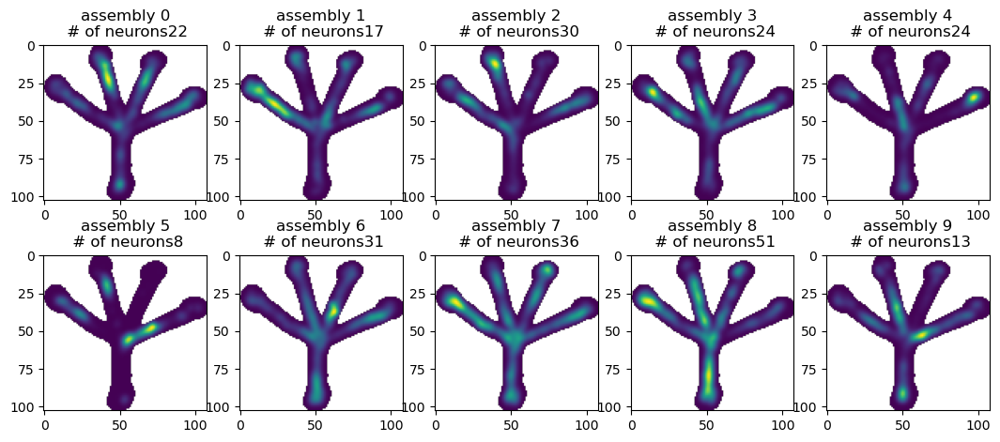

In [319]:
plot_assembly_placefield(neurons_labels_lda,neurons_ind_lda,
                         lda_vectors,cell_list_nonan,placefields,baseline)

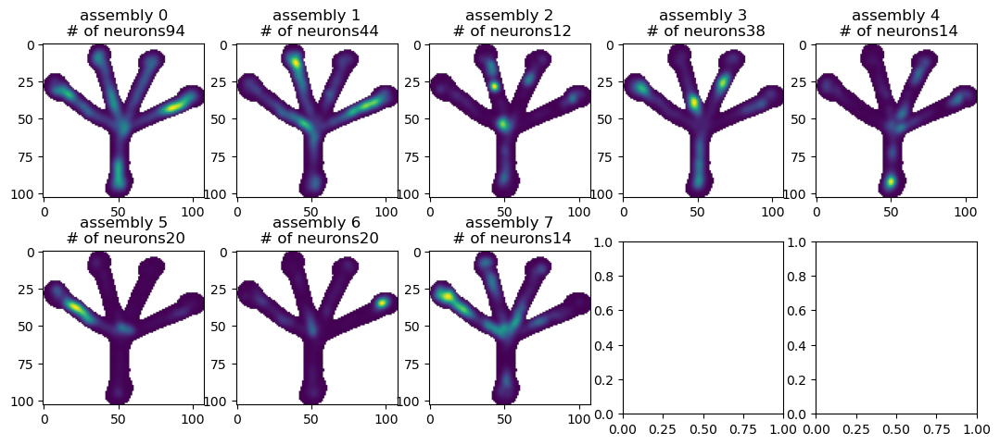

In [320]:
plot_assembly_placefield(neurons_labels_ic,neurons_ind_ic,
                         ic_vectors,cell_list_nonan,placefields,baseline)

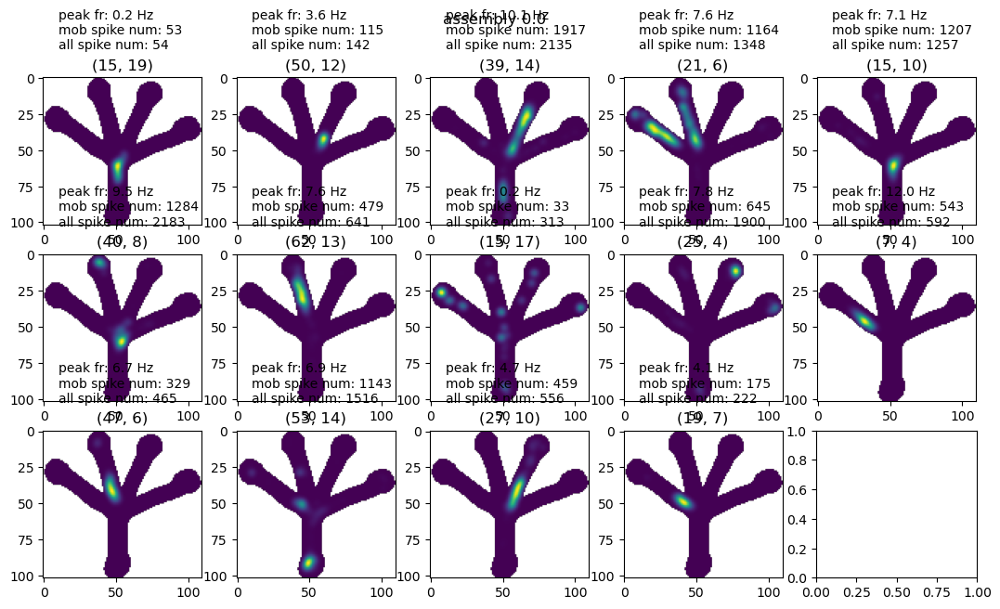

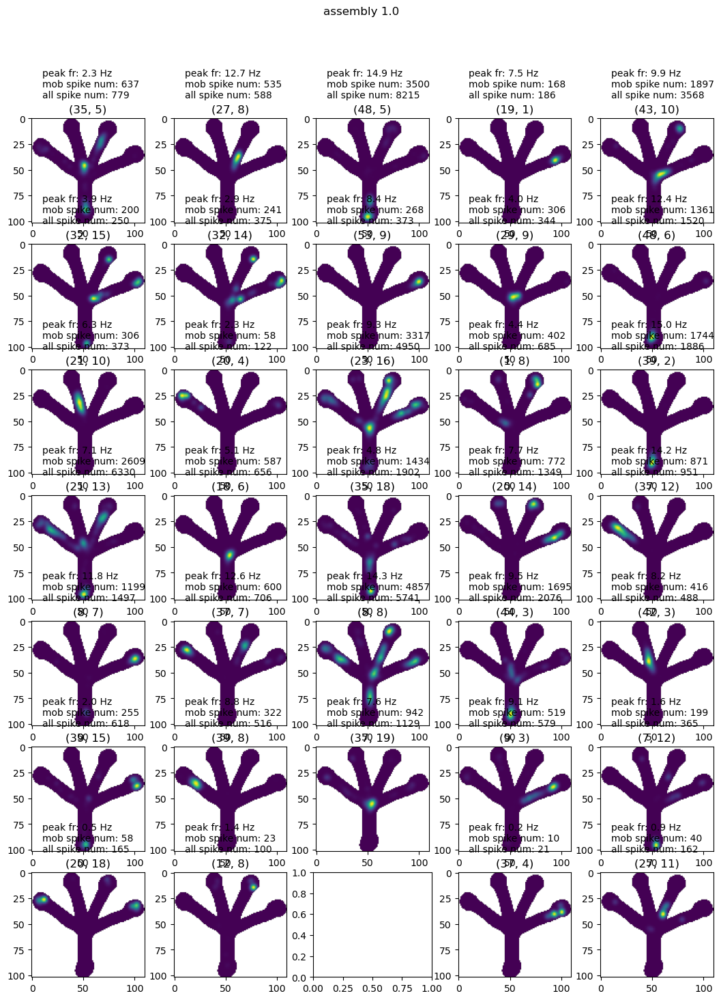

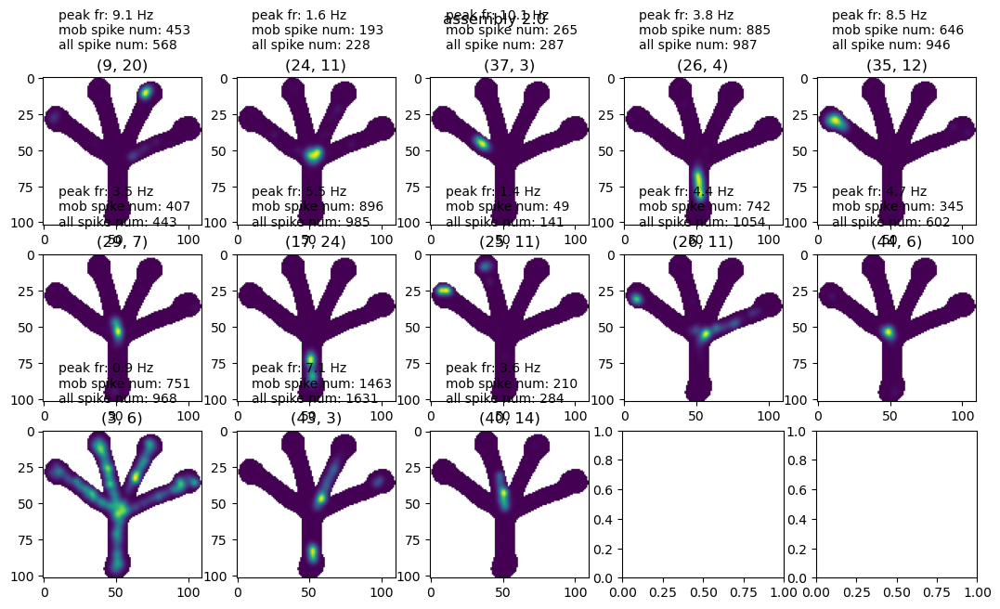

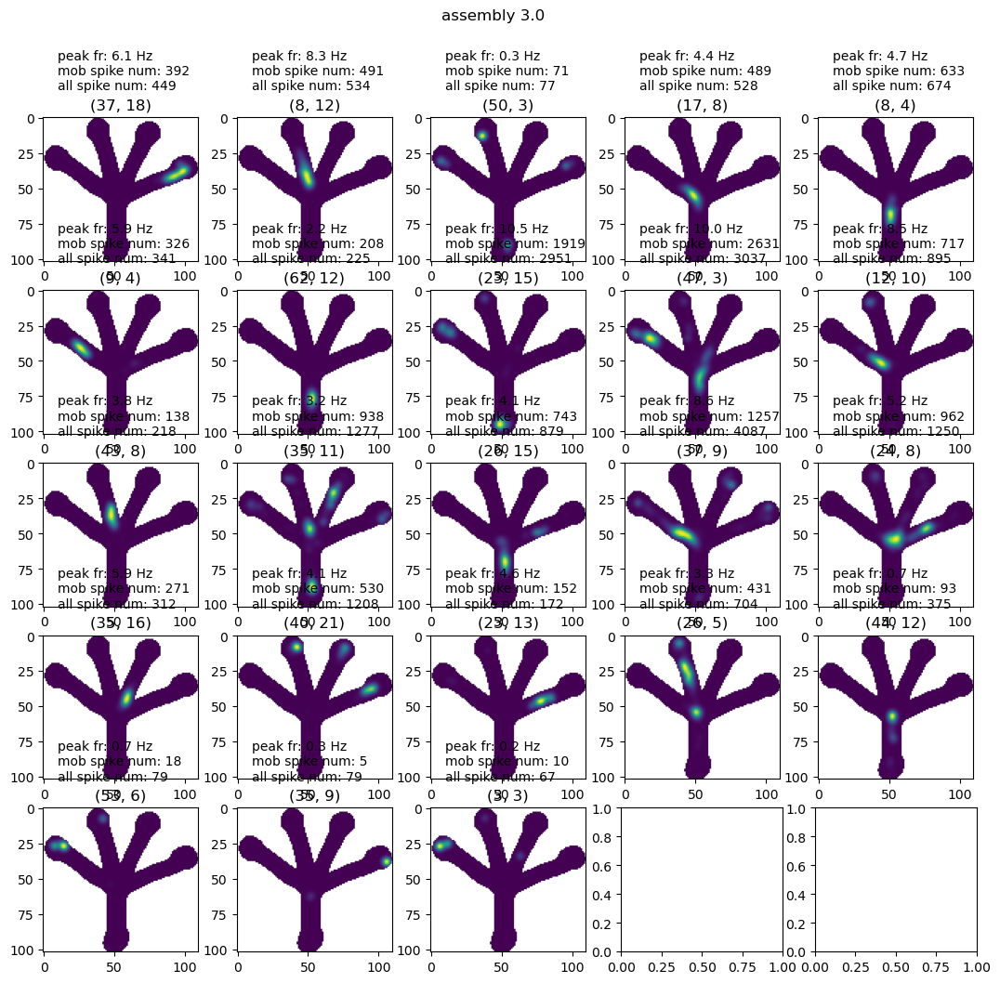

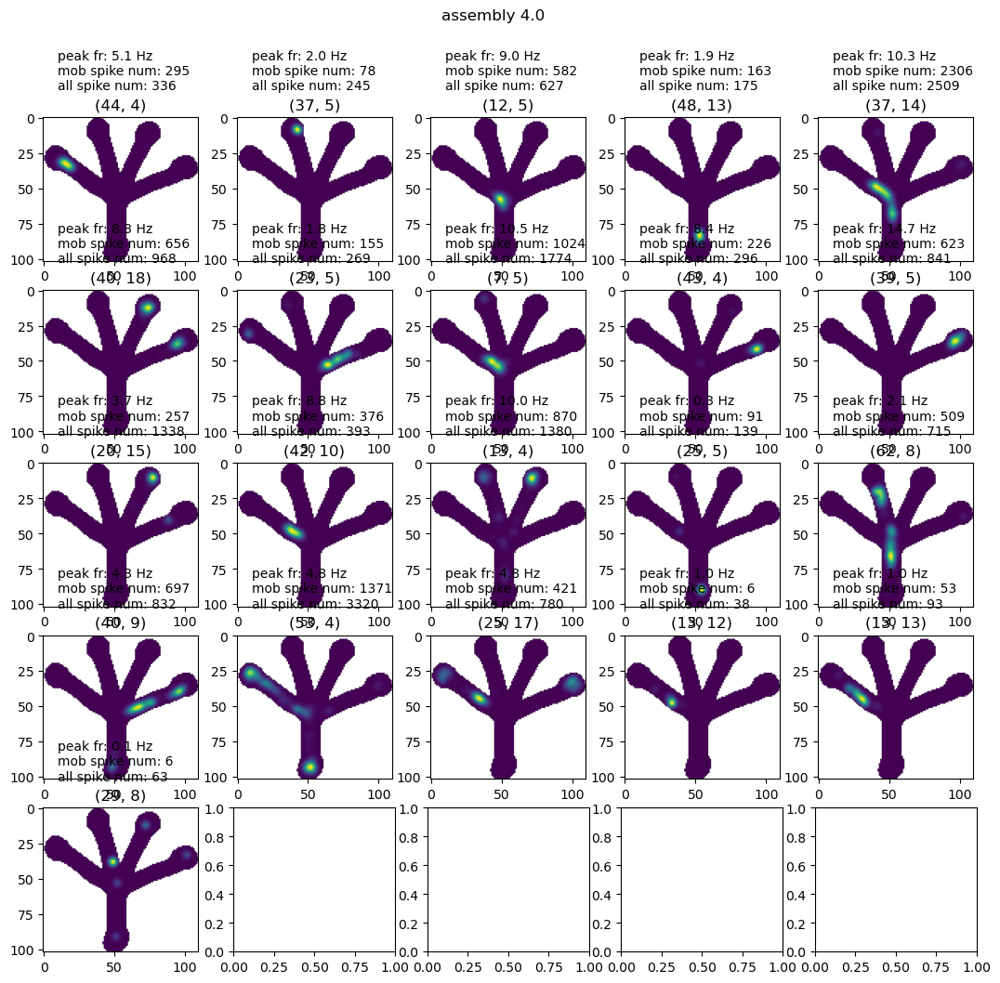

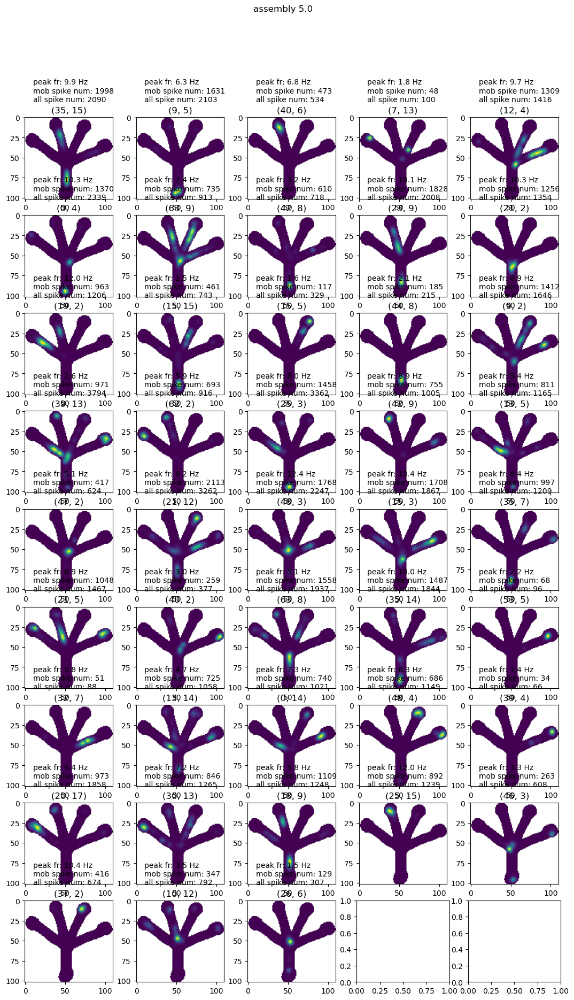

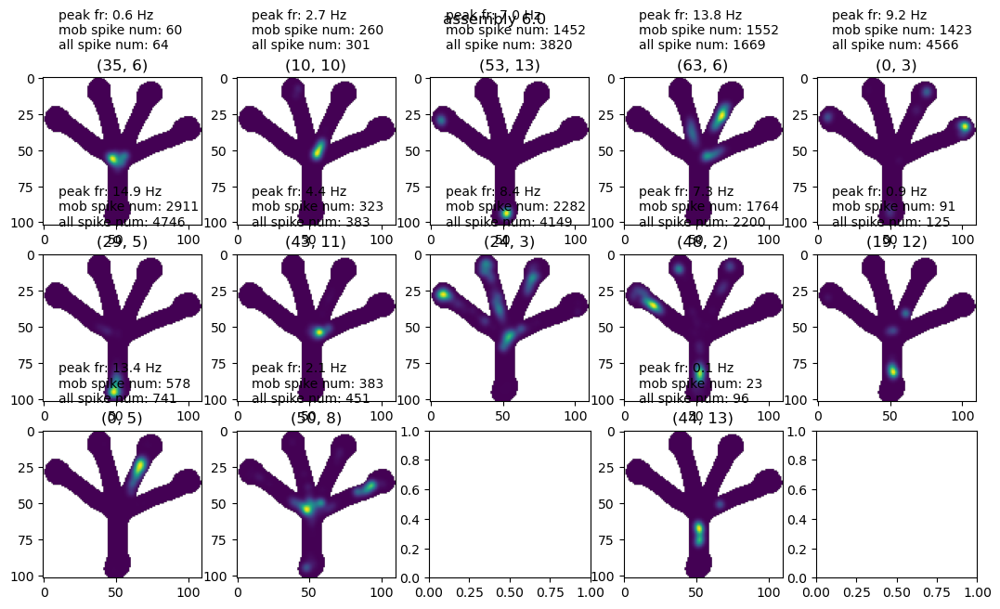

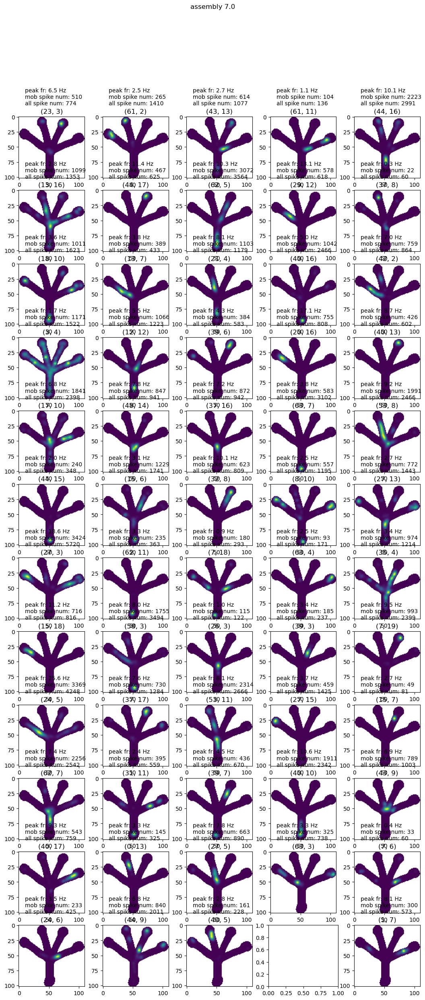

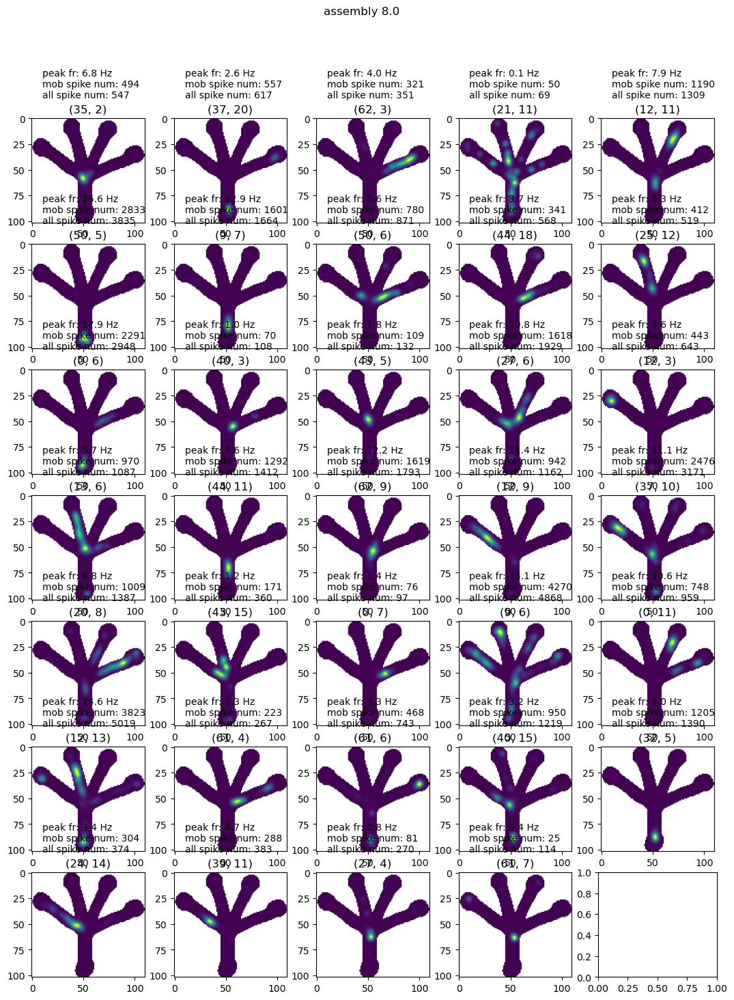

In [148]:
# each assembly plot its assembly neurons
for assembly in np.unique(neurons_labels_all_assembly):
    cell_list_assembly = [cell_list_nonan[u] for u in neurons_ind_all_assembly[neurons_labels_all_assembly == assembly]]
    
    row_num = int(np.ceil(len(cell_list_assembly)/5))
    fig, axes = plt.subplots(row_num,5, figsize = (13,7 * row_num/3), squeeze = True)

    ind = 0
    for p in np.arange(len(cell_list_assembly)):
        
        (e,u) = cell_list_assembly[p]
        try:
            axes[np.unravel_index(ind, axes.shape)].imshow(placefields[(e,u)])
            axes[np.unravel_index(ind, axes.shape)].set_title(str((e,u)))
            axes[np.unravel_index(ind, axes.shape)].text(10,-20,"peak fr: "+str(round(peak_frs[(e,u)],1))+" Hz \n" + 
                                                     "mob spike num: "+str(mobility_spike_counts[e,u]) + "\n" +
                                                     "all spike num: "+str(all_spike_counts[e,u]))
        except:
            pass
        
        ind = ind + 1
    
    for p in np.arange(ind, 10):
        axes[np.unravel_index(p, axes.shape)].set_axis_off()
    plt.suptitle("assembly " + str(assembly))

### Spectral Cluster in time direction

In [275]:
'''then use sklearn package'''
from sklearn.manifold import SpectralEmbedding

embedding = SpectralEmbedding(n_components=4,affinity='nearest_neighbors',n_neighbors=50) #n_neighbors=10
X_transformed = embedding.fit_transform(R)
X_transformed.shape

(3671, 4)

In [246]:
N = embedding.affinity_matrix_.toarray()
N_reorders,arm_breaks = reorder_affinity_by_arm(N,arm,linearized_location)

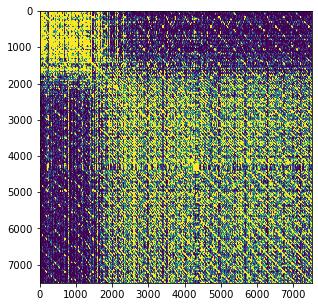

In [247]:
%matplotlib inline
fig,axes=plt.subplots(1,1,figsize=(5,5))
plt.imshow(N,vmax=0.01,interpolation='bilinear', rasterized=False)

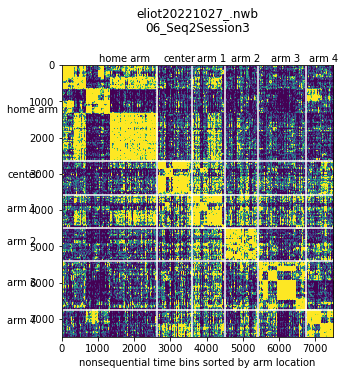

In [248]:
%matplotlib inline
fig,axes=plt.subplots(1,1,figsize=(5,5))
plt.imshow(N_reorders,vmax=0.01,interpolation='bilinear', rasterized=False)
arms_name = ['home arm','center','arm 1','arm 2','arm 3','arm 4']
a_ind=0
for a_ind in range(len(arms_name)):
    b = arm_breaks[a_ind]
    plt.axvline(b,color='w')
    plt.axhline(b,color='w')
    plt.text(-1500,0.5*(b+arm_breaks[a_ind+1]),arms_name[a_ind])
    plt.text(0.5*(b+arm_breaks[a_ind+1])-300,-100,arms_name[a_ind])
axes.set_xlabel('nonsequential time bins sorted by arm location')
figureName=nwb_copy_file_name+'_'+session_name
plt.title(nwb_copy_file_name+'\n'+session_name,y=1.1)
plt.savefig(outputFolder+figureName+'.png', dpi=300,bbox_inches='tight')
plt.savefig(outputFolder+figureName+'.pdf', dpi=300,bbox_inches='tight')

In [276]:
# color code by arms
color_palet[0,:] = [0.5,0.5,0.5]
color_palet[5,:] = [0.6,0.2,0.2]
colors_arm=[]
for t_ind in range(R.shape[0]):
    colors_arm.append(color_palet[arm[t_ind],:])

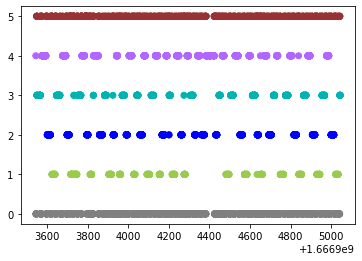

In [277]:
%matplotlib inline
plt.scatter(time_axis,arm,color=colors_arm)

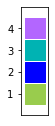

In [199]:
fig,axes=plt.subplots(1,1,figsize=(0.5,2))
for i in range(1,5):
    plt.scatter(1,i,color=color_palet[i,:],s=400,marker='s');
axes.get_xaxis().set_ticks([]);
plt.ylim(0, 5)
axes.get_yaxis().set_ticks([1,2,3,4]);

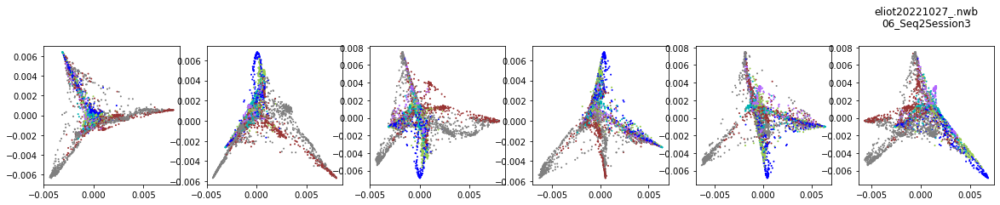

In [278]:
%matplotlib inline

fig,axes=plt.subplots(1,6,figsize=(20,3))

axes[0].scatter(X_transformed[:,0],X_transformed[:,1],color=colors_arm,s=1)
axes[1].scatter(X_transformed[:,0],X_transformed[:,2],color=colors_arm,s=1)
axes[2].scatter(X_transformed[:,0],X_transformed[:,3],color=colors_arm,s=1)
axes[3].scatter(X_transformed[:,1],X_transformed[:,2],color=colors_arm,s=1)
axes[4].scatter(X_transformed[:,1],X_transformed[:,3],color=colors_arm,s=1)
axes[5].scatter(X_transformed[:,2],X_transformed[:,3],color=colors_arm,s=1)

figureName=nwb_copy_file_name+'_'+session_name+'_Laplacian'
plt.title(nwb_copy_file_name+'\n'+session_name,y=1.1)
plt.savefig(outputFolder+figureName+'.png', dpi=300,bbox_inches='tight')
plt.savefig(outputFolder+figureName+'.pdf', dpi=300,bbox_inches='tight')


### Color result by time

In [318]:
import matplotlib.cm as cm
from matplotlib.colors import Normalize

colors=[]
for t_ind in range(len(time_axis)-1):
    colors.append(cm.jet(t_ind/len(time_axis)))

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


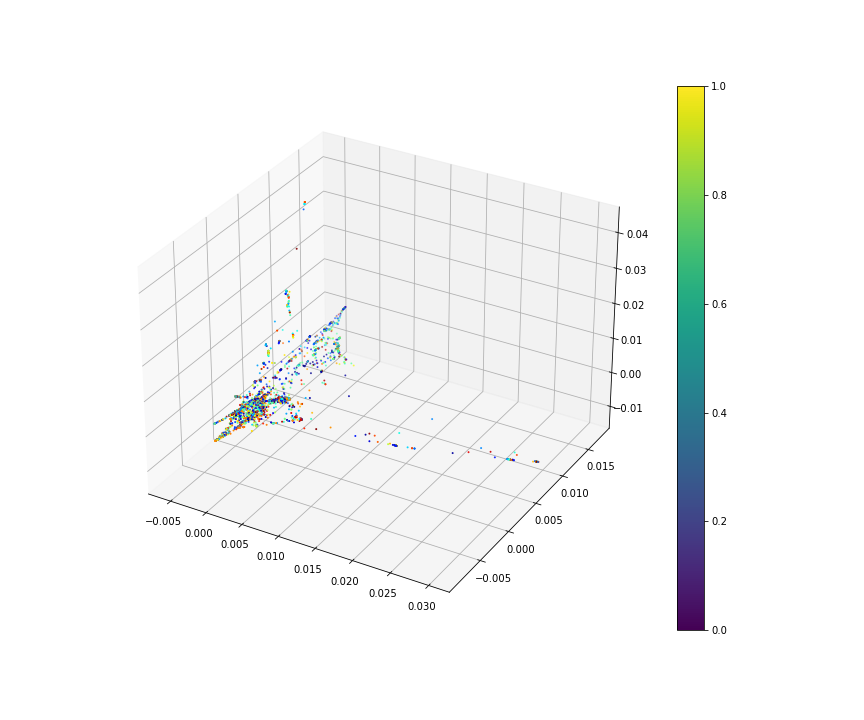

In [319]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,10))
ax=plt.subplot(1,1,1,projection='3d')

plot = ax.scatter(X_transformed[:,0],X_transformed[:,1],X_transformed[:,2],color=colors,s=1)
plt.colorbar(plot)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


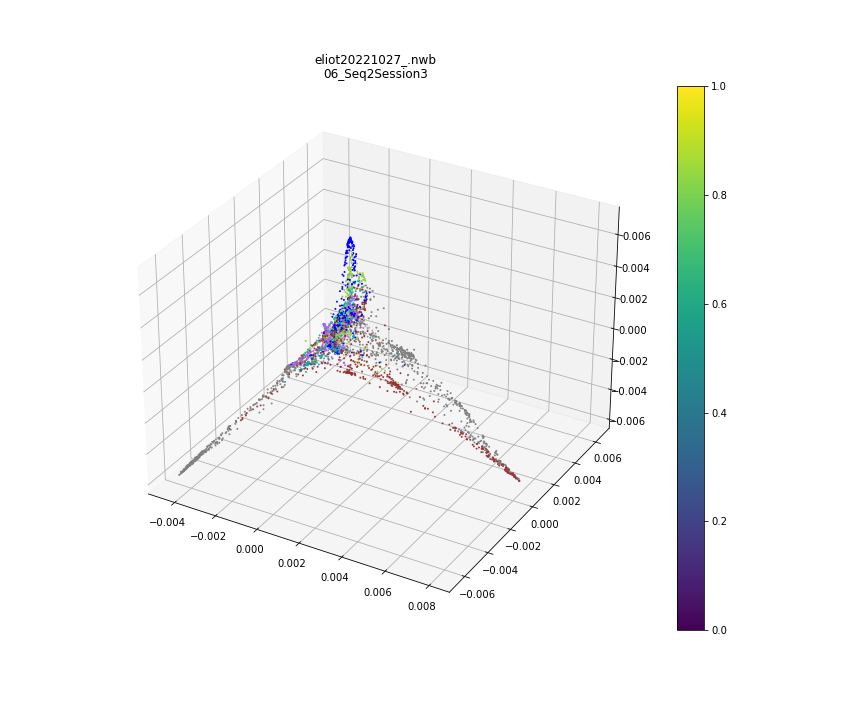

In [279]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,10))
ax=plt.subplot(1,1,1,projection='3d')

plot = ax.scatter(X_transformed[:,0],X_transformed[:,1],X_transformed[:,2],color=colors_arm,s=1)
plt.colorbar(plot)

figureName=nwb_copy_file_name+'_'+session_name+'_Laplacian3D'
plt.title(nwb_copy_file_name+'\n'+session_name,y=1.1)
plt.savefig(outputFolder+figureName+'.png', dpi=300,bbox_inches='tight')
plt.savefig(outputFolder+figureName+'.pdf', dpi=300,bbox_inches='tight')

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


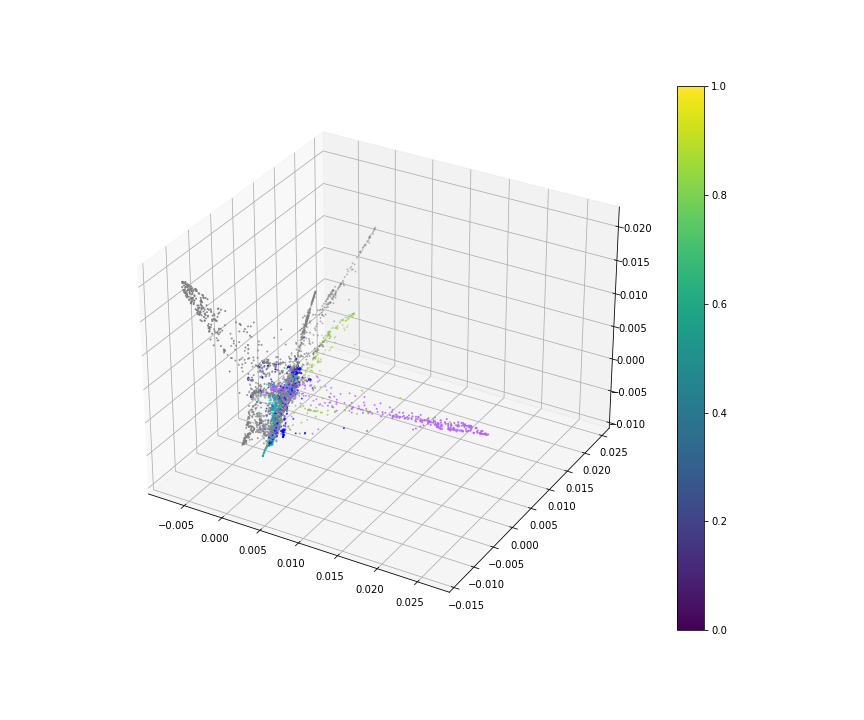

In [596]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,10))
ax=plt.subplot(1,1,1,projection='3d')

plot = ax.scatter(X_transformed[:,1],X_transformed[:,2],X_transformed[:,3],color=colors_arm,s=1)
plt.colorbar(plot)

#### (2) Find cell groups

In [409]:
loading = X_transformed.T @ R

In [410]:
C_embedding = SpectralEmbedding(n_components=3,affinity='nearest_neighbors',n_neighbors=10)
C_transformed = C_embedding.fit_transform(loading.T)
C_transformed.shape

(63, 3)

In [411]:
order = []
cell_group = np.argmax(C_transformed.T,axis=0)
for g in range(C_transformed.shape[1]):
    subordering = np.argsort(-C_transformed[cell_group == g,g])
    order.append(np.argwhere(cell_group == g).ravel()[subordering])
cell_ind=np.hstack(order)
block_boundary=np.argwhere(np.diff(cell_group[cell_ind])).ravel()+1

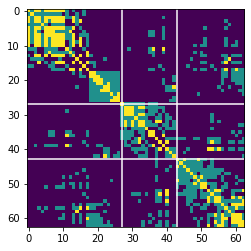

In [412]:
N = C_embedding.affinity_matrix_.toarray() #np.cov(R.T)
plt.imshow(N[cell_ind][:,cell_ind])
for b in block_boundary:
    plt.axvline(b,color='w')
    plt.axhline(b,color='w')

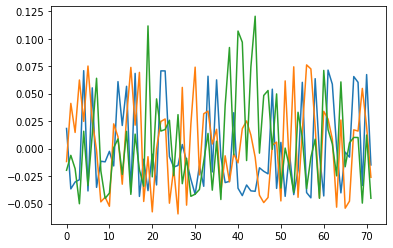

In [152]:
plt.plot(C_transformed)

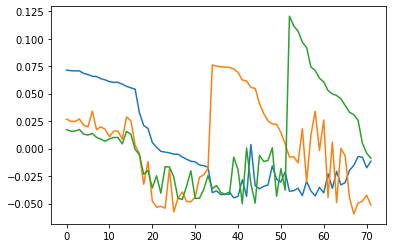

In [153]:
plt.plot(C_transformed[cell_ind,:])

### UMAP

In [280]:
R.shape

(3671, 72)

In [281]:
import umap
reducer = umap.UMAP(n_neighbors=40,min_dist=0.3,n_components=3,metric='cosine') #local_connectivity=15, #40 for early learning
embedding = reducer.fit_transform(R)
embedding.shape

(3671, 3)

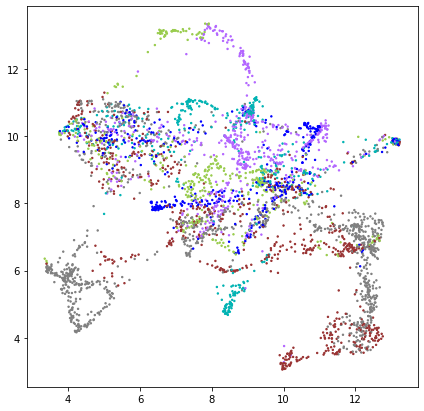

In [282]:
%matplotlib inline

fig,axes=plt.subplots(1,1,figsize=(7,7))

axes.scatter(embedding[:,0],embedding[:,1],color=colors_arm,s=2)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


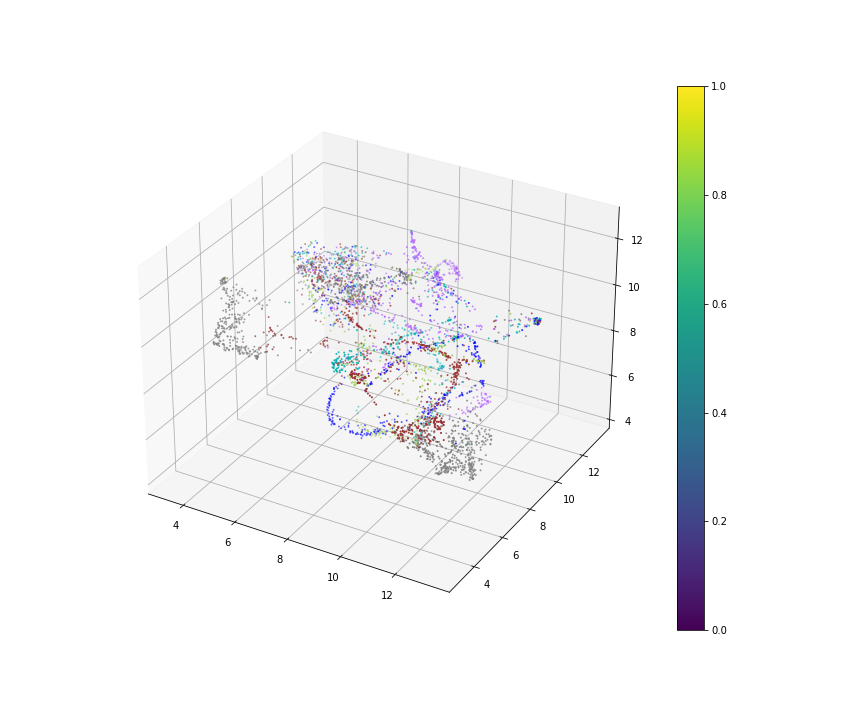

In [283]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,10))
ax=plt.subplot(1,1,1,projection='3d')

plot = ax.scatter(embedding[:,0],embedding[:,1],embedding[:,2],color=colors_arm,s=1)
plt.colorbar(plot)

In [284]:
import umap
reducer = umap.UMAP(n_neighbors=50,min_dist=0.25,metric='cosine',output_metric='haversine',n_components=2) #min_dist=0.2 #local_connectivity=15
embedding = reducer.fit_transform(R)
embedding.shape

(3671, 2)

In [285]:
x = np.sin(embedding[:, 0]) * np.cos(embedding[:, 1])
y = np.sin(embedding[:, 0]) * np.sin(embedding[:, 1])
z = np.cos(embedding[:, 0])

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


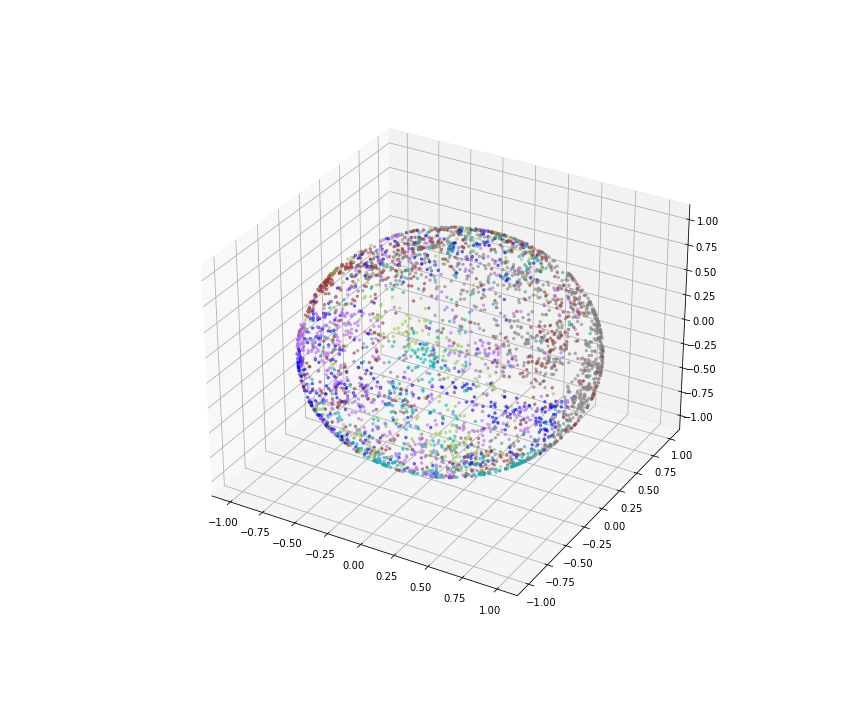

In [286]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,10))
ax=plt.subplot(1,1,1,projection='3d')

ax.scatter(x,y,z,color=colors_arm,s=6,alpha=0.5)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


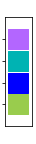

In [603]:
fig,axes=plt.subplots(1,1,figsize=(0.5,2))
for i in range(1,5):
    plt.scatter(1,i,color=color_palet[i,:],s=400,marker='s');
axes.get_xaxis().set_ticks([]);
plt.ylim(0, 5)
axes.get_yaxis().set_ticks([1,2,3,4]);

In [ ]:
%matplotlib widget
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,10))
ax=plt.subplot(1,1,1,projection='3d')

plot = ax.scatter(X_transformed[:,0],X_transformed[:,1],X_transformed[:,2],color=colors_arm,s=1)
plt.colorbar(plot)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/ipywidgets/widgets/widget.py:477: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super(Widget, self).__init__(**kwargs)


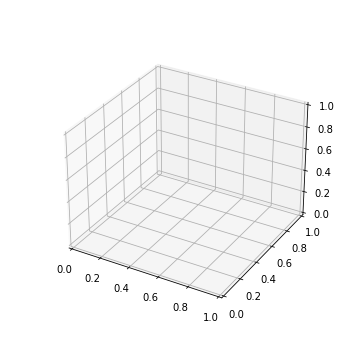

In [50]:
%matplotlib notebook
#widget
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
import time

fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(projection='3d')

def animation(i):
    ax.scatter(X_transformed[i,1],X_transformed[i,2],X_transformed[i,3],color='k')
    
ani = FuncAnimation(fig, animation, frames=len(X_transformed[:,1]),interval=20)
plt.show()


## END HERE

### Spectrial Clustering in cell direction

In [440]:
## unused
'''then use sklearn package'''
from sklearn.manifold import SpectralEmbedding

embedding = SpectralEmbedding(n_components=10,affinity='nearest_neighbors',n_neighbors=10)
X_transformed = embedding.fit_transform(R.T)
X_transformed.shape

def pick_high_ind(value):
    # also in the order of descending value
    sort_ind = np.argsort(-value)
    return sort_ind[value[sort_ind]>=np.quantile(value,0.95)]

ind = []
arm_ind=[]
for i in range(10):
    ind.append(pick_high_ind(embedding.embedding_[:,i]))
    arm_ind.append(np.ones(len(pick_high_ind(X_transformed[:,i])))*i)
ind=np.concatenate(ind)
arm_ind=np.concatenate(arm_ind)

_, idx = np.unique(ind, return_index=True)
ind = ind[np.sort(idx)]
arm_ind_ = arm_ind[np.sort(idx)]

arm_breaks=np.argwhere(np.diff(arm_ind_)).ravel()+1
arm_breaks=np.concatenate(([0],arm_breaks))

N=embedding.affinity_matrix_.toarray()
N_=N[ind,:]
N_=N_[:,ind]
%matplotlib inline
fig,axes=plt.subplots(1,1,figsize=(5,5))
plt.imshow(N_)
for b in arm_breaks:
    plt.axvline(b,color='w')
    plt.axhline(b,color='w')

(51, 10)